In [14]:
import os
import sys
import glob
import datetime

import gzip
import pickle

import numpy as np
import pandas as pd
import scipy 


import matplotlib.pyplot as plt
import seaborn as sns

import biosppy
from biosppy.signals import ecg
from scipy import signal
import pyhrv
import pyhrv.tools as tools
import pyhrv.time_domain as td

import heartpy as hp
from scipy.signal import resample
# import matplotlib as mpl
# # %matplotlib
# mpl.use('TkAgg')

In [15]:
# current work directory
path = os.path.abspath(os.getcwd())
print('경로:',path)
# directory file list
# file_list = glob.glob(path+ '/**/*.csv')

DEVICES = ['H10', 'VERITY']
PROTOCOL = ['RESTING', 'MAST']

# 시간은 초

RESTING_TIME = [420]
MAST_TIME = [300, 90, 45, 60, 60, 60, 90, 90, 45, 60]

# 데이터 시간, 인덱스, ppg 센서 3개, ambient 센서, 수동 입력 marker
##(중요) ppg 처리 로직 있는지 확인 중!!!!!!!!
VERITY_COL = ['time', 'idx', 'ppg0', 'ppg1', 'ppg2', 'ambient', 'marker']
VERITY_FS = 55.0
# 심박 ecg 센서
H10_COL = ['time', 'idx', 'sensor', 'marker']
H10_FS = 130.0

TIME_FORMAT = "%Y%m%d%H%M%S%f"

# time interval caculation을 위한 
Z_list = [0]

경로: /home/pilab/workspace/Stress_sensor_data_processing


In [16]:
def file_search(path):
    '''
        Mast, Resting csv 파일 찾는 함수
        근데 이거 왜 만듬?
        
        path = 현재 작업 디렉토리 절대 위치
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    try:
        filenames = os.listdir(path)
        for filename in filenames:
            full_filename = os.path.join(path, filename)
            if filename == 'Mast':
                # mast_path = full_filename
                file_list_mast = sorted([f for f in os.listdir(full_filename) if f.startswith('(M)')])
            elif filename == 'Resting':
                # resting_path = full_filename
                file_list_resting = sorted([f for f in os.listdir(full_filename) if f.startswith('(H)')])
            else:
                pass 
        # return file_list_mast, file_list_resting, resting_path, mast_path
        return file_list_mast, file_list_resting
    
    except PermissionError:
        print('file search fail')
        pass
    
# file_list_mast, file_list_resting, resting_path, mast_path = file_search(path)
file_list_mast, file_list_resting = file_search(path)
# file_search(path)

In [17]:
def device_listing(file_list):
    '''
        기기 별 csv 파일 찾는 함수
        기기 별로 찾아야 할지, 피험자 별로 찾아야할지 아직 모르겠음, 둘다 해야겠지?
        
        파일 명명 로직:(F)_subject_day_time_sensor
    '''
    # polar sensor data list
    try:
        if file_list[0][:3] == ('(H)'):
            print('Resting data')
        elif file_list[0][:3] == ('(M)'):
            print('Mast data')
            
        file_list_h10 = sorted([f for f in file_list if f.endswith('H10.csv')])
        file_list_verity = sorted([f for f in file_list if f.endswith('Verity.csv')])
        print('Got list')
    except:
        print('wrong list or files')

    return {'h10':file_list_h10, 'verity': file_list_verity}
    

resting_device_dict = device_listing(file_list_resting)
mast_device_dict = device_listing(file_list_mast)

Resting data
Got list
Mast data
Got list


In [18]:
def id_listing():
    return
# print('*** Rest h10 데이터:',rest_file_list_h10)
print('h10 데이터 개수',len(mast_device_dict['h10']),'개')
# print('*** Rest verity 데이터:',rest_file_list_verity)
print('verity 데이터 개수',len(mast_device_dict['verity']),'개')

# 파일 별  분석하려고 대충 보고 있는 for loop
if len(mast_device_dict['h10']) == len(mast_device_dict['verity']):
    print('Number of Data equl')
#     i = 1
#     for h10, verity in zip(rest_file_list_h10, rest_file_list_verity):
        
#         print()
#         print(f'{i}-1:',h10)
#         print('ID:',h10[3:6])
#         print('Date:',h10[7:22])

#         print(f'{i}-2:',verity)
#         print('ID:',verity[3:6])
#         print('Date:',verity[7:22])
        
#         i += 1
else:
    print('expected data missing')

h10 데이터 개수 21 개
verity 데이터 개수 21 개
Number of Data equl


In [19]:
def date_data_load(device_file_dict = {}, date = '20230101', task = 'resting'):
    date_h10_dict = {}
    date_verity_dict = {}
    if task == 'resting':
        task_path = path + '/Resting/'
    else:
        task_path = path + '/Mast/'
    
    for i in device_file_dict:
        if i == 'h10':
            date_h10 = [data for data in device_file_dict[i] if date in data]
        elif i == 'verity':
            date_verity = [data for data in device_file_dict[i] if date in data]
        else:
            print('someting is wrong')
            
    print('Data Loading...')
    for df in  date_h10:
        date_h10_dict[df] = pd.read_csv(task_path + df, names = H10_COL)
    for df in  date_verity:
        date_verity_dict[df] = pd.read_csv(task_path + df, names = VERITY_COL)
    print('Data Load complete')

    print(f'{date} - H10 데이터: {len(date_h10_dict)} 개')
    print(f'{date} - Verity 데이터: {len(date_verity_dict)} 개')
            
    return {'h10_dict': date_h10_dict, 'verity_dict': date_verity_dict}


# rest_h10_dict, rest_verity_dict =  date_listing(rest_file_list_h10, rest_file_list_verity)
# dir(rest_file_list_h10)
mast_date_dict_list = date_data_load(mast_device_dict, '20230507', 'mast')

Data Loading...
Data Load complete
20230507 - H10 데이터: 20 개
20230507 - Verity 데이터: 20 개


In [20]:
# Data check 1
for i in mast_date_dict_list:
    try:
        with gzip.open(f'./pkl/{i}_mast.pickle','rb') as f:
            df = pickle.load(f)
    except:
        pass
    if len(df) == 0 :
        df = pd.DataFrame(columns = ['id', 'date', 'protocol', 'device', 'start', 'end', 'total', 'avg', 'fs'])
    print(df)

    for j in mast_date_dict_list[i]:
        # print(j)
        if j.endswith('H10.csv'):
            # print('H10 모양 :', mast_date_dict_list[i][j].shape)
            h10_rows, h10_columns = mast_date_dict_list[i][j].shape
            if h10_columns == 4:
                # print('H10 Data columns length is correct')
                pass
            else:
                break
                print('H10 Data columns length is Not correct')
        elif j.endswith('Verity.csv'):
            # print('verity 모양 :', mast_date_dict_list[i][j].shape)
            verity_rows, verity_columns = mast_date_dict_list[i][j].shape
            if verity_columns == 7:
                # print('Verity sensor Data columns length is correct')
                pass
            else:
                break
                print('Verity sensor Data columns length is Not correct')
    print(i + ' OK!')
    
    for j in mast_date_dict_list[i]:
        print(j)
        mast_date_dict_list[i][j]['times'] = pd.to_datetime(mast_date_dict_list[i][j]['time'], 
                                                               format = TIME_FORMAT)
        mast_date_dict_list[i][j]['interval'] = \
            Z_list + [mast_date_dict_list[i][j]['times'].loc[k+1]-mast_date_dict_list[i][j]['times'].loc[k] 
                      for k in range(len(mast_date_dict_list[i][j])-1)]
        
        mast_start_time = mast_date_dict_list[i][j].iloc[0][-2]
        mast_end_time = mast_date_dict_list[i][j].iloc[-1][-2]
        mast_total_time = mast_end_time-mast_start_time
        mast_time_resolution = (mast_end_time-mast_start_time)/ len(mast_date_dict_list[i][j])
        mast_fs = 1/ mast_time_resolution.total_seconds()
        
        print('Time domain window')
        print('시작 시간:',mast_start_time, '종료 시간:',mast_end_time, '총 측정 시간:', mast_total_time)
        
        if 20 <= abs(mast_total_time.total_seconds()-MAST_TIME[0]):
            print('Wrong measurement time')

        print('해상도:', mast_time_resolution, 'fs:', mast_fs)

        row = pd.DataFrame({'id':[j[3:6]], 'date':[j[7:22]], 'protocol':[j[1:2]], 'device':[j[23:-4]], 
                        'start':[mast_start_time], 'end':[mast_end_time], 'total':[mast_total_time],
                        'avg':[mast_time_resolution], 'fs':[mast_fs]})
        df = pd.concat([df, row]).drop_duplicates().reset_index(drop=True)
        
#         if 'h10' in i:

#             if mast_fs <= 0.07693 and mast_fs >= 0.07692:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
#         else:
#             print('해상도:', mast_time_resolution, 'fs:', mast_fs)
#             if rest_h10_fs <= 0.018182 and rest_h10_fs >= 18181:
#                 # print("Hz correct.")
#                 pass
#             else:
#                 print("Hz Error!!!!")
        # print('interval data...')
        # print(mast_date_dict_list[i][j]['interval'])
            # time col datatype cast to datetime 

        print('----------------------------------------------------------------------')

    if 'h10' in i:
        mast_h10_dict = mast_date_dict_list[i]
    else:
        mast_verity_dict = mast_date_dict_list[i]
    
    with gzip.open(f'./pkl/{i}_mast.pickle', 'wb') as f:
        pickle.dump(df, f)

     id             date protocol  device                      start   
0   001  20230429_091641        H     H10 2023-04-29 09:16:41.348517  \
1   002  20230429_102726        H     H10 2023-04-29 10:27:26.020477   
2   003  20230429_105826        H     H10 2023-04-29 10:58:26.132409   
3   004  20230429_100701        H     H10 2023-04-29 10:07:01.448371   
4   005  20230429_120717        H     H10 2023-04-29 12:07:17.070825   
..  ...              ...      ...     ...                        ...   
72  016  20230507_085913        M  Verity 2023-05-07 08:59:13.318244   
73  017  20230507_110427        M  Verity 2023-05-07 11:04:27.194478   
74  018  20230507_100932        M  Verity 2023-05-07 10:09:32.710617   
75  019  20230507_101420        M  Verity 2023-05-07 10:14:20.751960   
76  020  20230507_122941        M  Verity 2023-05-07 12:29:41.198915   

                          end                  total   
0  2023-04-29 09:23:42.218059 0 days 00:07:00.869542  \
1  2023-04-29 10:34:13.

In [21]:
# pd.set_option('display.max_row', None)
# pd.set_option('display.max_columns', None)
# print(mast_h10['interval'])

In [22]:
# index to time 사실 필요없고 오히려 방해됨... 수정 필수
# mast_h10 = mast_h10.set_index('times')
# mast_verity = mast_verity.set_index('times')
# sns.set(rc={'figure.figsize':(11, 4)})

In [23]:
def reject_outliers(sr, iq_range=0.5):
    pcnt = (1 - iq_range) / 2
    qlow, median, qhigh = sr.dropna().quantile([pcnt, 0.50, 1-pcnt])
    iqr = qhigh - qlow
    return sr[ (sr - median).abs() <= iqr]

(M)001_20230507_093641_Verity.csv
인덱스 길이: 13854
ppg0 - skew 0.3520068030210213
ppg0 - kutosis -0.4620565457541046


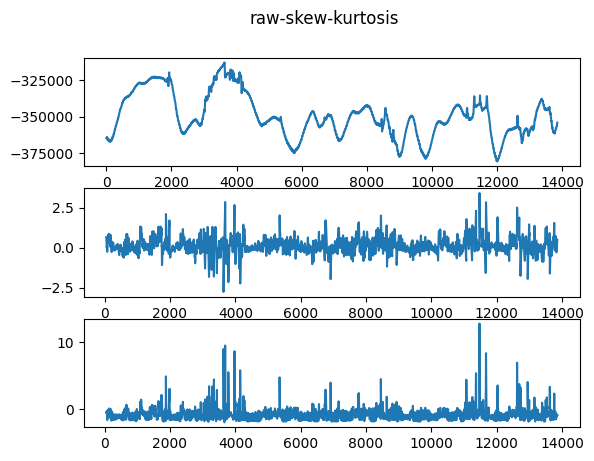

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.6038579707470082
ppg1 - kutosis -0.42288340039666394


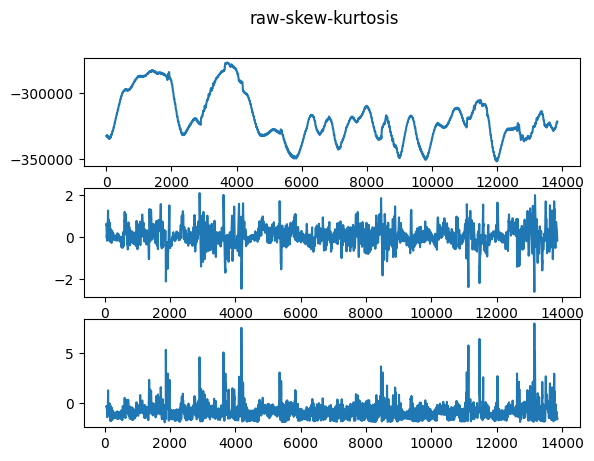

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.5806362615602959
ppg2 - kutosis -0.3939268192203973


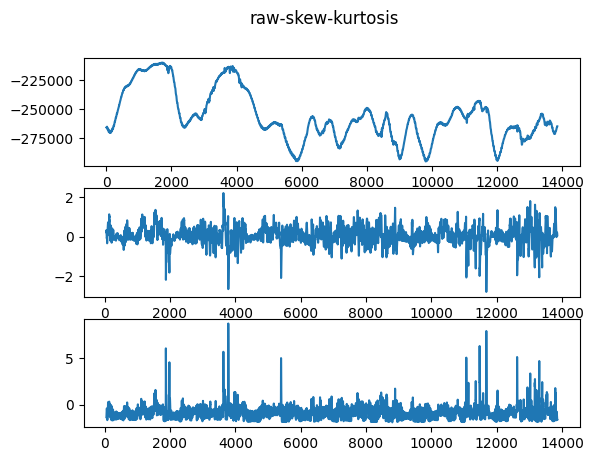

<Figure size 1200x800 with 0 Axes>

(M)001_20230507_094057_Verity.csv
인덱스 길이: 60755
ppg0 - skew -0.10343050283120471
ppg0 - kutosis 0.1869356054798783


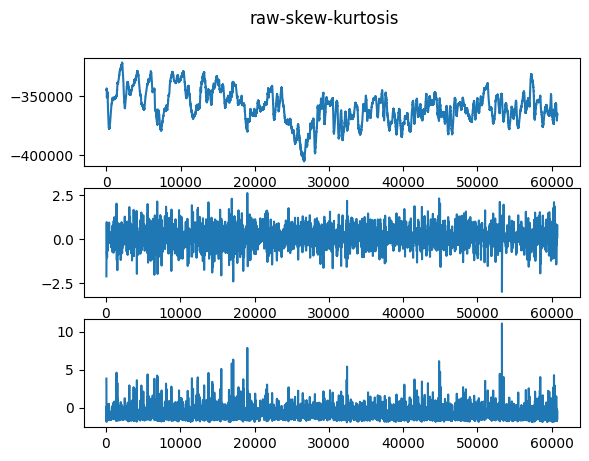

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.17271247323285277
ppg1 - kutosis 0.4325897757537853


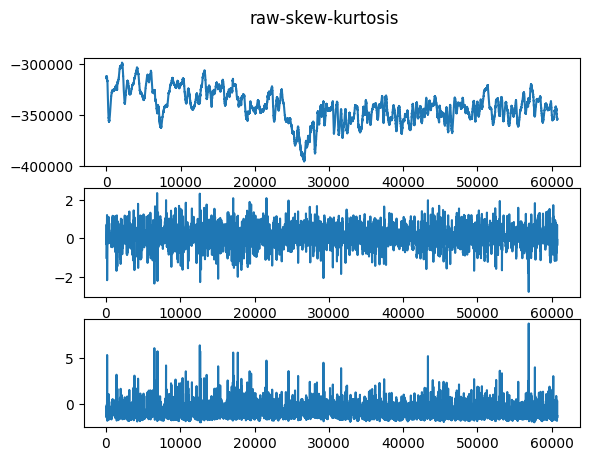

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -0.2398595110333579
ppg2 - kutosis 0.36086198650955525


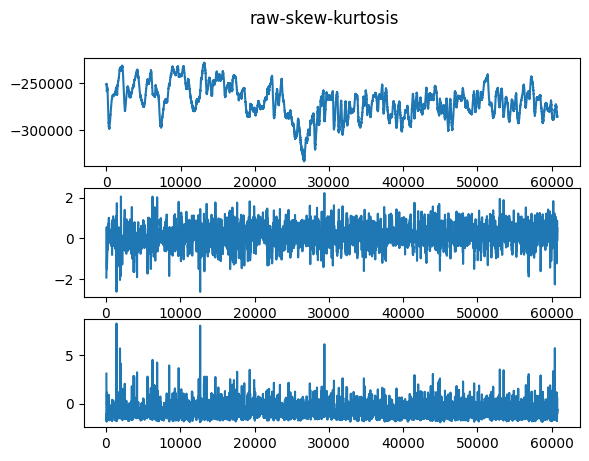

<Figure size 1200x800 with 0 Axes>

(M)002_20230507_103326_Verity.csv
인덱스 길이: 77236
ppg0 - skew 1.564464694048176
ppg0 - kutosis 4.351768072618865


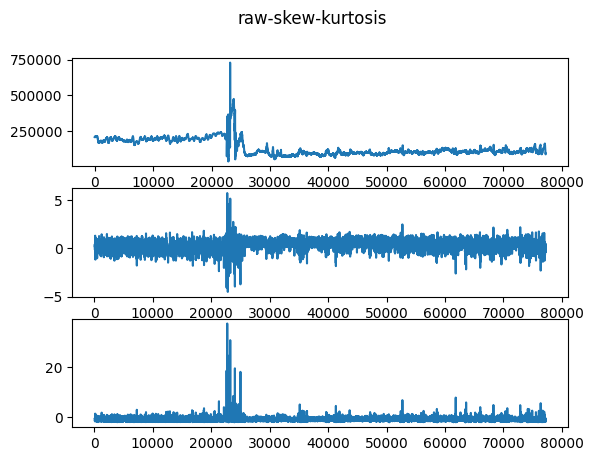

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 5.891916639011124
ppg1 - kutosis 43.04099437466764


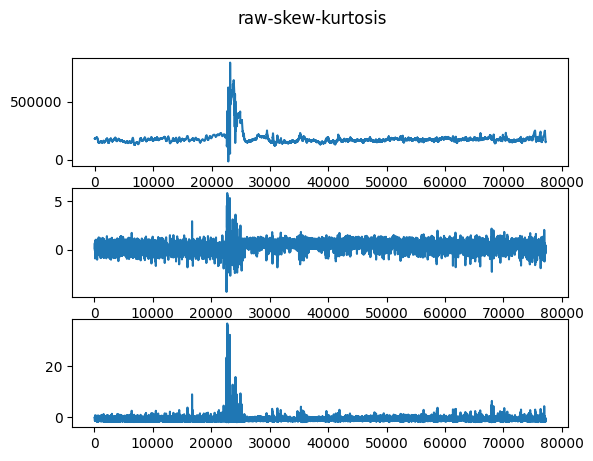

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 3.352405140844782
ppg2 - kutosis 19.224569769335236


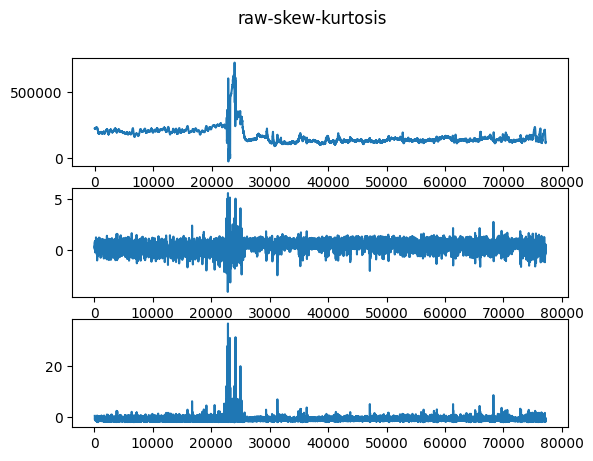

<Figure size 1200x800 with 0 Axes>

(M)003_20230507_090129_Verity.csv
인덱스 길이: 77088
ppg0 - skew 9.409045729245008
ppg0 - kutosis 193.81654154540652


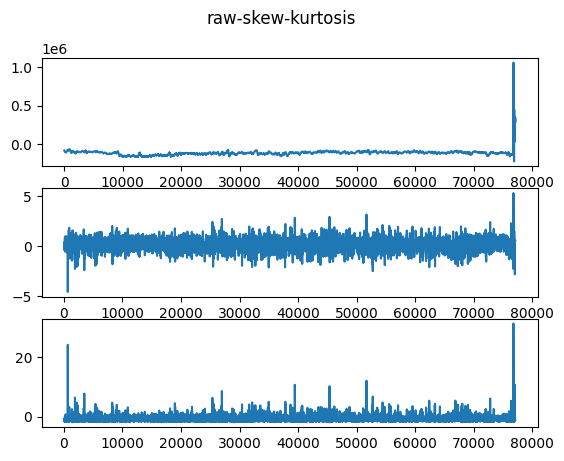

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 6.740184983775751
ppg1 - kutosis 142.28850372409917


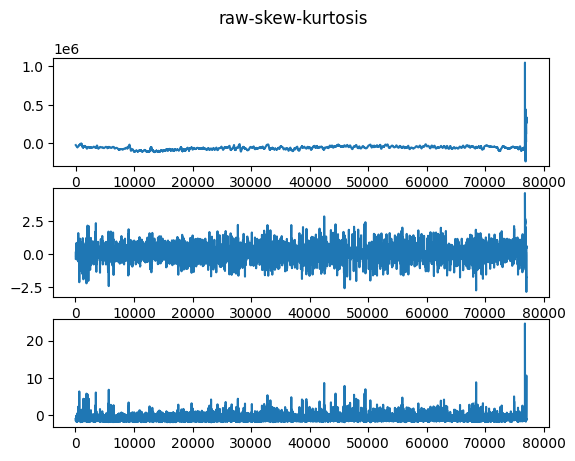

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 4.382786819616862
ppg2 - kutosis 152.06017257911031


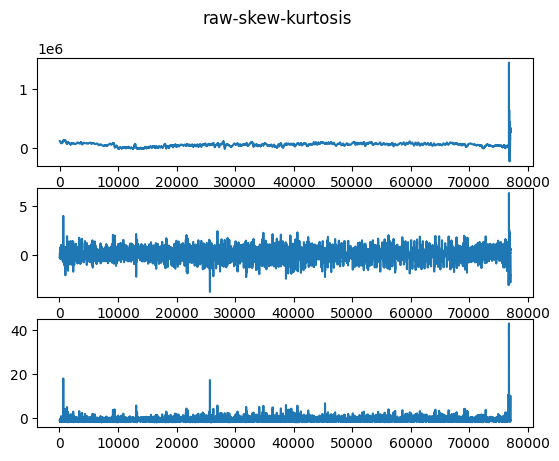

<Figure size 1200x800 with 0 Axes>

(M)004_20230507_093440_Verity.csv
인덱스 길이: 65531
ppg0 - skew 0.5653874883516422
ppg0 - kutosis 0.9546528747443017


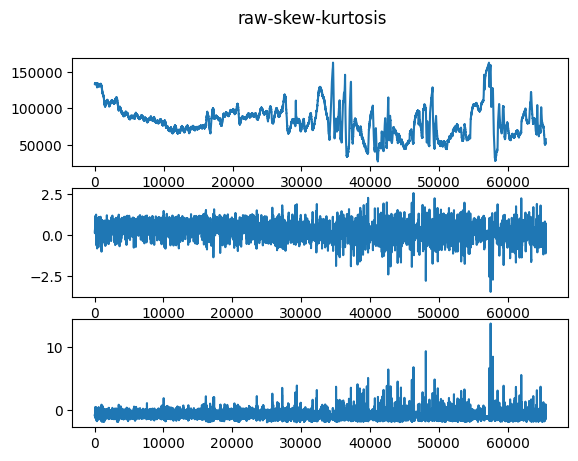

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.6790459477084431
ppg1 - kutosis 1.25739237276896


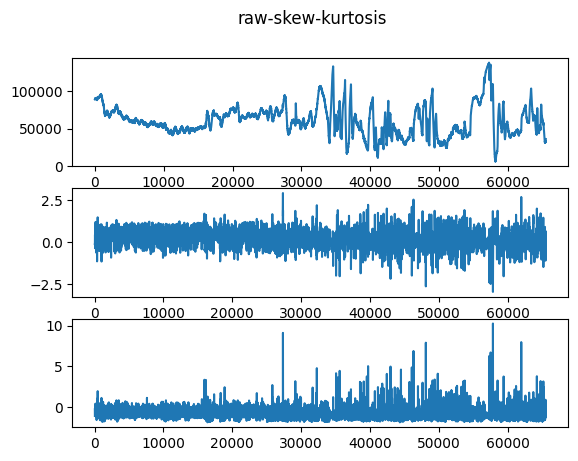

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.253338122594677
ppg2 - kutosis 0.073179718631879


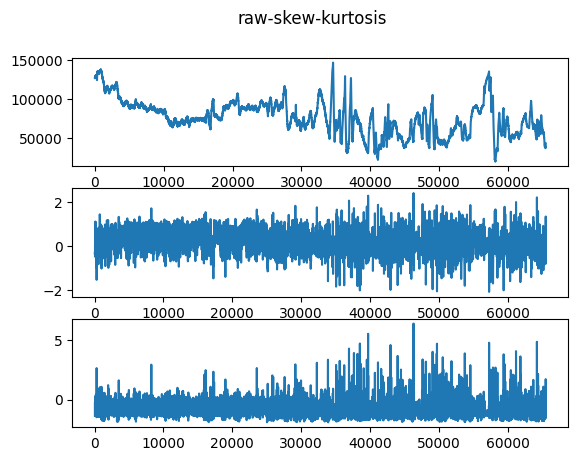

<Figure size 1200x800 with 0 Axes>

(M)005_20230507_113956_Verity.csv
인덱스 길이: 66573
ppg0 - skew 0.355600686234192
ppg0 - kutosis -0.47222636261936746


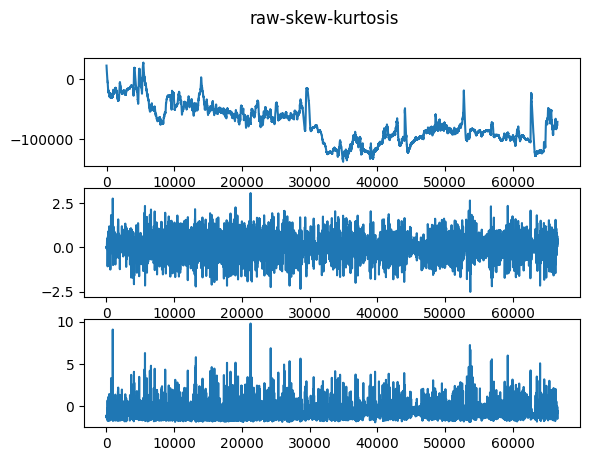

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.2633157954082082
ppg1 - kutosis 0.07600977268675901


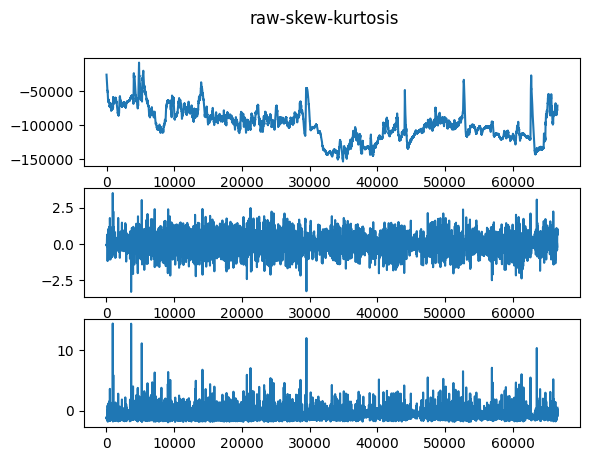

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.025903465096342657
ppg2 - kutosis 0.37023834857256555


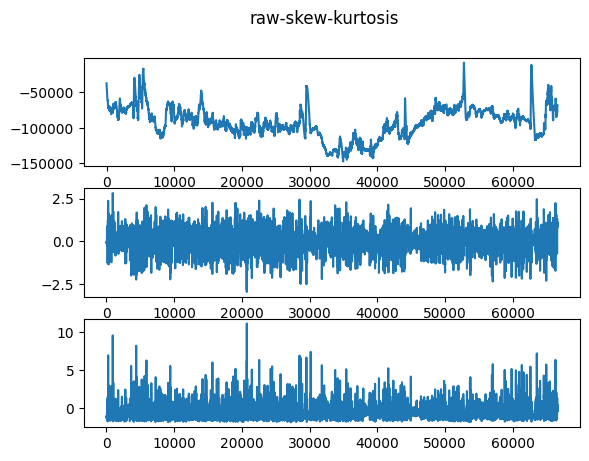

<Figure size 1200x800 with 0 Axes>

(M)006_20230507_110506_Verity.csv
인덱스 길이: 69891
ppg0 - skew 1.0730874216173278
ppg0 - kutosis 21.300788899522534


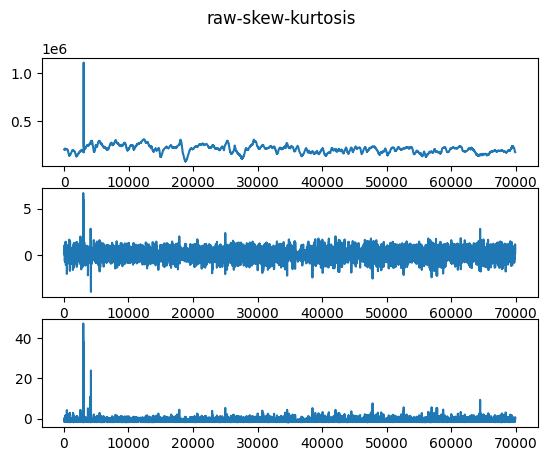

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.1181664972457563
ppg1 - kutosis 16.013341499442667


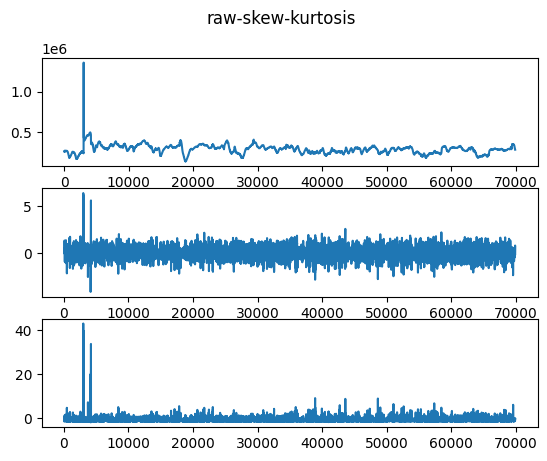

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 1.9343783715012197
ppg2 - kutosis 47.58682199700834


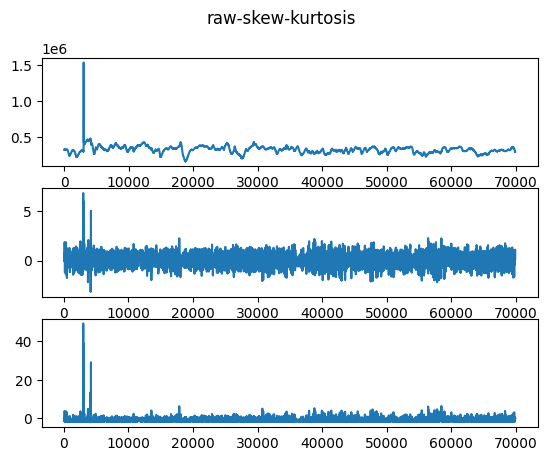

<Figure size 1200x800 with 0 Axes>

(M)007_20230507_110503_Verity.csv
인덱스 길이: 75553
ppg0 - skew -0.29497164265818293
ppg0 - kutosis 11.085720401085554


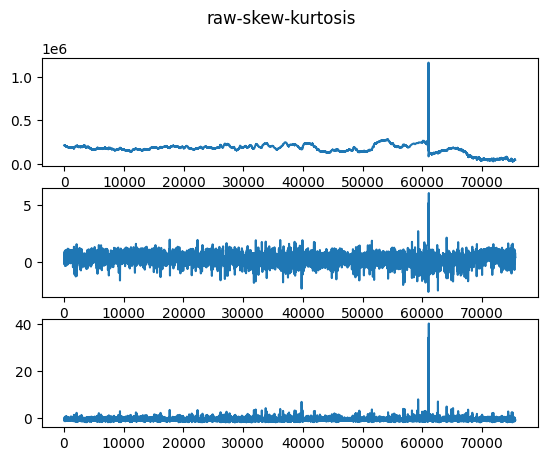

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.8464233561272901
ppg1 - kutosis 4.009972358408179


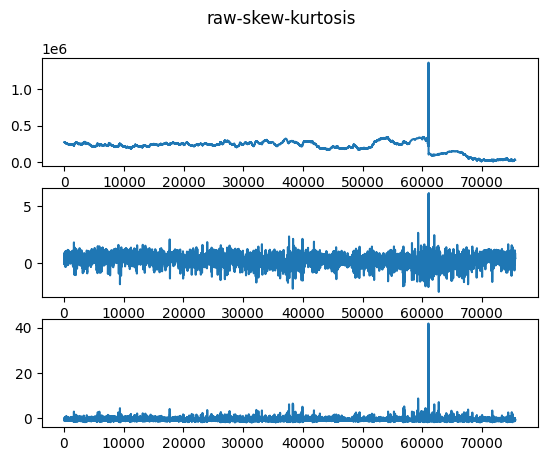

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -1.035742135896128
ppg2 - kutosis 2.602355436548815


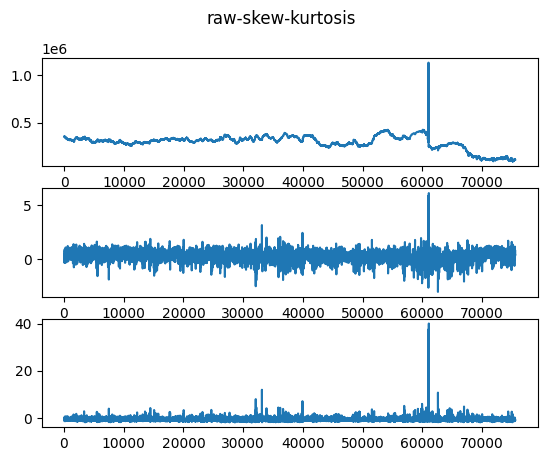

<Figure size 1200x800 with 0 Axes>

(M)008_20230507_113824_Verity.csv
인덱스 길이: 82108
ppg0 - skew 1.058229419513798
ppg0 - kutosis 5.2450789937503615


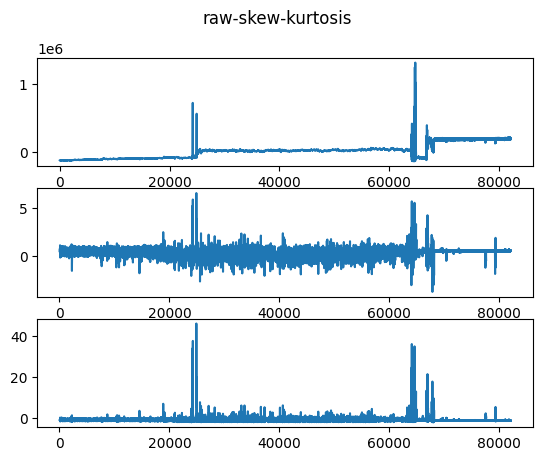

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 1.0480805018146653
ppg1 - kutosis 12.711969309704871


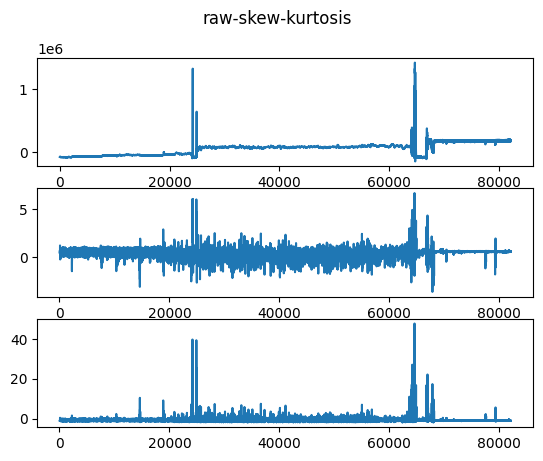

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 3.011683226656923
ppg2 - kutosis 31.73331224446516


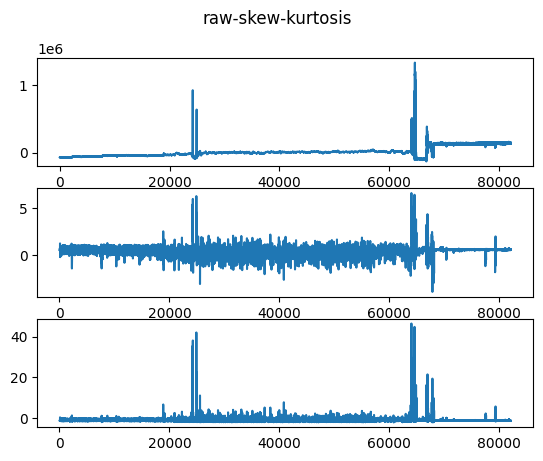

<Figure size 1200x800 with 0 Axes>

(M)009_20230507_095758_Verity.csv
인덱스 길이: 42341
ppg0 - skew 0.4745176493573941
ppg0 - kutosis 0.26184313215017907


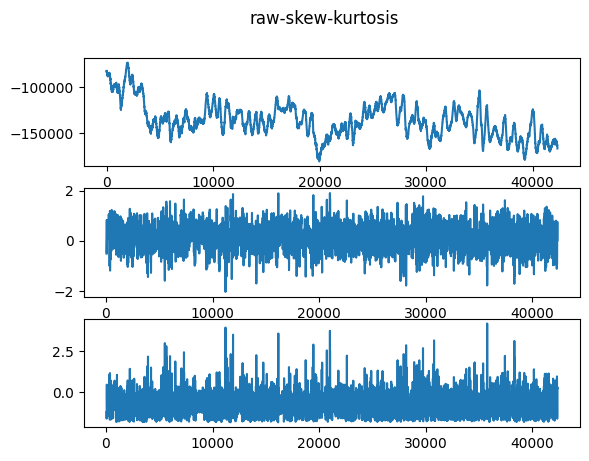

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.35120098098894603
ppg1 - kutosis -0.025770435904029387


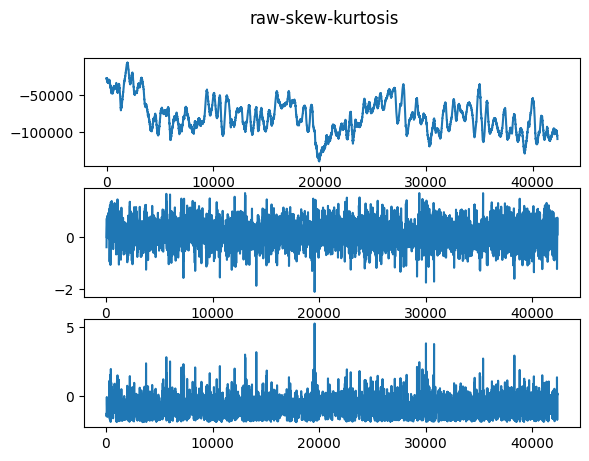

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.3671661569418869
ppg2 - kutosis 0.2706092339131705


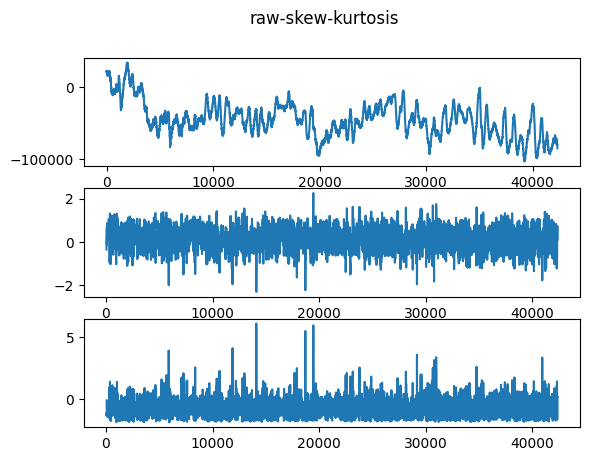

<Figure size 1200x800 with 0 Axes>

(M)010_20230507_103416_Verity.csv
인덱스 길이: 72645
ppg0 - skew 27.38541815090573
ppg0 - kutosis 1111.7343960058136


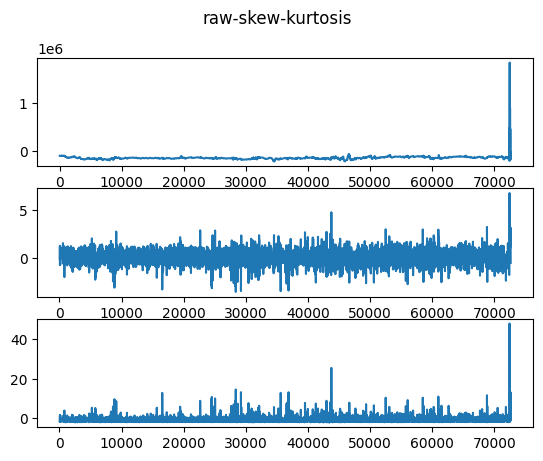

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 27.126644473868534
ppg1 - kutosis 1063.3613566931172


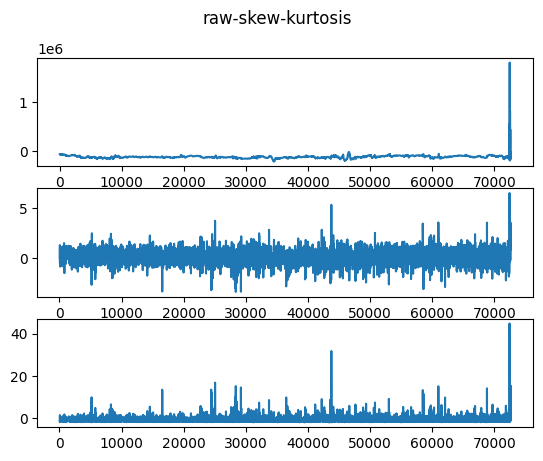

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 28.879545911314743
ppg2 - kutosis 1118.1718183878427


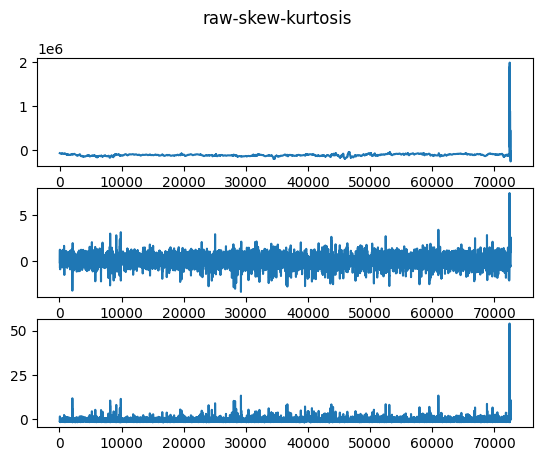

<Figure size 1200x800 with 0 Axes>

(M)011_20230507_120541_Verity.csv
인덱스 길이: 76110
ppg0 - skew 16.083254166313655
ppg0 - kutosis 603.8339419951387


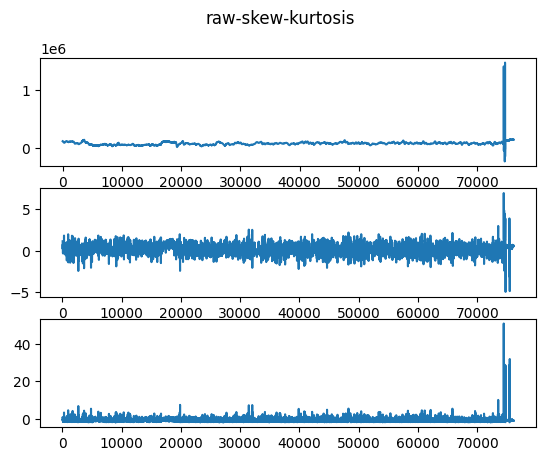

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 13.269639513907261
ppg1 - kutosis 468.19715256192416


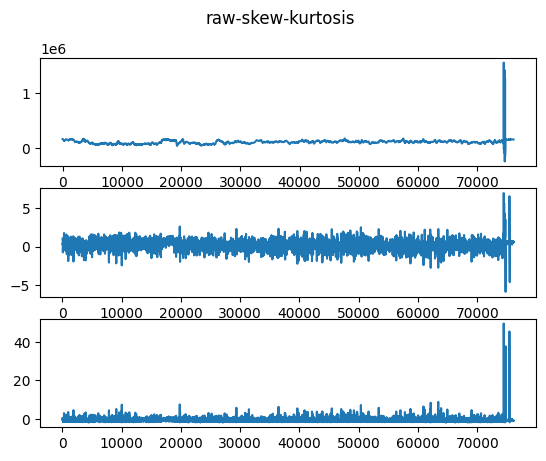

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 9.7770189691198
ppg2 - kutosis 329.6907687805357


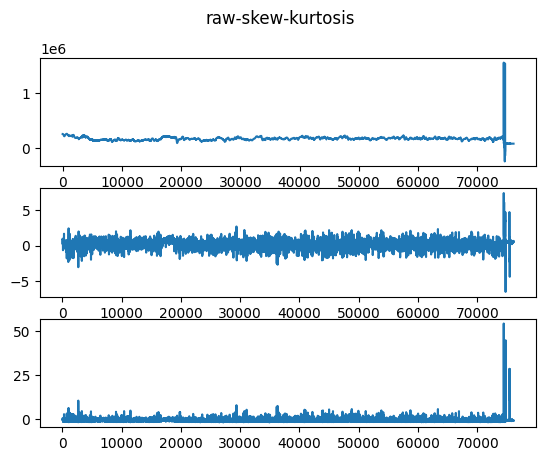

<Figure size 1200x800 with 0 Axes>

(M)012_20230507_093010_Verity.csv
인덱스 길이: 72631
ppg0 - skew 15.191397748708072
ppg0 - kutosis 326.2074688170751


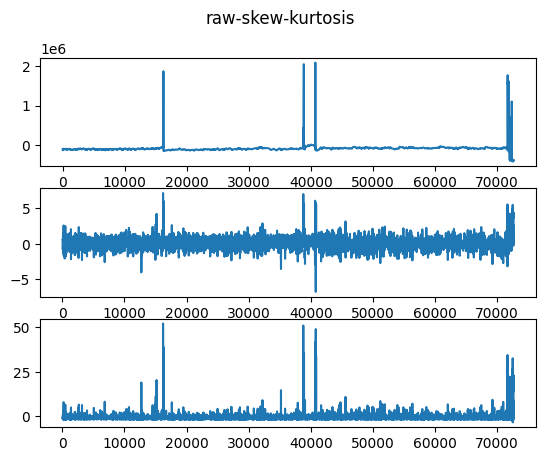

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 13.875068455471768
ppg1 - kutosis 329.1965154044363


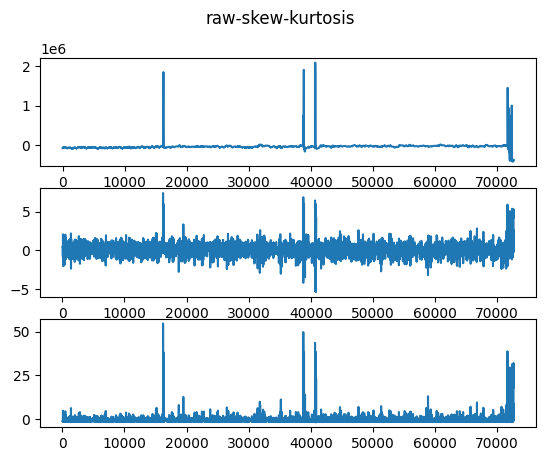

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 16.03064208956048
ppg2 - kutosis 381.9780173594368


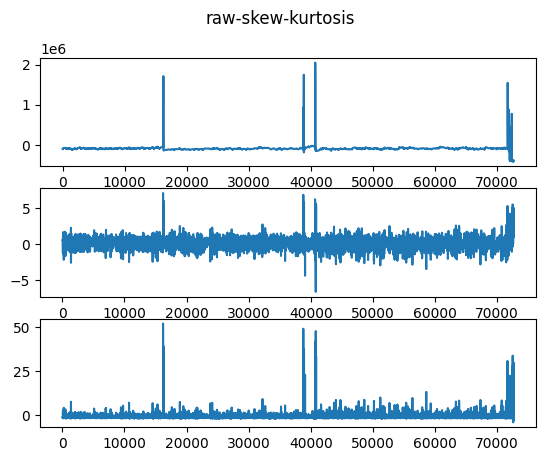

<Figure size 1200x800 with 0 Axes>

(M)013_20230507_113448_Verity.csv
인덱스 길이: 80733
ppg0 - skew 0.8012350532525844
ppg0 - kutosis 7.824298814486253


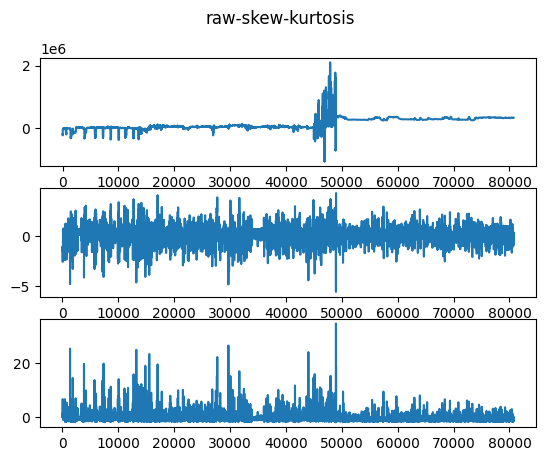

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.7240230982134914
ppg1 - kutosis 2.043691607442156


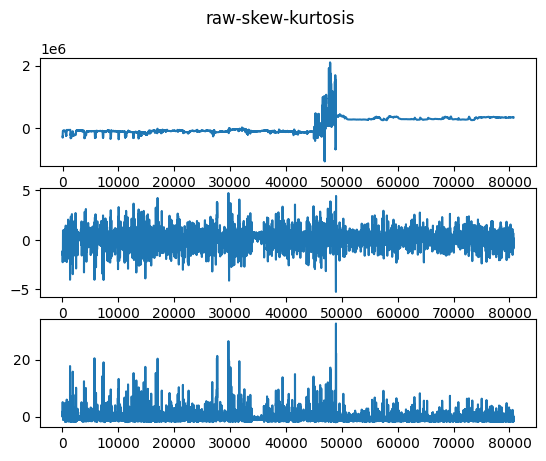

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.16889968407433686
ppg2 - kutosis 11.13977958156429


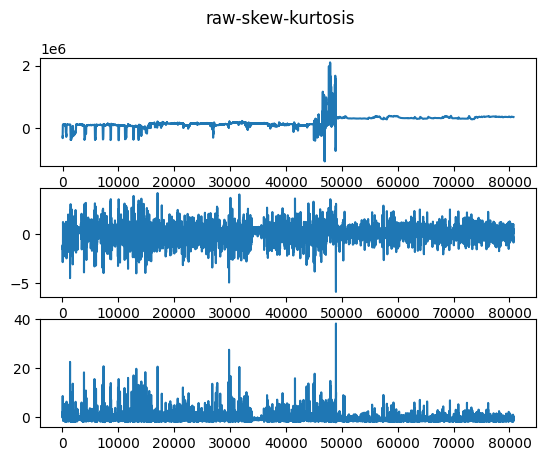

<Figure size 1200x800 with 0 Axes>

(M)014_20230507_095721_Verity.csv
인덱스 길이: 36101
ppg0 - skew 12.067552169619912
ppg0 - kutosis 366.5460965604907


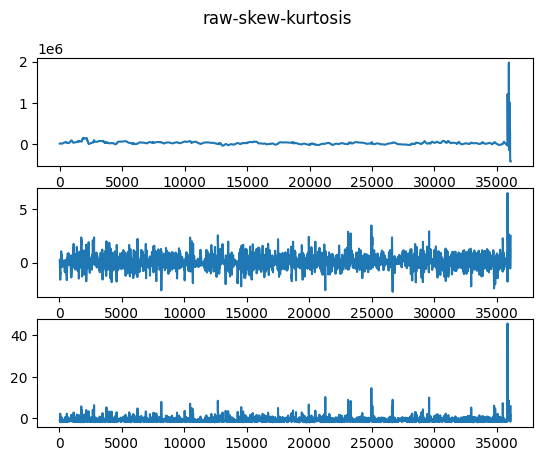

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 18.351141833362075
ppg1 - kutosis 617.468411469278


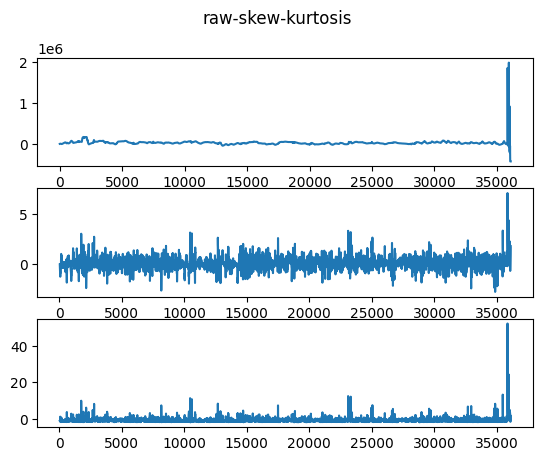

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 13.650019931656352
ppg2 - kutosis 394.3026450491646


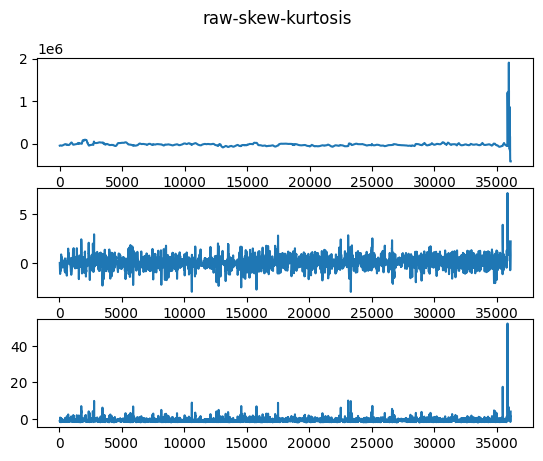

<Figure size 1200x800 with 0 Axes>

(M)016_20230507_085913_Verity.csv
인덱스 길이: 77433
ppg0 - skew -0.10370256994229848
ppg0 - kutosis 0.47540288492361427


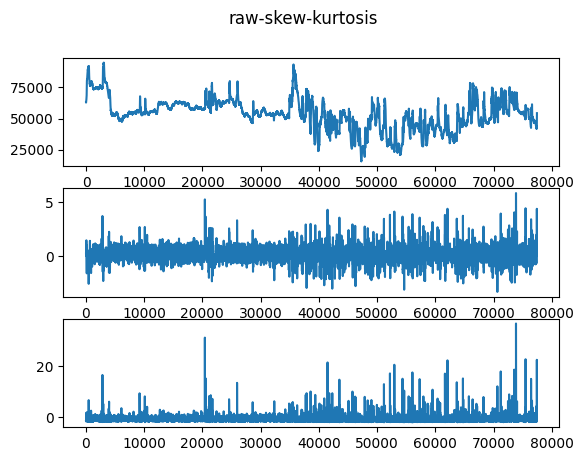

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -0.10020299831312322
ppg1 - kutosis -0.26234794558187646


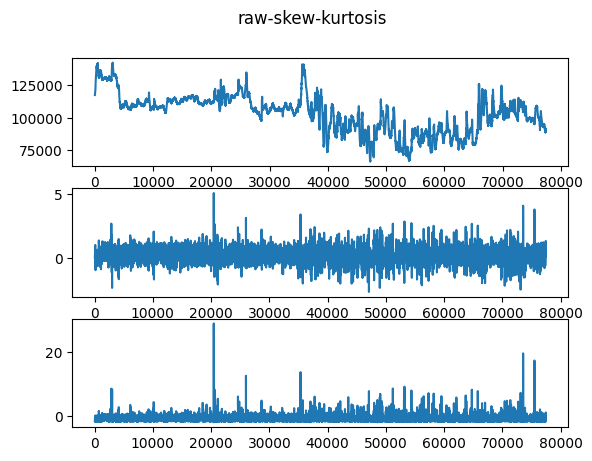

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.1138789656710846
ppg2 - kutosis -0.9722630739520839


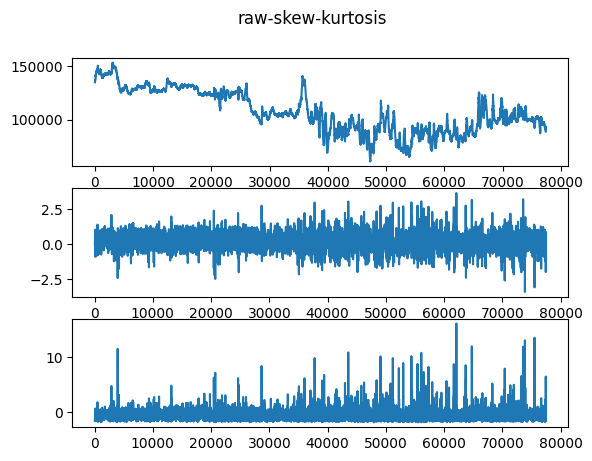

<Figure size 1200x800 with 0 Axes>

(M)017_20230507_110427_Verity.csv
인덱스 길이: 76497
ppg0 - skew 7.6258886506650825
ppg0 - kutosis 153.01649823777288


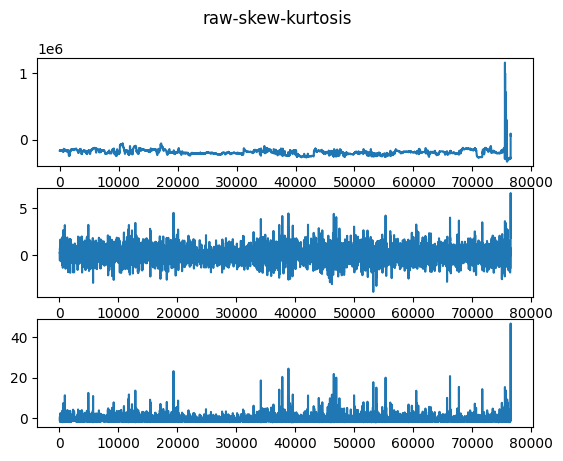

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 10.241689844975886
ppg1 - kutosis 266.50824795463706


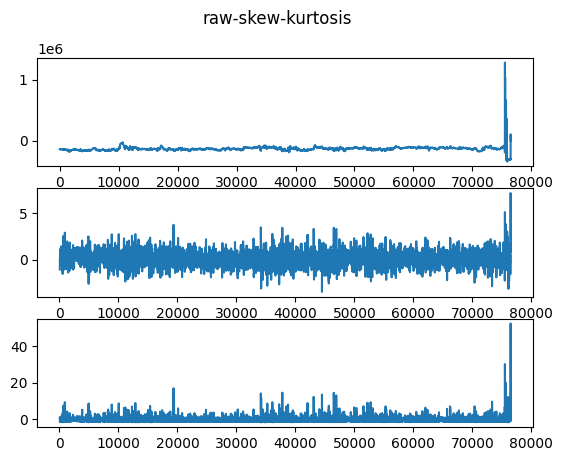

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 9.521182560552322
ppg2 - kutosis 264.71615438561787


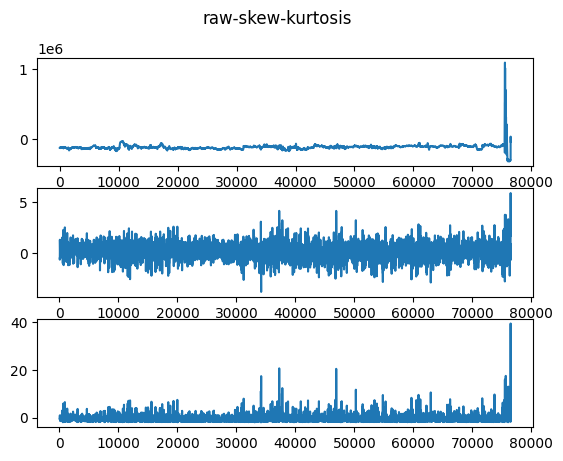

<Figure size 1200x800 with 0 Axes>

(M)018_20230507_100932_Verity.csv
인덱스 길이: 74282
ppg0 - skew 0.2989705446180452
ppg0 - kutosis -1.838409231344786


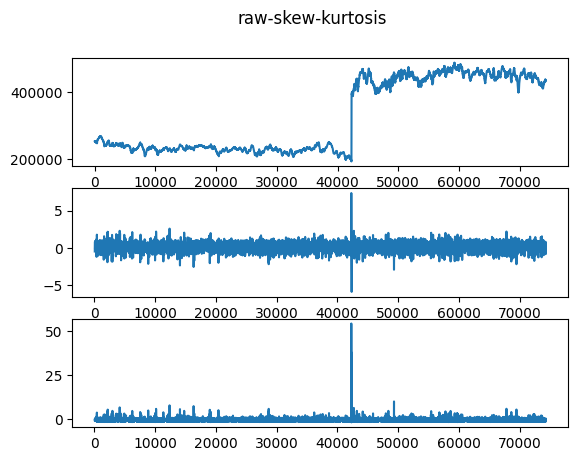

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 0.30217611835436076
ppg1 - kutosis -1.8289678175516


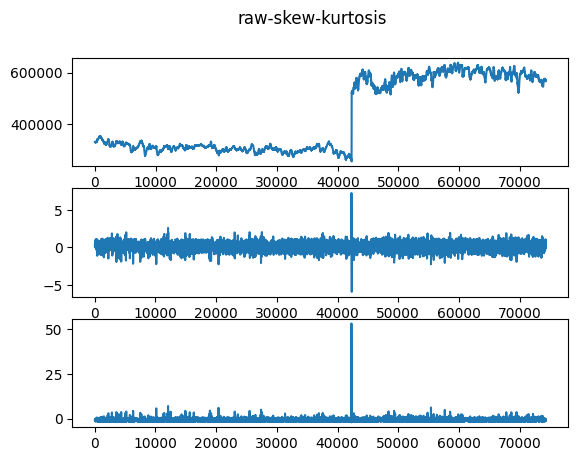

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 0.2874000246959049
ppg2 - kutosis -1.836605561010874


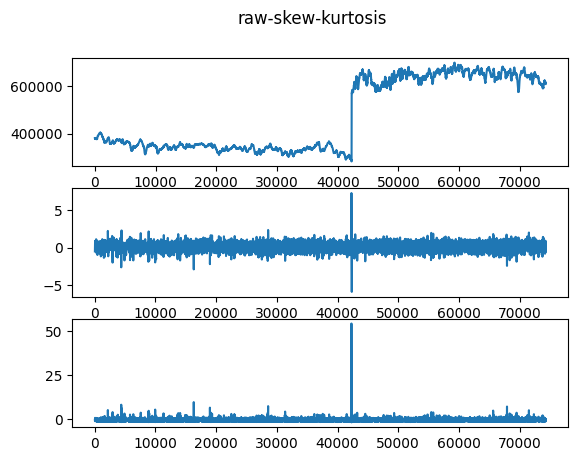

<Figure size 1200x800 with 0 Axes>

(M)019_20230507_101420_Verity.csv
인덱스 길이: 55428
ppg0 - skew 2.120827193639299
ppg0 - kutosis 8.157449336224394


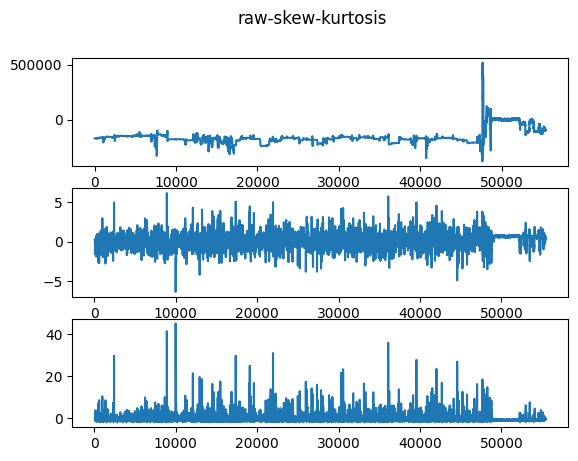

<Figure size 1200x800 with 0 Axes>

ppg1 - skew 2.383404346329084
ppg1 - kutosis 7.031895662826372


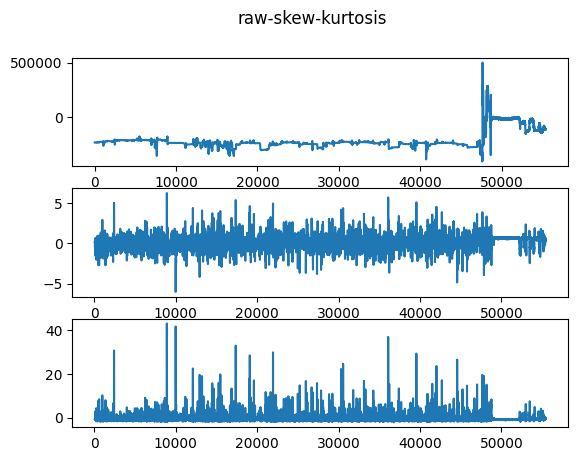

<Figure size 1200x800 with 0 Axes>

ppg2 - skew 1.0055520345808249
ppg2 - kutosis 2.306641336232266


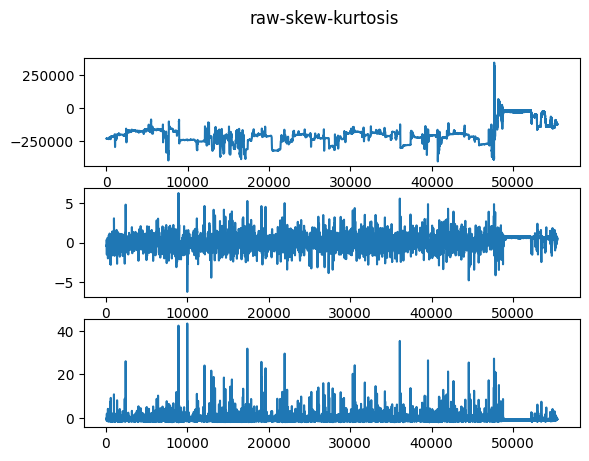

<Figure size 1200x800 with 0 Axes>

(M)020_20230507_122941_Verity.csv
인덱스 길이: 62943
ppg0 - skew -0.9063727931191926
ppg0 - kutosis 2.100282830998042


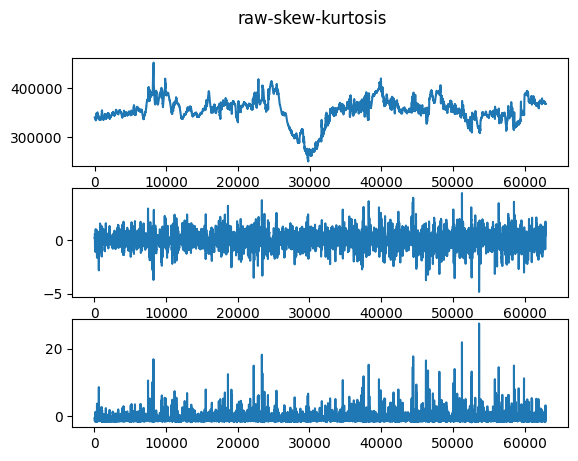

<Figure size 1200x800 with 0 Axes>

ppg1 - skew -1.3577075766936866
ppg1 - kutosis 2.586845394961287


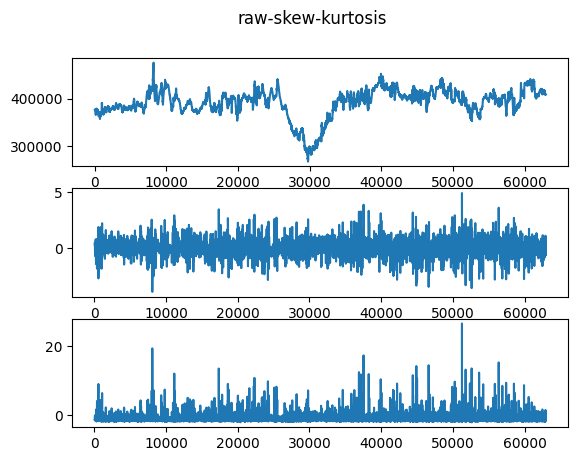

<Figure size 1200x800 with 0 Axes>

ppg2 - skew -1.104173483270422
ppg2 - kutosis 2.421984036372203


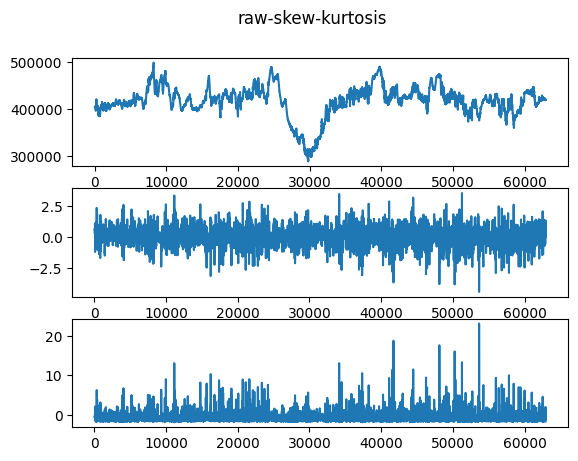

<Figure size 1200x800 with 0 Axes>

In [24]:
import padasip as pa
# https://matousc89.github.io/padasip/sources/filters/lms.html

for i in mast_verity_dict:
    print(i)
    print('인덱스 길이:',len(mast_verity_dict[i]))
    signals = mast_verity_dict[i][['ppg0', 'ppg1', 'ppg2']]
    ambient = mast_verity_dict[i]['ambient']

    for j in signals:
        print(j, '- skew', scipy.stats.skew(signals[j]))
        print(j, '- kutosis', scipy.stats.kurtosis(signals[j]))
        fig, axs = plt.subplots(3)
        fig.suptitle('raw-skew-kurtosis')
        plt.figure(figsize=(15, 10), dpi=80)

        axs[1].plot(pd.DataFrame(signals[j]).rolling(window = 55).skew())
        axs[2].plot(pd.DataFrame(signals[j]).rolling(window = 55).kurt())
        axs[0].plot(signals[j])
        plt.show()
        

피험자 수: 20 명
(M)001_20230507_093641_Verity.csv
인덱스 길이: 13854
안됨


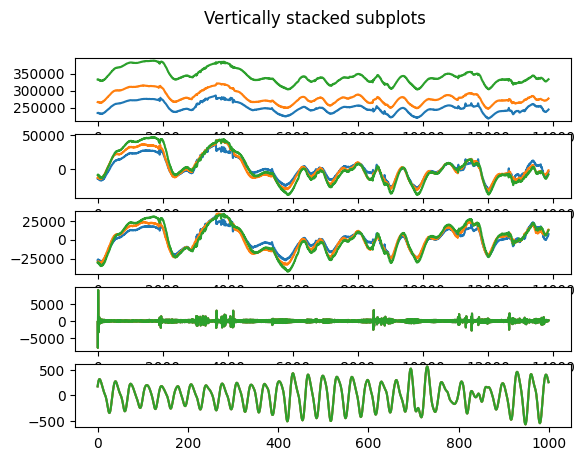

<Figure size 1200x800 with 0 Axes>

(M)001_20230507_094057_Verity.csv
인덱스 길이: 60755


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


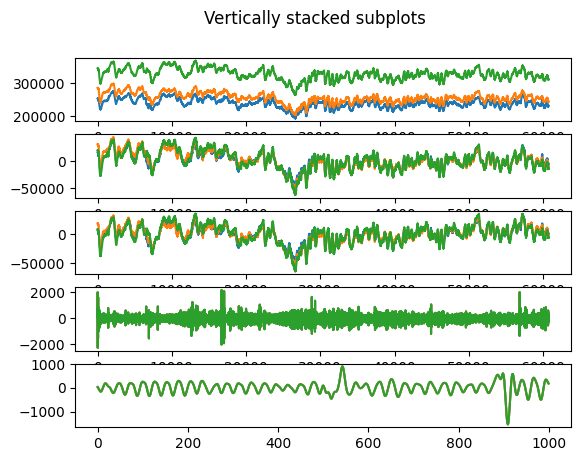

<Figure size 1200x800 with 0 Axes>

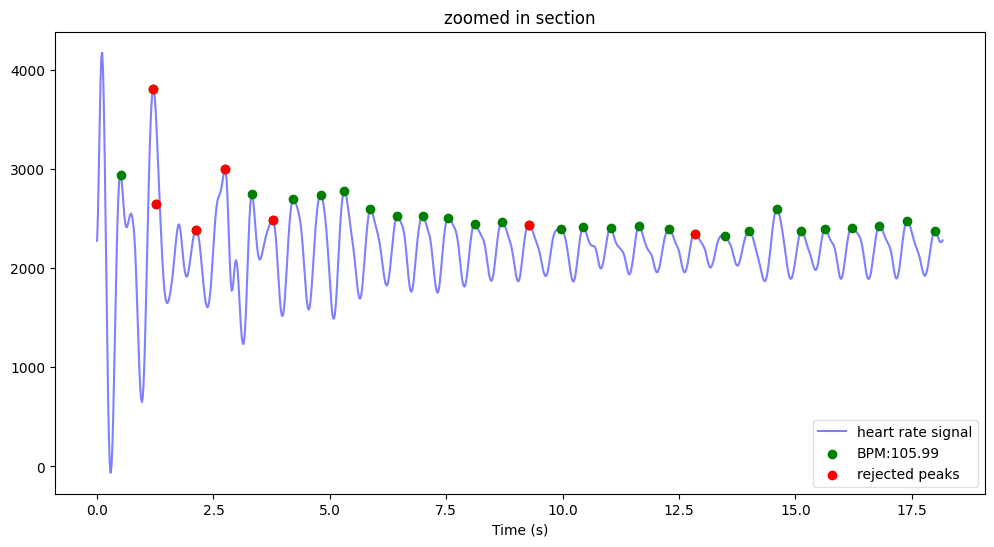

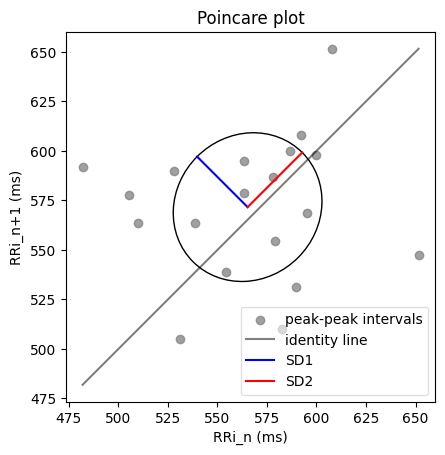

bpm: 105.985788
ibi: 566.113636
sdnn: 50.475850
sdsd: 30.761544
rmssd: 51.364153
pnn20: 0.684211
pnn50: 0.368421
hr_mad: 25.272727
sd1: 36.038003
sd2: 38.991076
s: 4414.441907
sd1/sd2: 0.924263
breathingrate: 0.221011


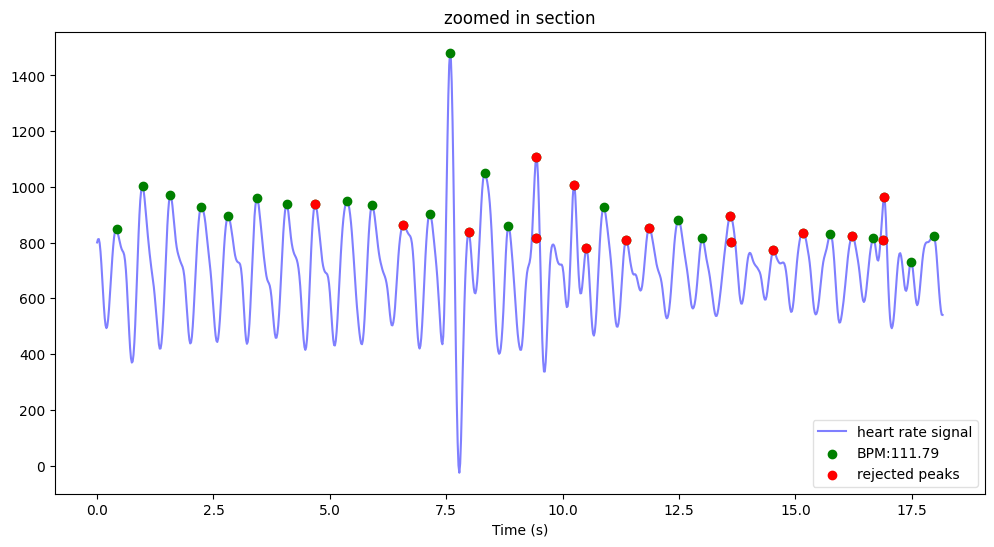

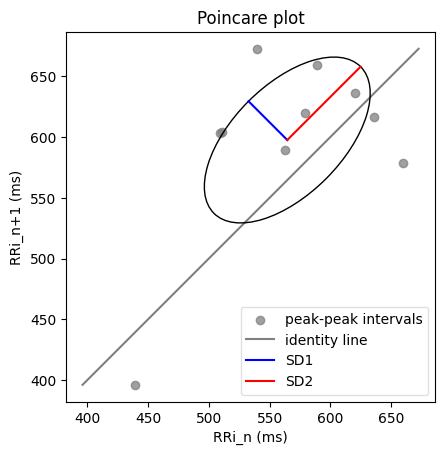

bpm: 111.793601
ibi: 536.703349
sdnn: 104.128145
sdsd: 36.540593
rmssd: 71.864973
pnn20: 0.900000
pnn50: 0.500000
hr_mad: 57.545455
sd1: 45.131883
sd2: 85.400125
s: 12108.541324
sd1/sd2: 0.528476
breathingrate: 0.196329


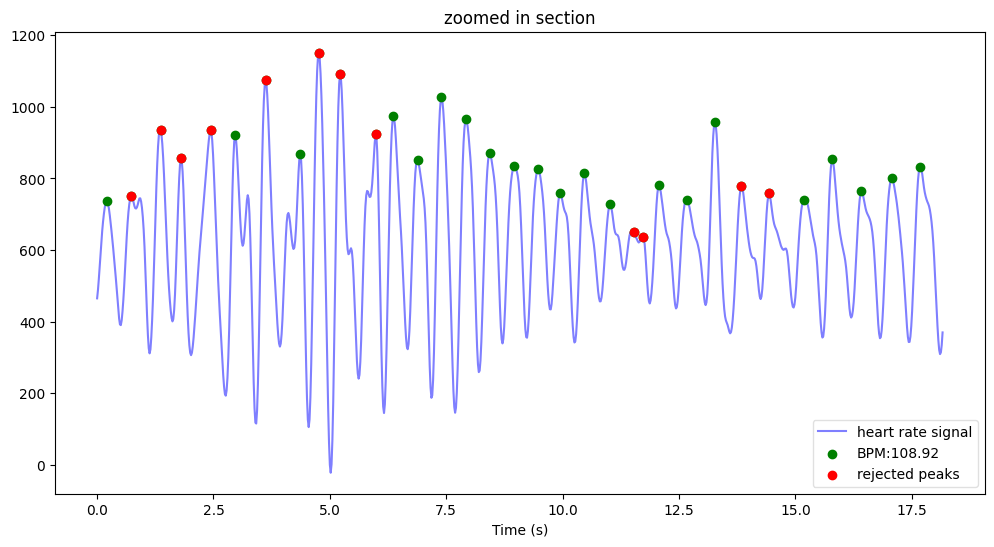

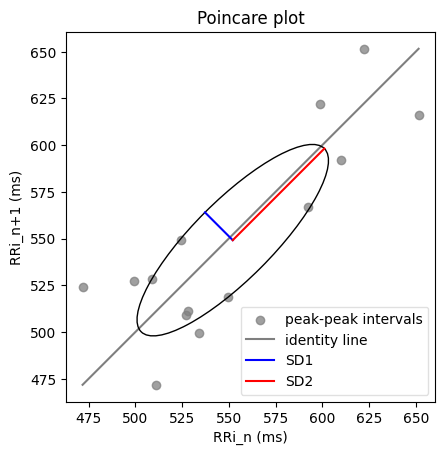

bpm: 108.916283
ibi: 550.881818
sdnn: 62.470159
sdsd: 9.550632
rmssd: 29.885348
pnn20: 0.714286
pnn50: 0.071429
hr_mad: 33.681818
sd1: 21.027693
sd2: 69.330742
s: 4580.019770
sd1/sd2: 0.303295
breathingrate: 0.272504


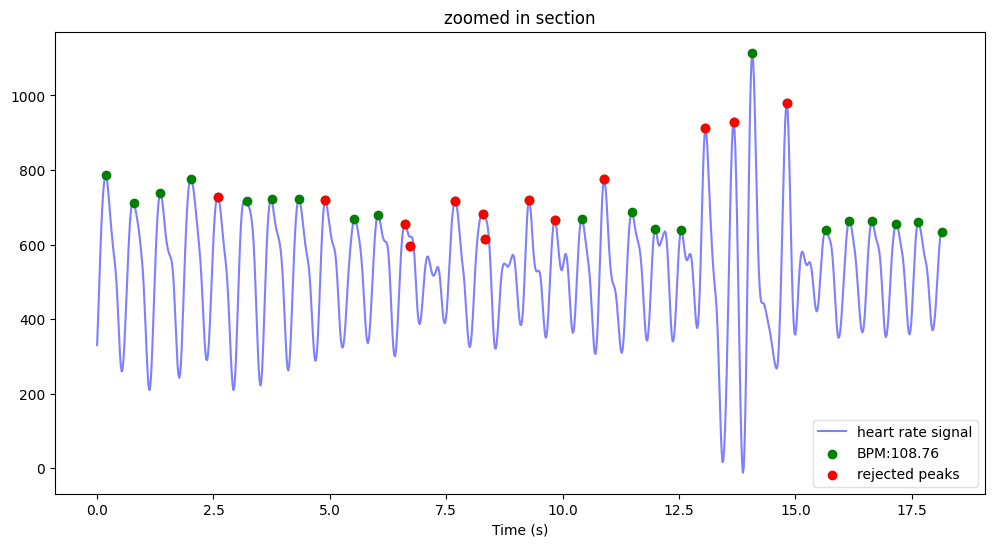

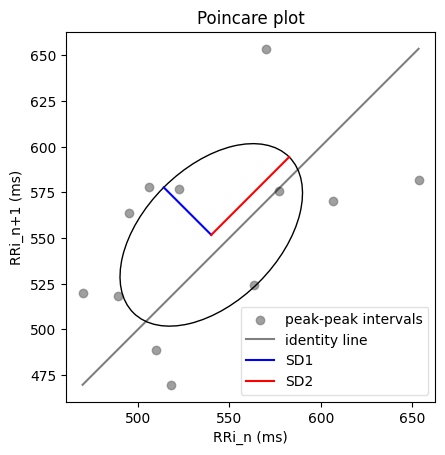

bpm: 108.763530
ibi: 551.655502
sdnn: 64.881567
sdsd: 22.967653
rmssd: 53.252970
pnn20: 0.916667
pnn50: 0.500000
hr_mad: 45.727273
sd1: 36.750362
sd2: 60.269787
s: 6958.428091
sd1/sd2: 0.609764
breathingrate: 0.191004


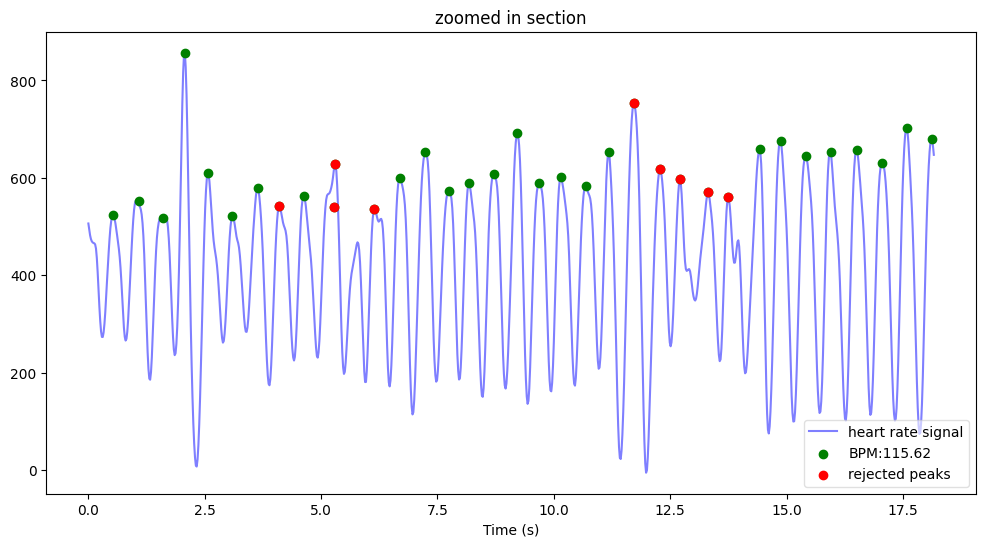

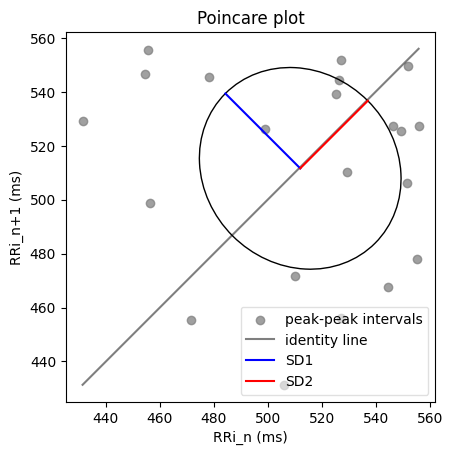

bpm: 115.617467
ibi: 518.952727
sdnn: 48.169351
sdsd: 30.243237
rmssd: 55.486174
pnn20: 0.714286
pnn50: 0.380952
hr_mad: 24.181818
sd1: 39.233407
sd2: 35.420417
s: 4365.757049
sd1/sd2: 1.107650
breathingrate: 0.231428
(M)002_20230507_103326_Verity.csv
인덱스 길이: 77236


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


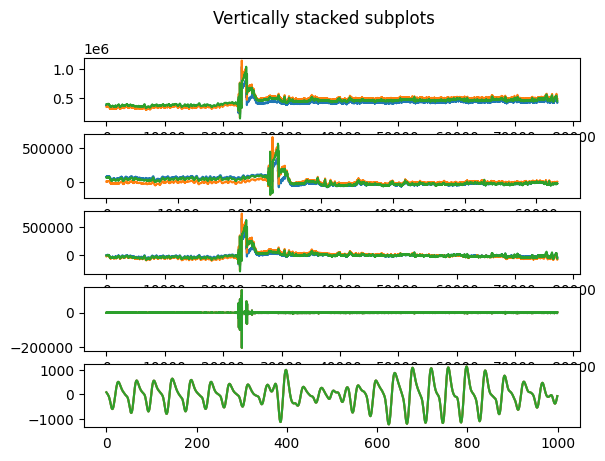

<Figure size 1200x800 with 0 Axes>

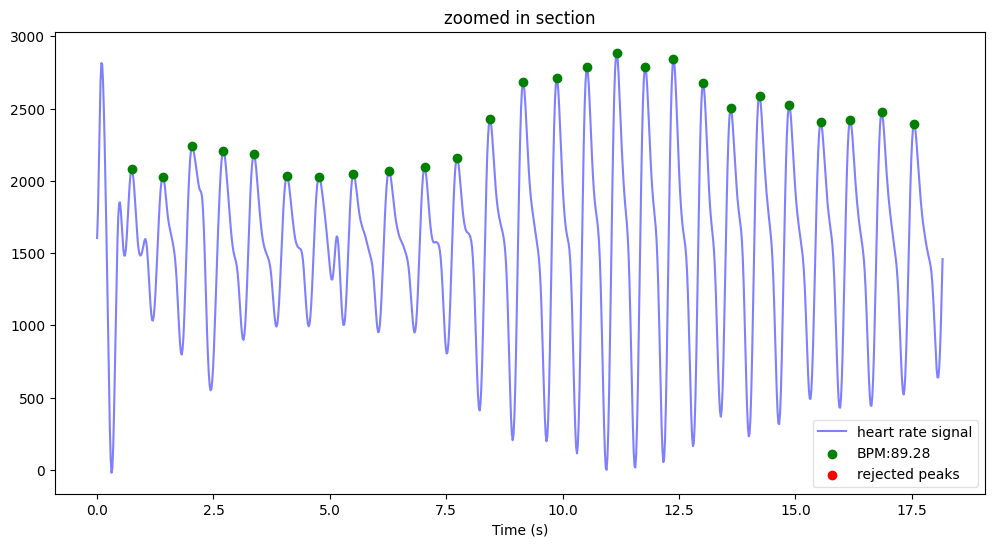

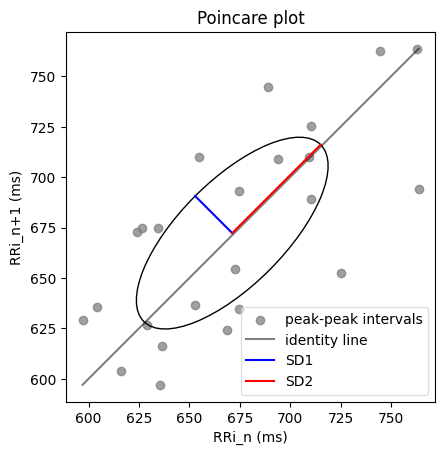

bpm: 89.275086
ibi: 672.080000
sdnn: 46.683887
sdsd: 20.264980
rmssd: 36.770143
pnn20: 0.583333
pnn50: 0.166667
hr_mad: 37.363636
sd1: 25.990654
sd2: 62.012529
s: 5063.449987
sd1/sd2: 0.419119
breathingrate: 0.297779


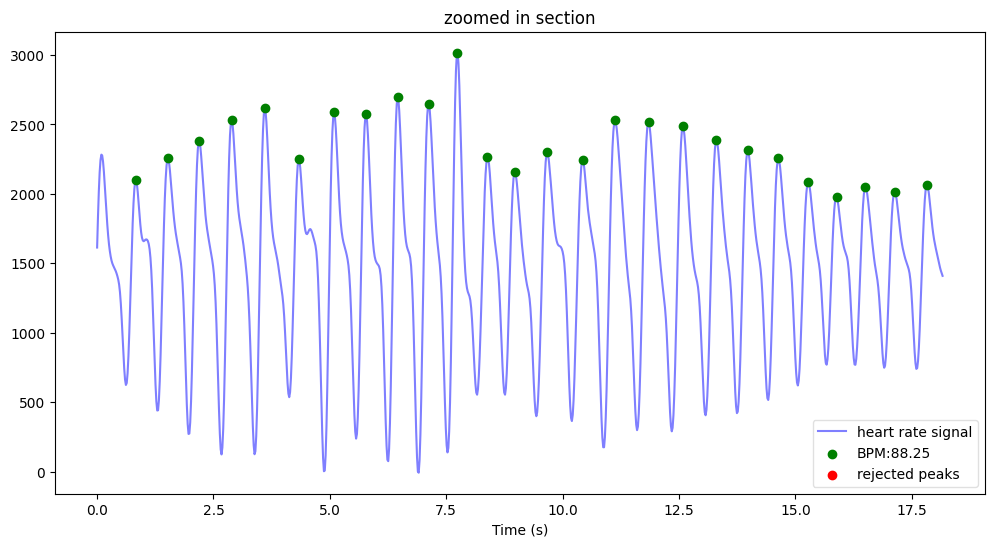

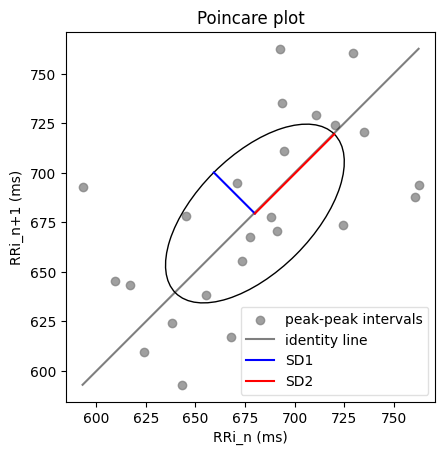

bpm: 88.245676
ibi: 679.920000
sdnn: 44.241339
sdsd: 24.016258
rmssd: 41.481397
pnn20: 0.583333
pnn50: 0.291667
hr_mad: 33.000000
sd1: 29.329345
sd2: 56.675419
s: 5222.121646
sd1/sd2: 0.517497
breathingrate: 0.117744


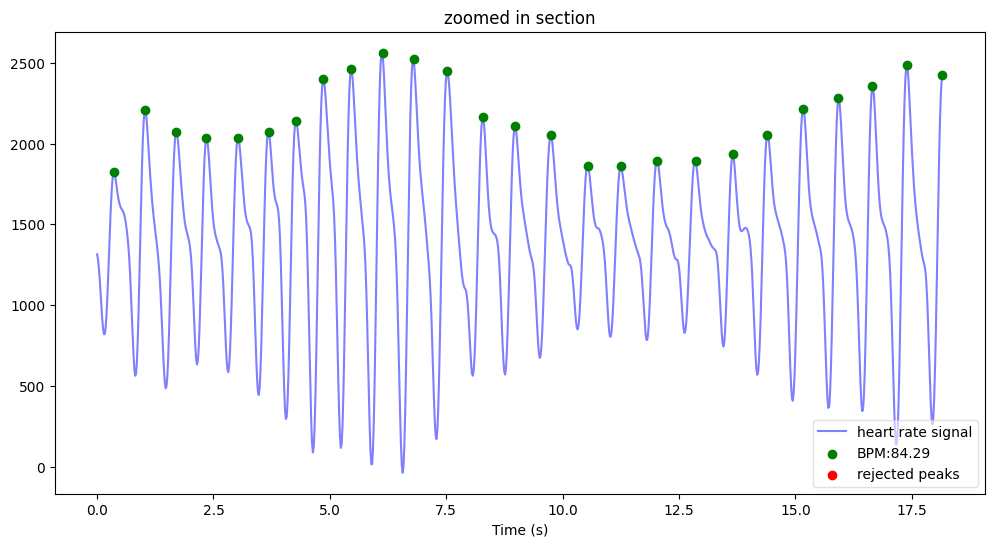

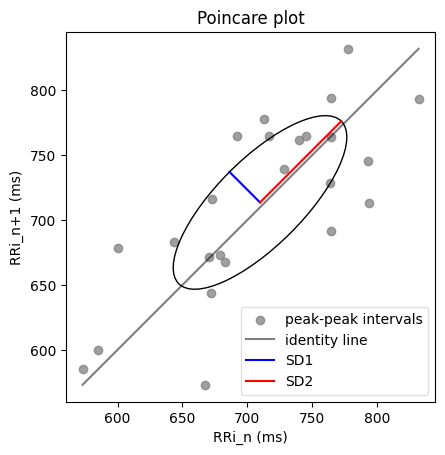

bpm: 84.288604
ibi: 711.840000
sdnn: 66.219906
sdsd: 26.808977
rmssd: 47.194676
pnn20: 0.666667
pnn50: 0.291667
hr_mad: 47.181818
sd1: 33.264015
sd2: 88.589465
s: 9257.775071
sd1/sd2: 0.375485
breathingrate: 0.168700


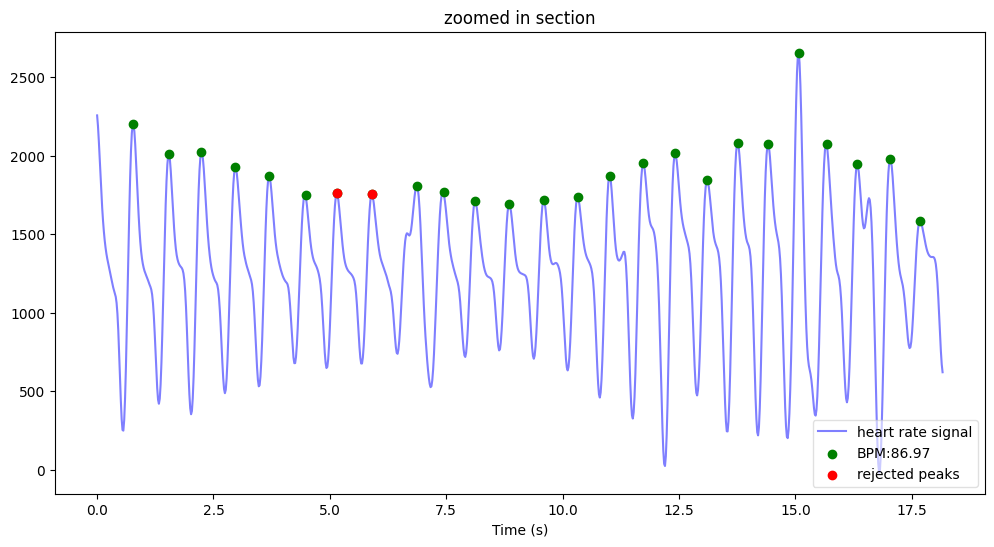

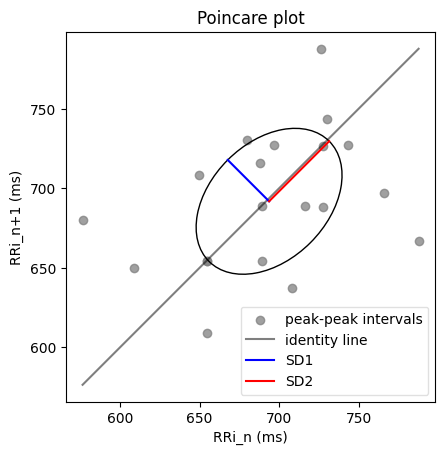

bpm: 86.970064
ibi: 689.892562
sdnn: 49.159973
sdsd: 32.632937
rmssd: 52.018218
pnn20: 0.700000
pnn50: 0.350000
hr_mad: 35.863636
sd1: 36.758125
sd2: 53.414769
s: 6168.287084
sd1/sd2: 0.688164
breathingrate: 0.263748


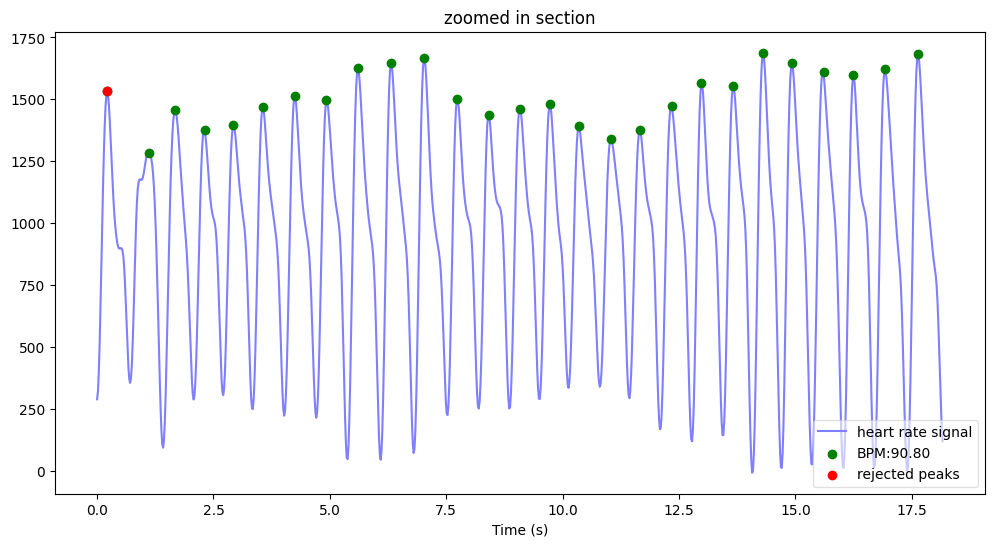

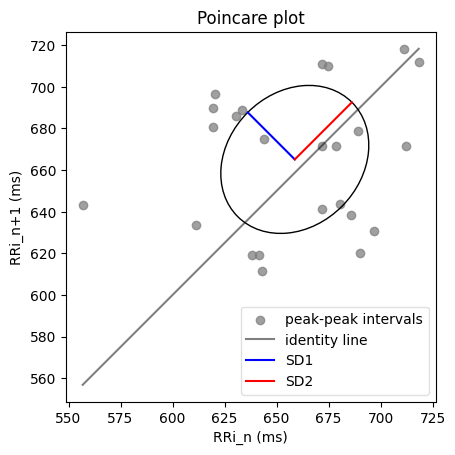

bpm: 90.802030
ibi: 660.778182
sdnn: 38.593299
sdsd: 24.233696
rmssd: 45.645976
pnn20: 0.750000
pnn50: 0.333333
hr_mad: 30.363636
sd1: 31.959110
sd2: 38.820008
s: 3897.626056
sd1/sd2: 0.823264
breathingrate: 0.181741
(M)003_20230507_090129_Verity.csv
인덱스 길이: 77088
안됨


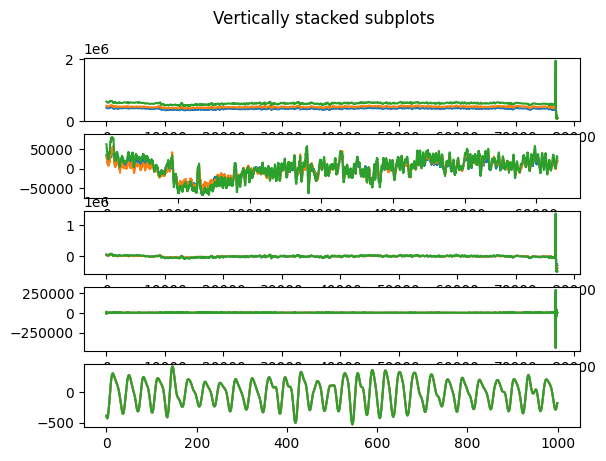

<Figure size 1200x800 with 0 Axes>

(M)004_20230507_093440_Verity.csv
인덱스 길이: 65531
안됨


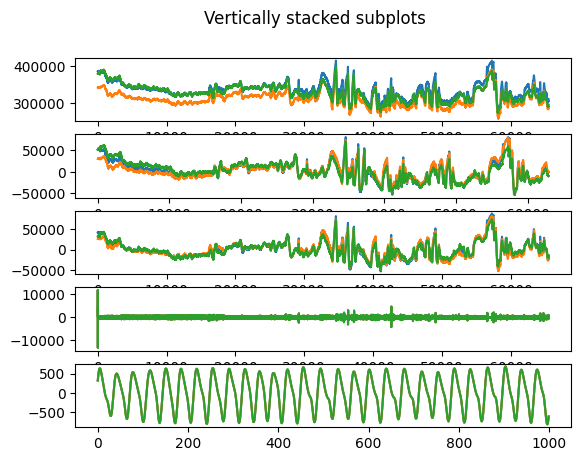

<Figure size 1200x800 with 0 Axes>

(M)005_20230507_113956_Verity.csv
인덱스 길이: 66573
안됨


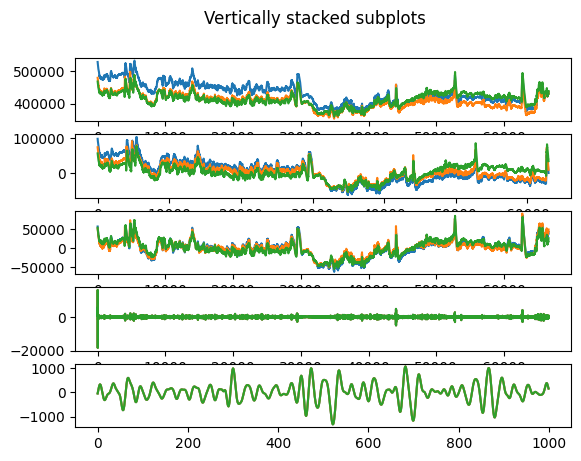

<Figure size 1200x800 with 0 Axes>

(M)006_20230507_110506_Verity.csv
인덱스 길이: 69891


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


안됨


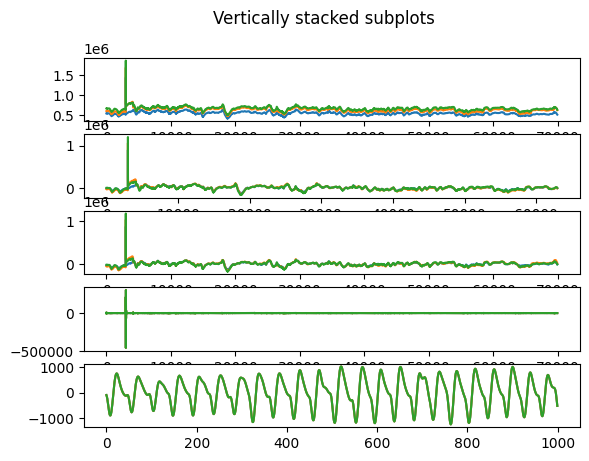

<Figure size 1200x800 with 0 Axes>

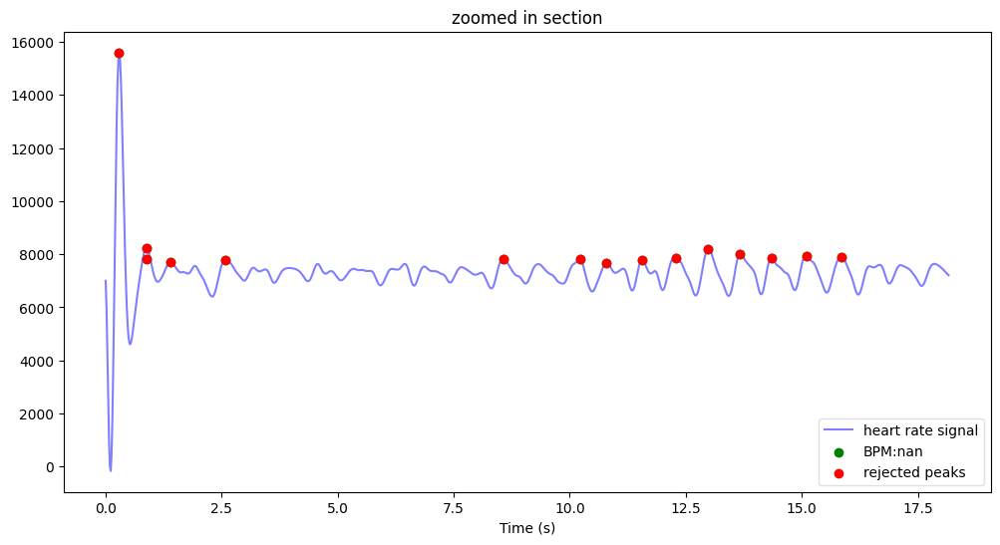

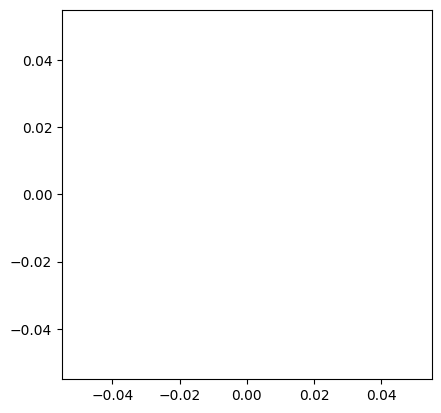

(M)007_20230507_110503_Verity.csv
인덱스 길이: 75553


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


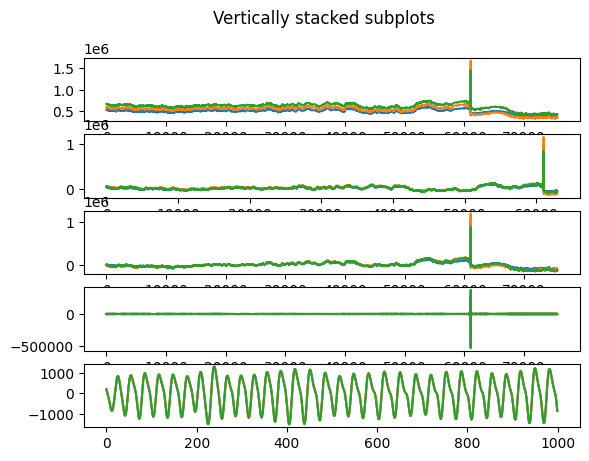

<Figure size 1200x800 with 0 Axes>

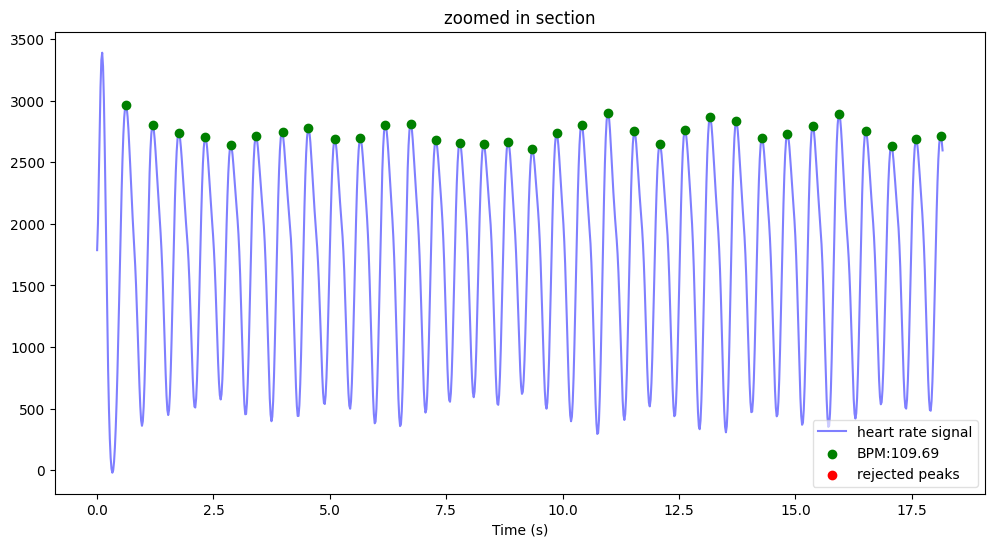

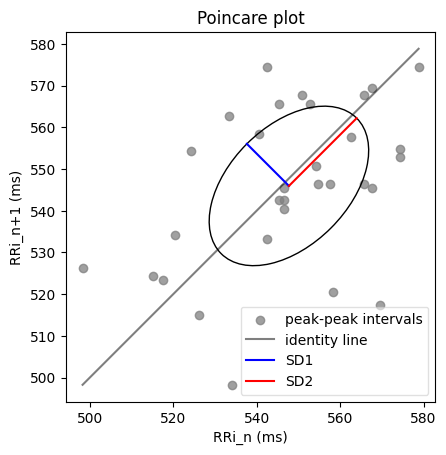

bpm: 109.694911
ibi: 546.971591
sdnn: 19.478962
sdsd: 12.469463
rmssd: 20.245856
pnn20: 0.322581
pnn50: 0.032258
hr_mad: 14.681818
sd1: 14.259807
sd2: 22.967887
s: 1028.926986
sd1/sd2: 0.620858
breathingrate: 0.171546


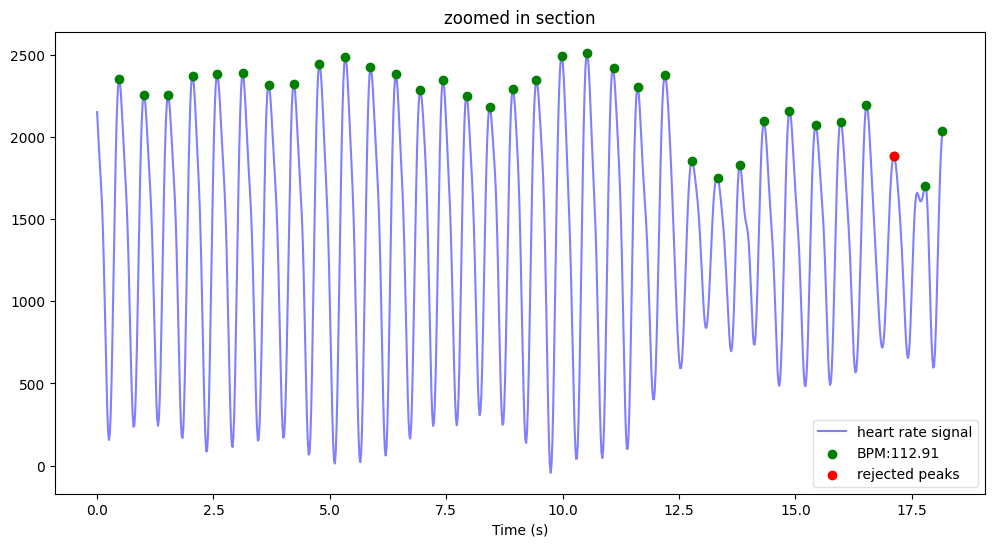

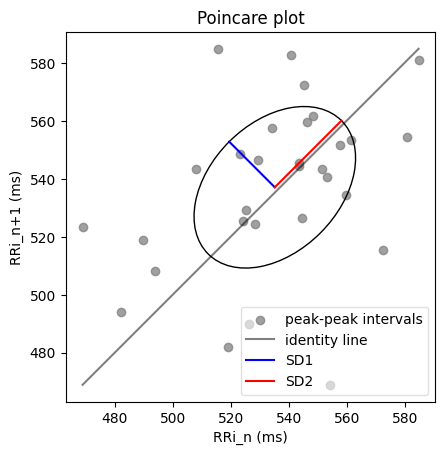

bpm: 112.913401
ibi: 531.380682
sdnn: 40.720033
sdsd: 20.737726
rmssd: 31.521614
pnn20: 0.466667
pnn50: 0.133333
hr_mad: 17.181818
sd1: 22.252037
sd2: 32.517765
s: 2273.214134
sd1/sd2: 0.684304
breathingrate: 0.176595


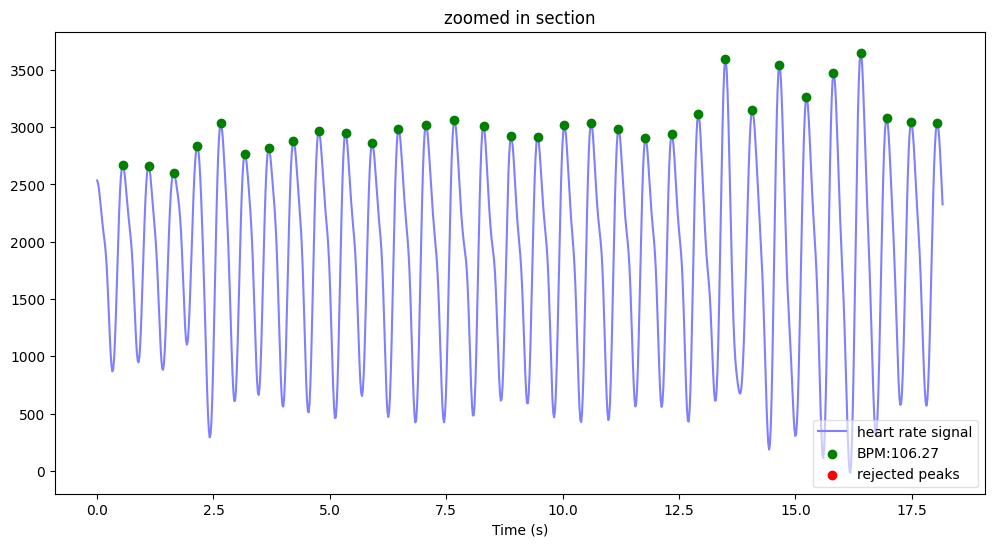

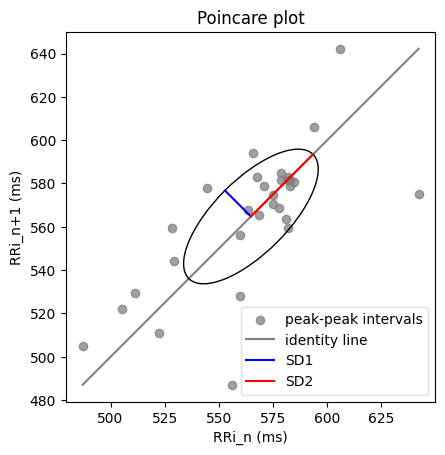

bpm: 106.266945
ibi: 564.615836
sdnn: 30.584842
sdsd: 17.414790
rmssd: 23.975516
pnn20: 0.266667
pnn50: 0.066667
hr_mad: 11.181818
sd1: 16.953250
sd2: 40.547582
s: 2159.572532
sd1/sd2: 0.418108
breathingrate: 0.114377


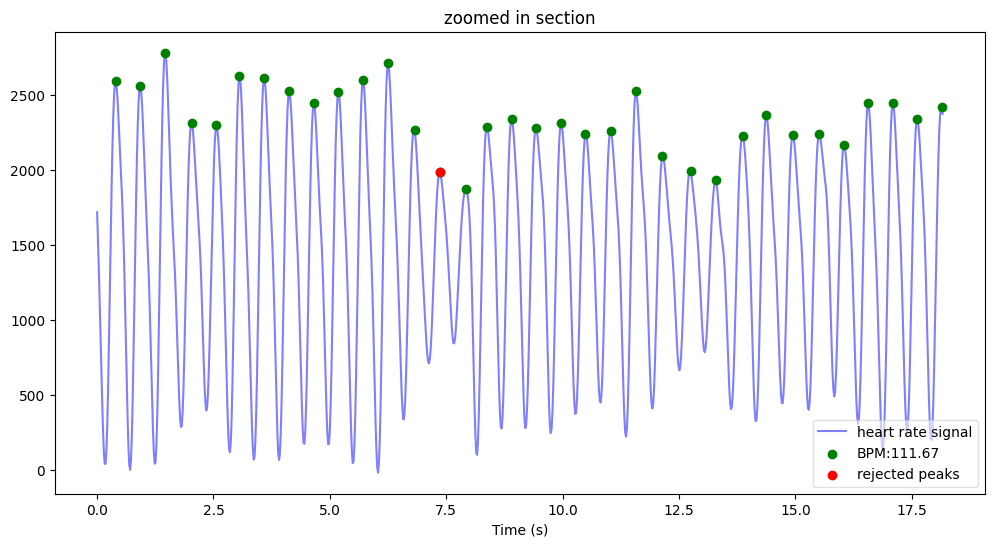

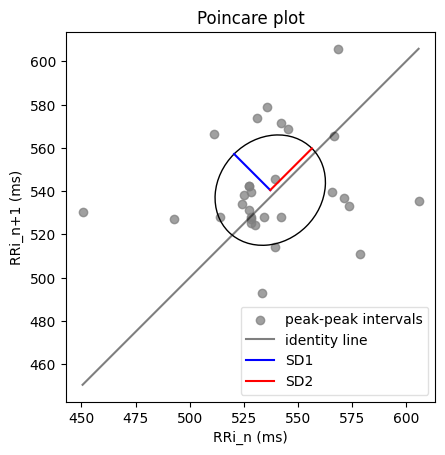

bpm: 111.674536
ibi: 537.275568
sdnn: 27.083639
sdsd: 21.620403
rmssd: 33.554561
pnn20: 0.500000
pnn50: 0.133333
hr_mad: 7.500000
sd1: 23.616038
sd2: 27.250994
s: 2021.804987
sd1/sd2: 0.866612
breathingrate: 0.174632


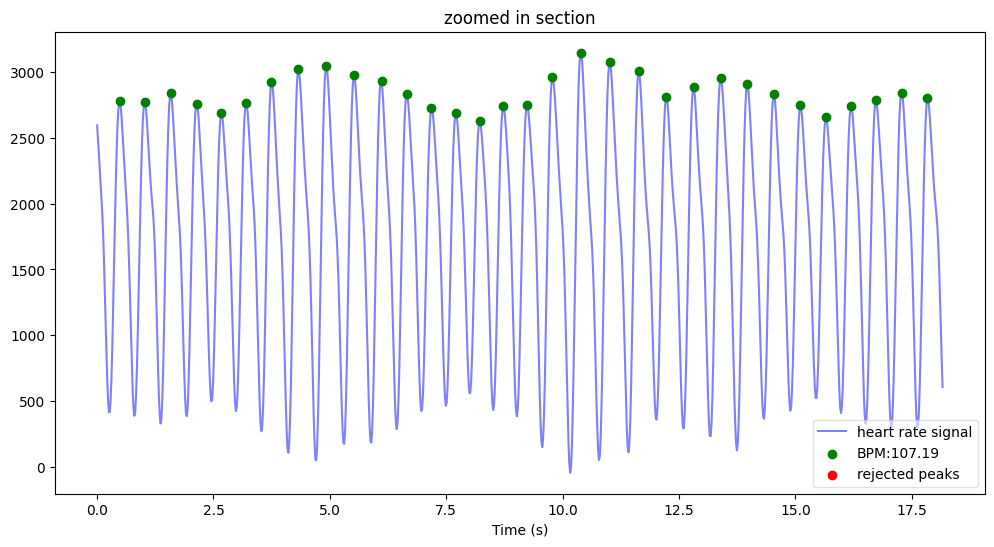

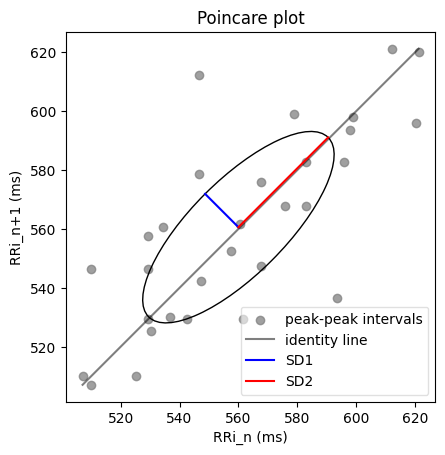

bpm: 107.189447
ibi: 559.756598
sdnn: 32.153776
sdsd: 16.091525
rmssd: 22.628221
pnn20: 0.333333
pnn50: 0.066667
hr_mad: 25.181818
sd1: 15.994828
sd2: 43.088452
s: 2165.161730
sd1/sd2: 0.371209
breathingrate: 0.173030
(M)008_20230507_113824_Verity.csv
인덱스 길이: 82108


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


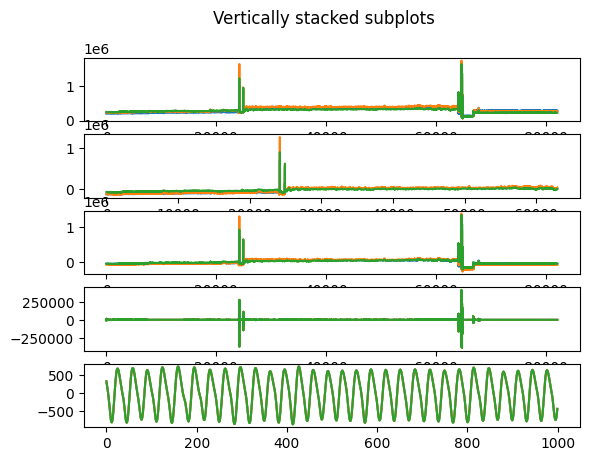

<Figure size 1200x800 with 0 Axes>

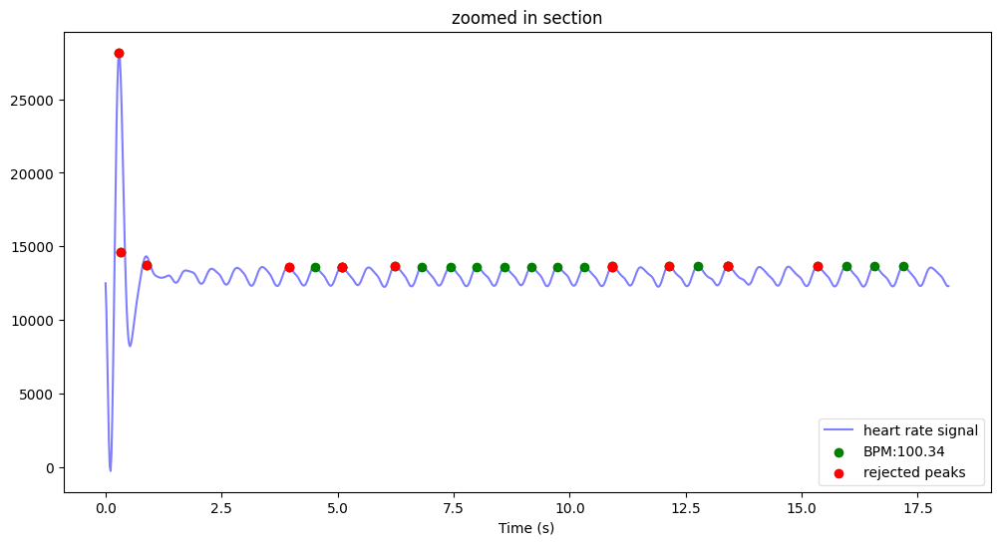

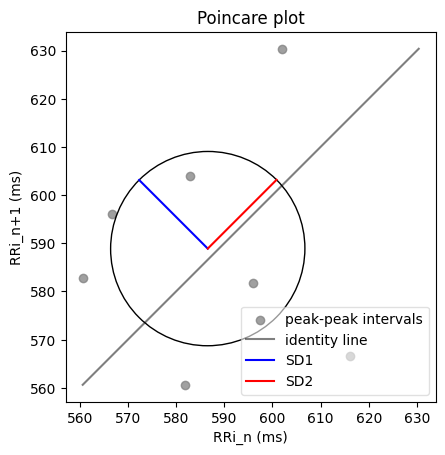

bpm: 100.337222
ibi: 597.983471
sdnn: 26.763899
sdsd: 10.485917
rmssd: 28.565631
pnn20: 0.857143
pnn50: 0.000000
hr_mad: 14.181818
sd1: 20.132702
sd2: 20.186431
s: 1276.766485
sd1/sd2: 0.997338
breathingrate: 0.152161


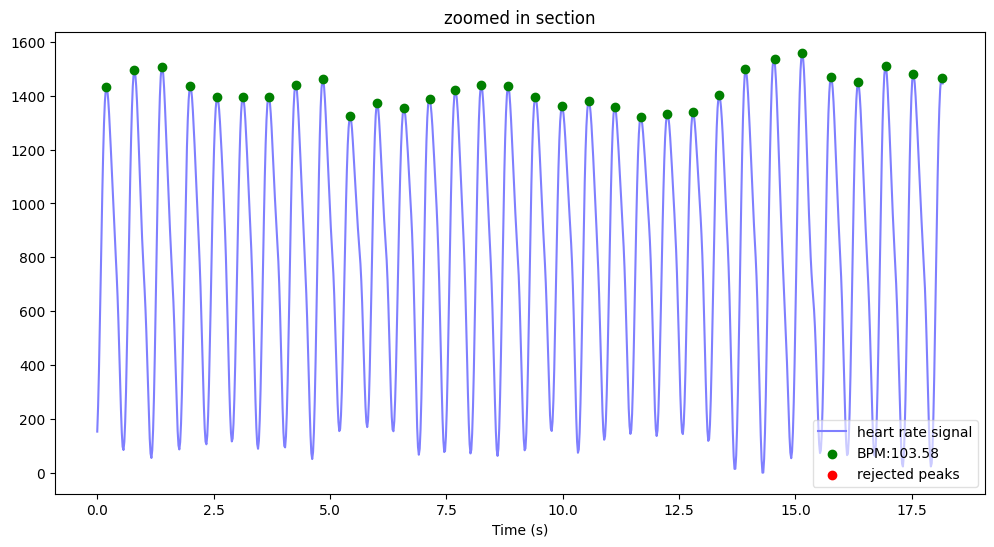

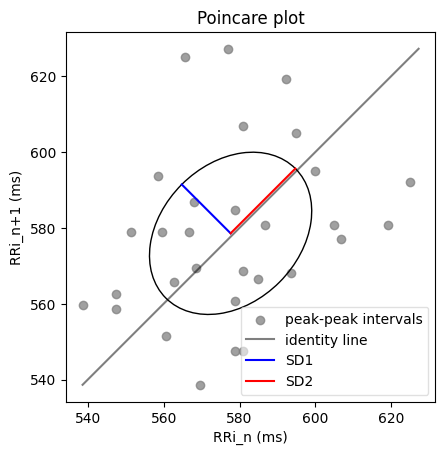

bpm: 103.583923
ibi: 579.240469
sdnn: 22.083342
sdsd: 13.553333
rmssd: 25.764974
pnn20: 0.500000
pnn50: 0.066667
hr_mad: 14.818182
sd1: 18.207319
sd2: 24.131780
s: 1380.337321
sd1/sd2: 0.754495
breathingrate: 0.167224


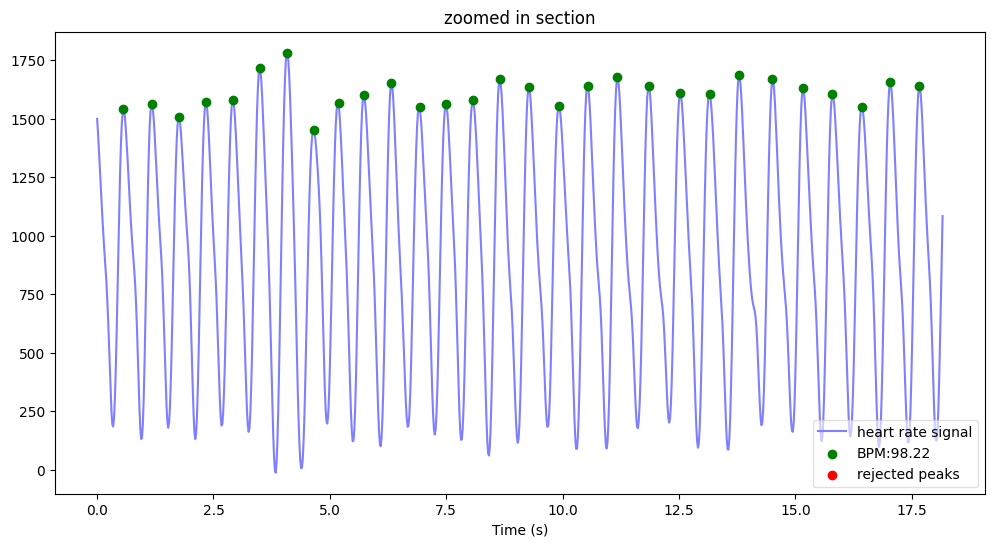

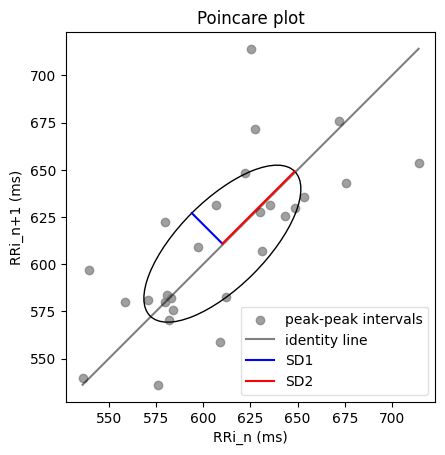

bpm: 98.216374
ibi: 610.896104
sdnn: 40.929827
sdsd: 21.508156
rmssd: 32.400714
pnn20: 0.481481
pnn50: 0.111111
hr_mad: 29.181818
sd1: 22.905256
sd2: 54.164468
s: 3897.620138
sd1/sd2: 0.422883
breathingrate: 0.351083


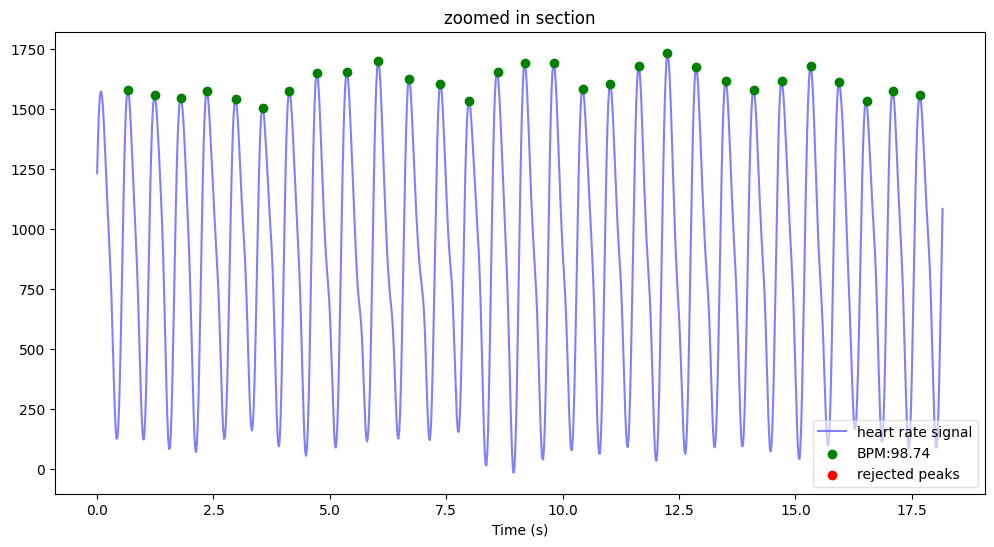

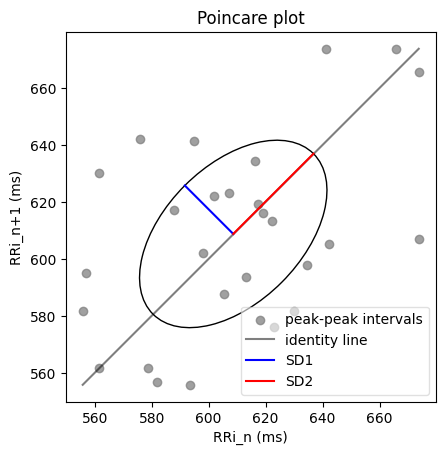

bpm: 98.735354
ibi: 607.685065
sdnn: 32.718744
sdsd: 19.713363
rmssd: 33.982445
pnn20: 0.555556
pnn50: 0.111111
hr_mad: 24.090909
sd1: 24.029089
sd2: 39.814919
s: 3005.612647
sd1/sd2: 0.603520
breathingrate: 0.176471


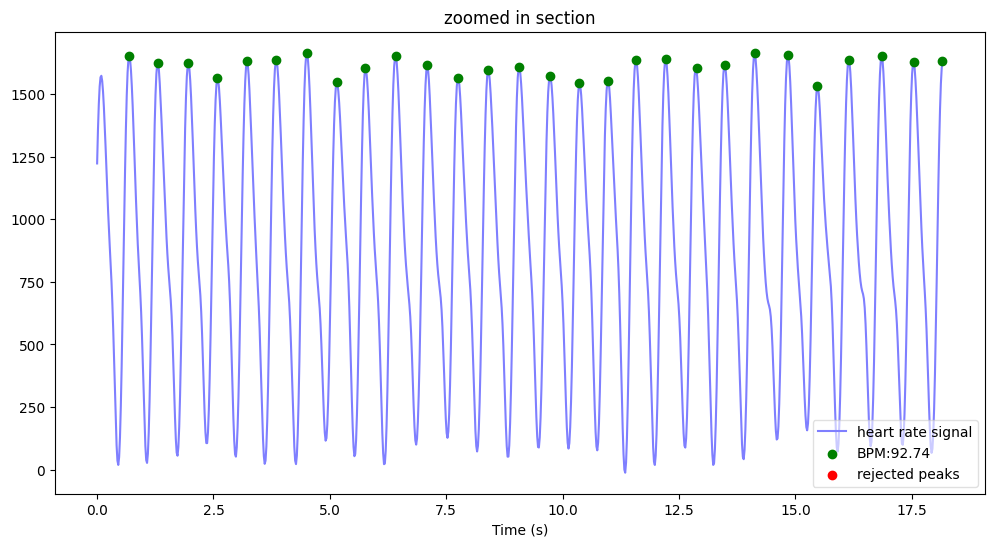

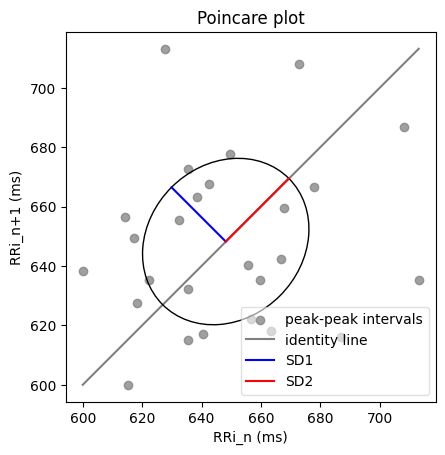

bpm: 92.742460
ibi: 646.952862
sdnn: 28.176815
sdsd: 20.263614
rmssd: 36.498491
pnn20: 0.730769
pnn50: 0.115385
hr_mad: 22.181818
sd1: 25.808273
sd2: 30.035948
s: 2435.287122
sd1/sd2: 0.859246
breathingrate: 0.171851
(M)009_20230507_095758_Verity.csv
인덱스 길이: 42341


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


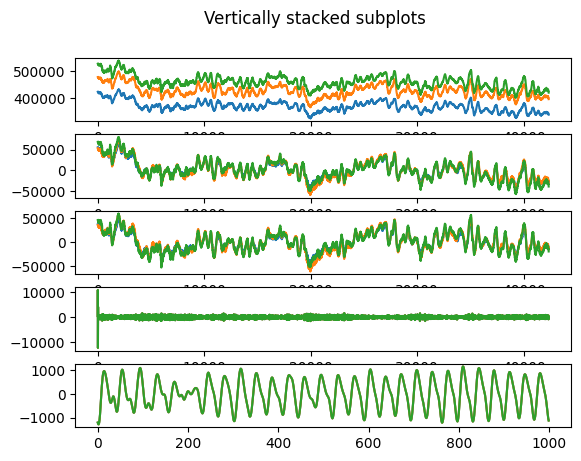

<Figure size 1200x800 with 0 Axes>

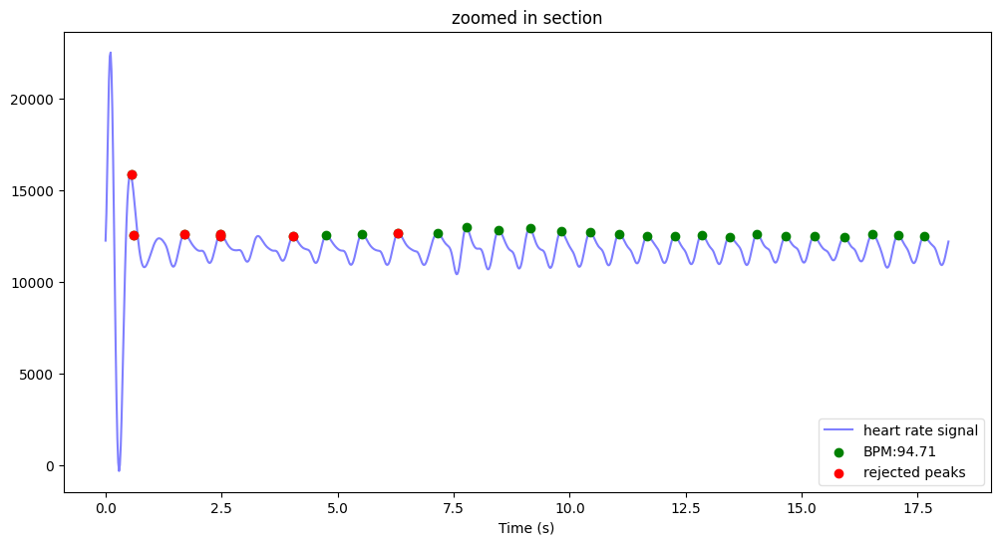

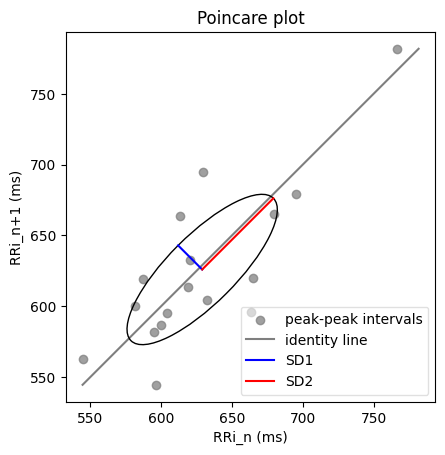

bpm: 94.712991
ibi: 633.492823
sdnn: 61.119022
sdsd: 19.596764
rmssd: 34.137081
pnn20: 0.411765
pnn50: 0.235294
hr_mad: 32.363636
sd1: 24.043157
sd2: 71.136013
s: 5373.173646
sd1/sd2: 0.337989
breathingrate: 0.166279


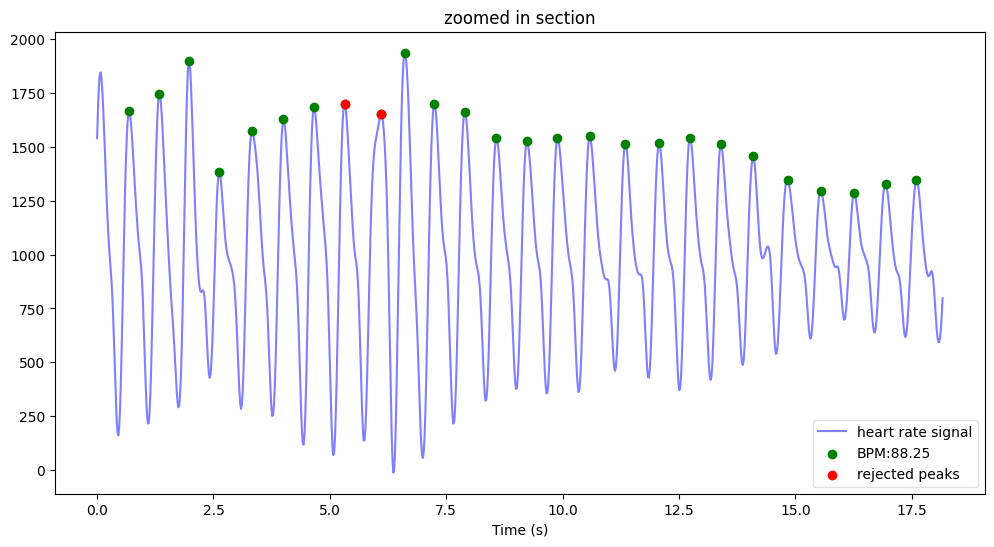

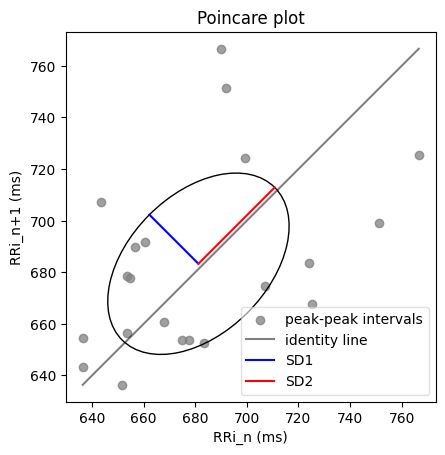

bpm: 88.252222
ibi: 679.869565
sdnn: 34.778038
sdsd: 19.362315
rmssd: 38.074406
pnn20: 0.761905
pnn50: 0.238095
hr_mad: 21.181818
sd1: 26.883047
sd2: 41.829089
s: 3532.700088
sd1/sd2: 0.642688
breathingrate: 0.256000


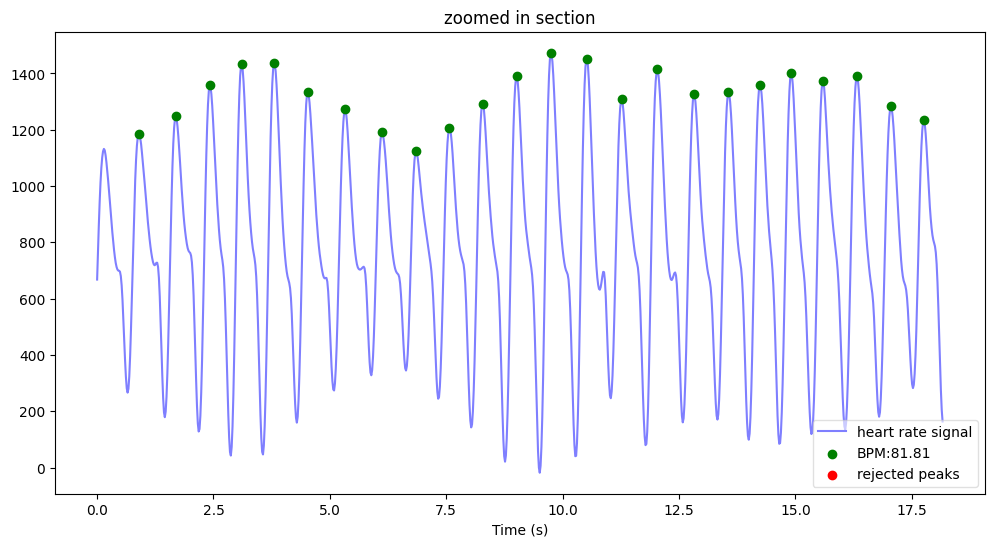

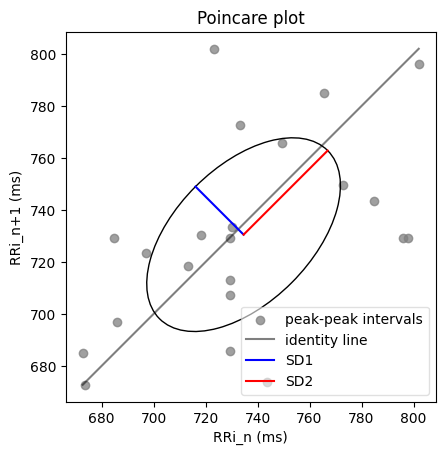

bpm: 81.808187
ibi: 733.422925
sdnn: 37.928897
sdsd: 23.966600
rmssd: 37.215588
pnn20: 0.500000
pnn50: 0.181818
hr_mad: 22.181818
sd1: 26.152674
sd2: 45.748244
s: 3758.723613
sd1/sd2: 0.571665
breathingrate: 0.177968


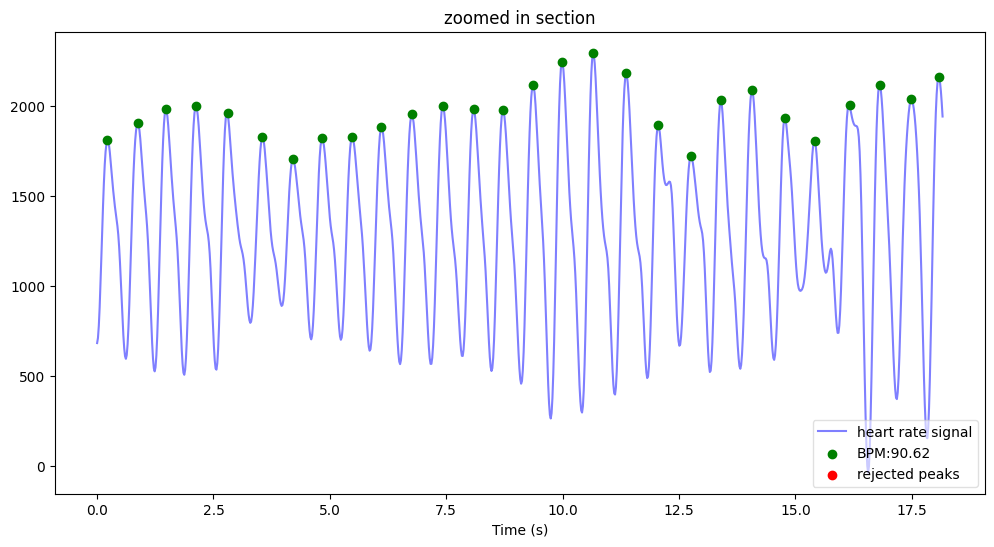

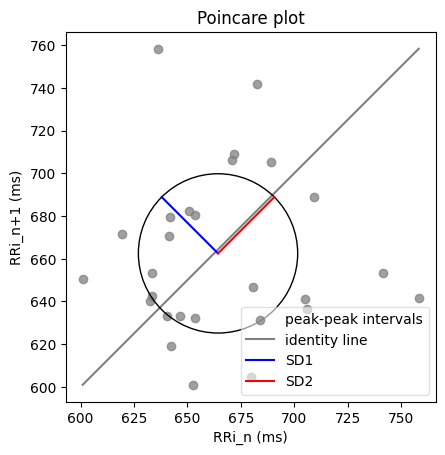

bpm: 90.616467
ibi: 662.131313
sdnn: 37.461412
sdsd: 30.536108
rmssd: 52.765151
pnn20: 0.807692
pnn50: 0.346154
hr_mad: 19.181818
sd1: 37.288011
sd2: 37.274684
s: 4366.495974
sd1/sd2: 1.000358
breathingrate: 0.223914


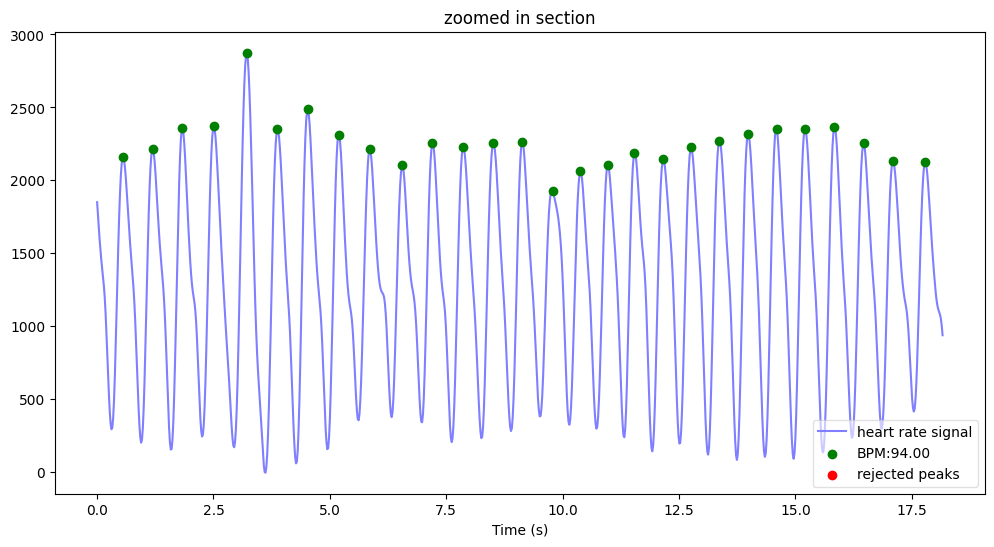

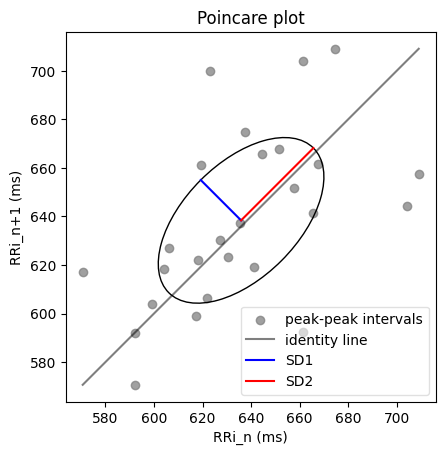

bpm: 94.003703
ibi: 638.272727
sdnn: 34.568104
sdsd: 21.245646
rmssd: 33.344138
pnn20: 0.538462
pnn50: 0.153846
hr_mad: 26.000000
sd1: 23.512059
sd2: 42.143075
s: 3112.911409
sd1/sd2: 0.557910
breathingrate: 0.290293
(M)010_20230507_103416_Verity.csv
인덱스 길이: 72645
안됨


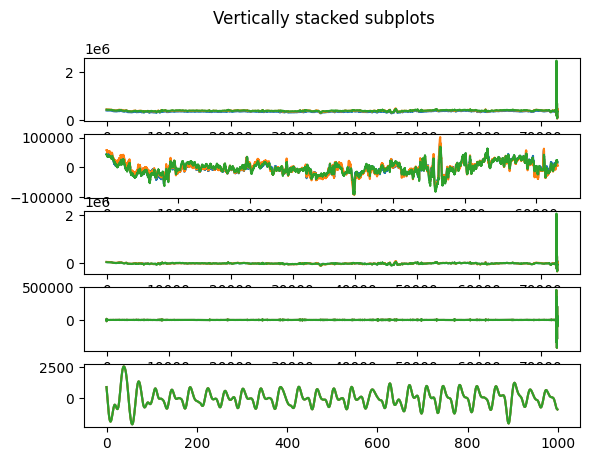

<Figure size 1200x800 with 0 Axes>

(M)011_20230507_120541_Verity.csv
인덱스 길이: 76110
안됨


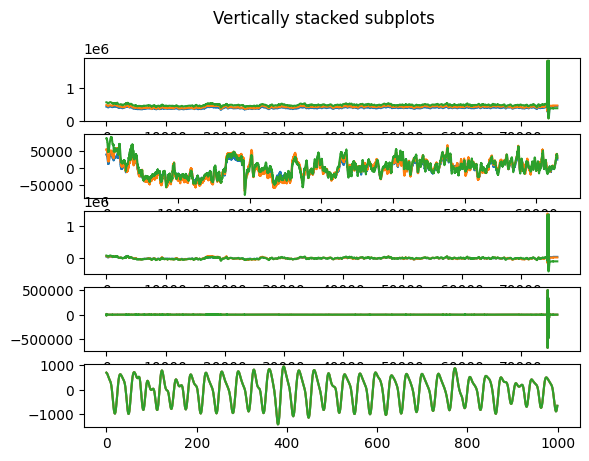

<Figure size 1200x800 with 0 Axes>

(M)012_20230507_093010_Verity.csv
인덱스 길이: 72631


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


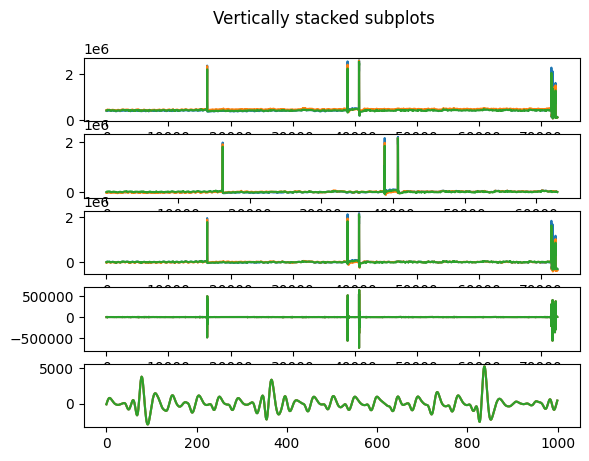

<Figure size 1200x800 with 0 Axes>

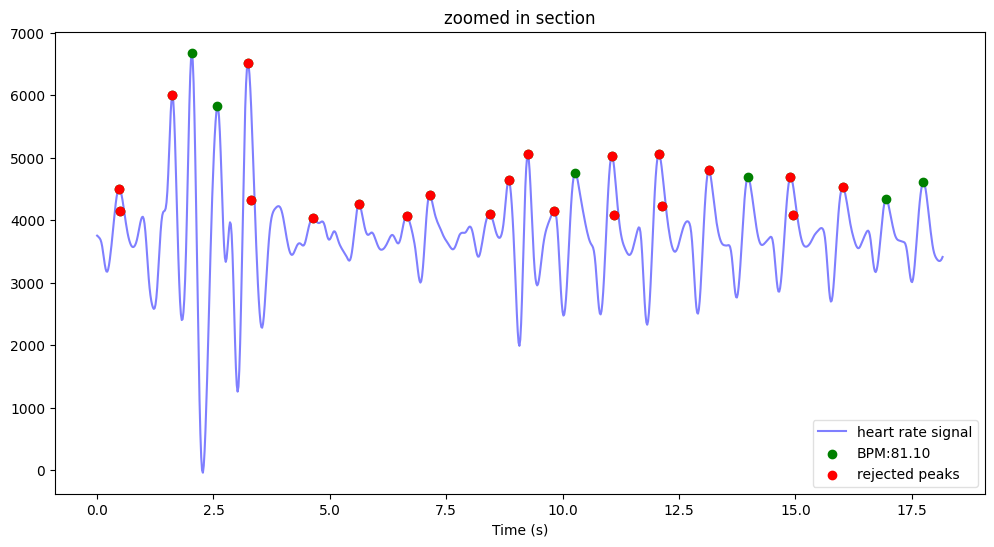

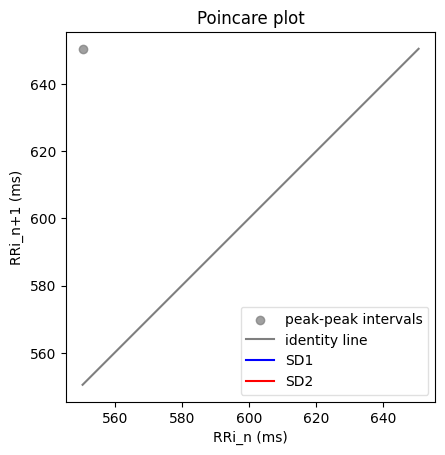

bpm: 81.104994
ibi: 739.781818
sdnn: 125.916089
sdsd: 0.000000
rmssd: 100.090909
pnn20: 1.000000
pnn50: 1.000000
hr_mad: 127.272727
sd1: 0.000000
sd2: 0.000000
s: 0.000000
sd1/sd2: nan
breathingrate: 0.270490


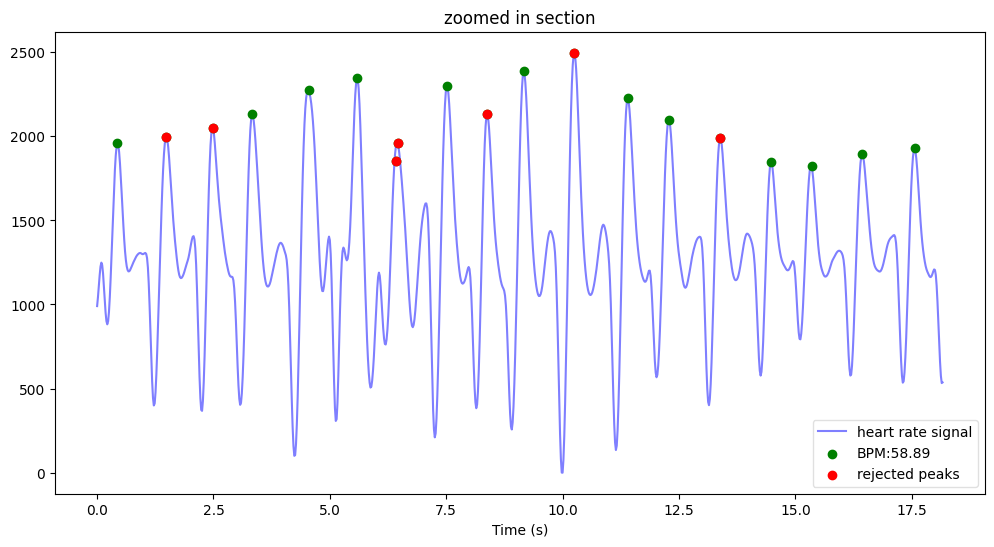

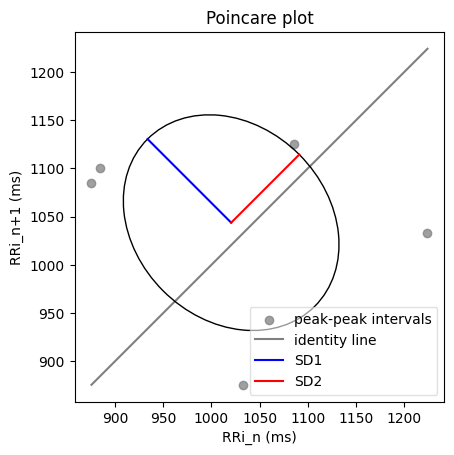

bpm: 58.886510
ibi: 1018.909091
sdnn: 117.597264
sdsd: 64.497729
rmssd: 174.958692
pnn20: 1.000000
pnn50: 0.800000
hr_mad: 75.727273
sd1: 122.616822
sd2: 99.878662
s: 38474.469723
sd1/sd2: 1.227658
breathingrate: 0.178540
안됨


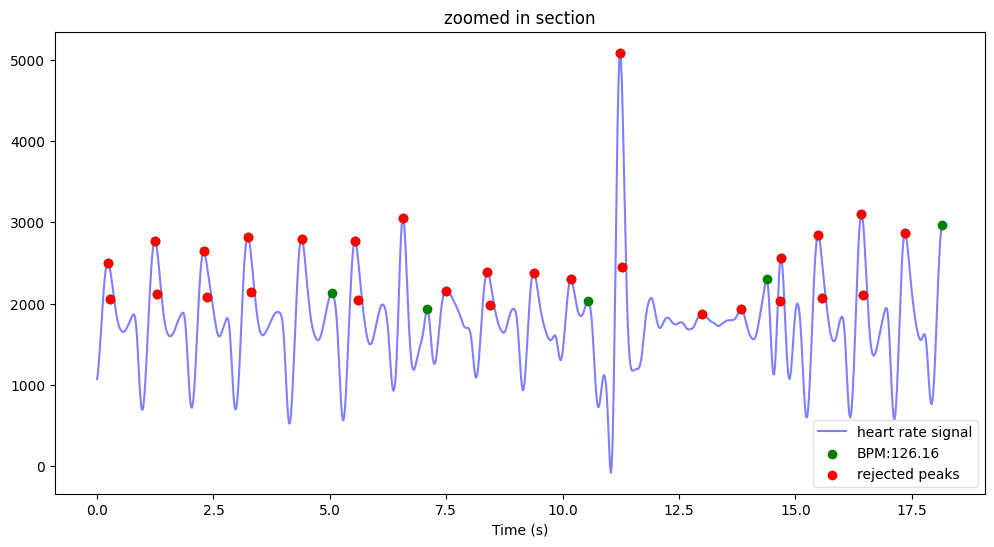

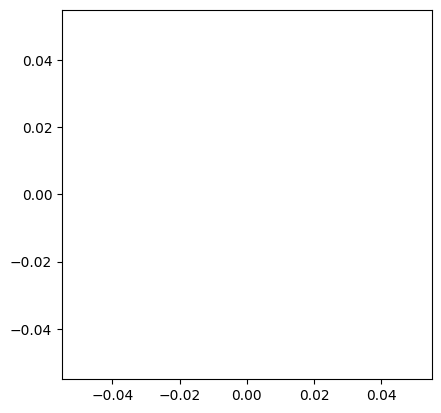

(M)013_20230507_113448_Verity.csv
인덱스 길이: 80733
안됨


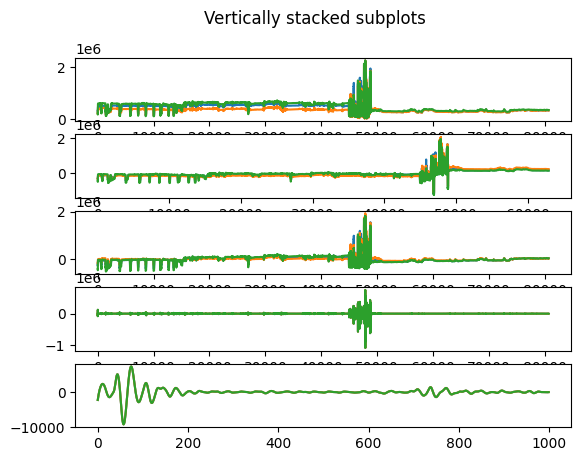

<Figure size 1200x800 with 0 Axes>

(M)014_20230507_095721_Verity.csv
인덱스 길이: 36101


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


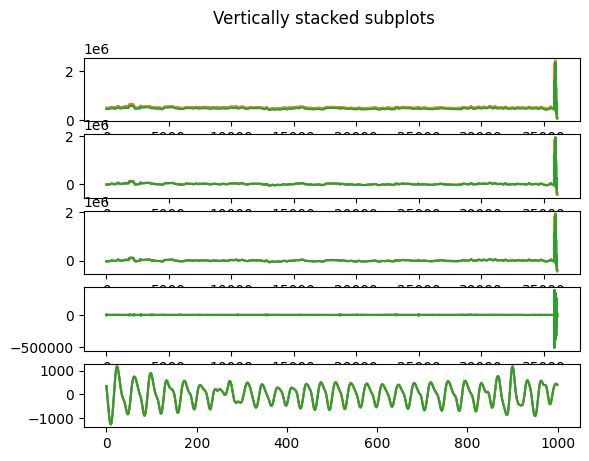

<Figure size 1200x800 with 0 Axes>

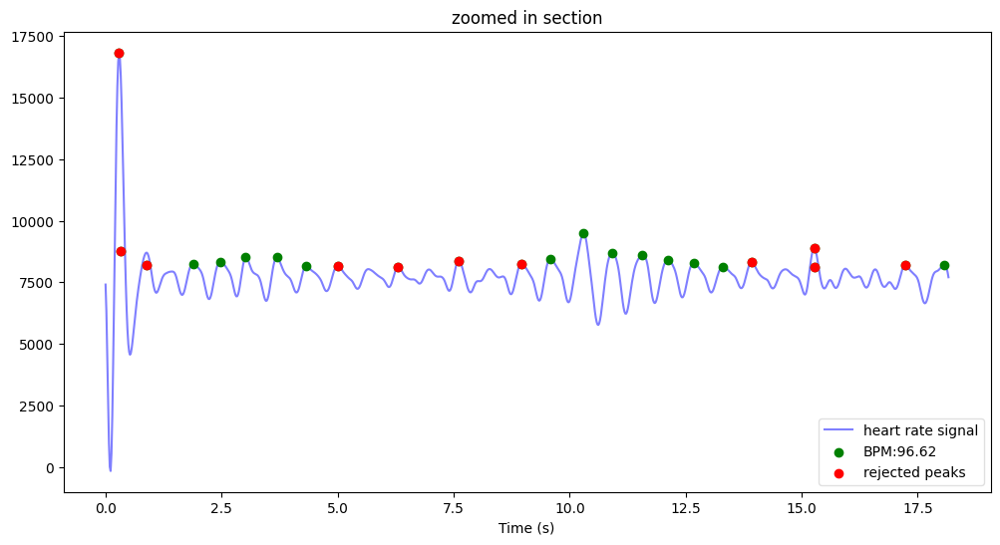

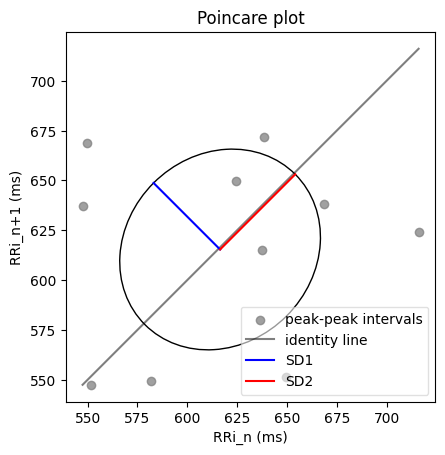

bpm: 96.624251
ibi: 620.962121
sdnn: 51.818720
sdsd: 38.351968
rmssd: 66.760761
pnn20: 0.900000
pnn50: 0.400000
hr_mad: 39.363636
sd1: 47.200578
sd2: 53.345408
s: 7910.323352
sd1/sd2: 0.884811
breathingrate: 0.134300


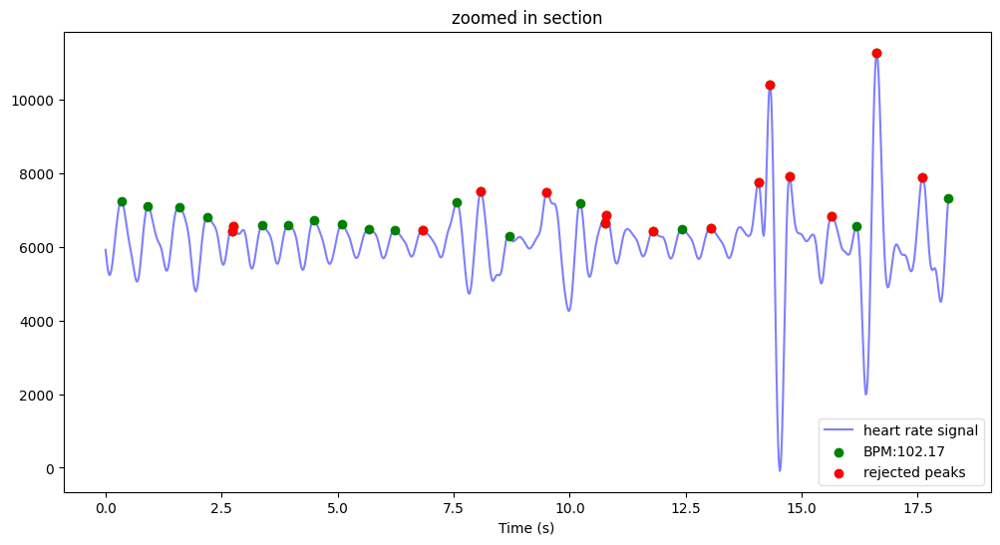

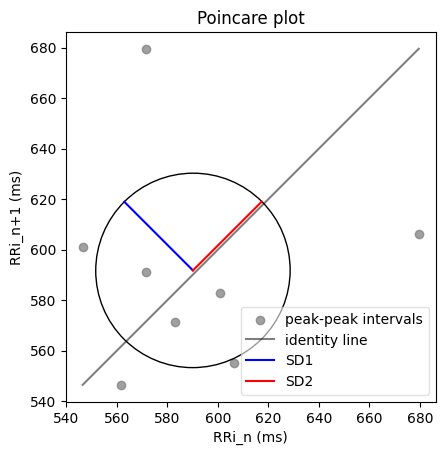

bpm: 102.166128
ibi: 587.278788
sdnn: 78.482750
sdsd: 32.110586
rmssd: 54.388420
pnn20: 0.500000
pnn50: 0.500000
hr_mad: 25.181818
sd1: 38.440767
sd2: 38.568750
s: 4657.764083
sd1/sd2: 0.996682
breathingrate: 0.113611


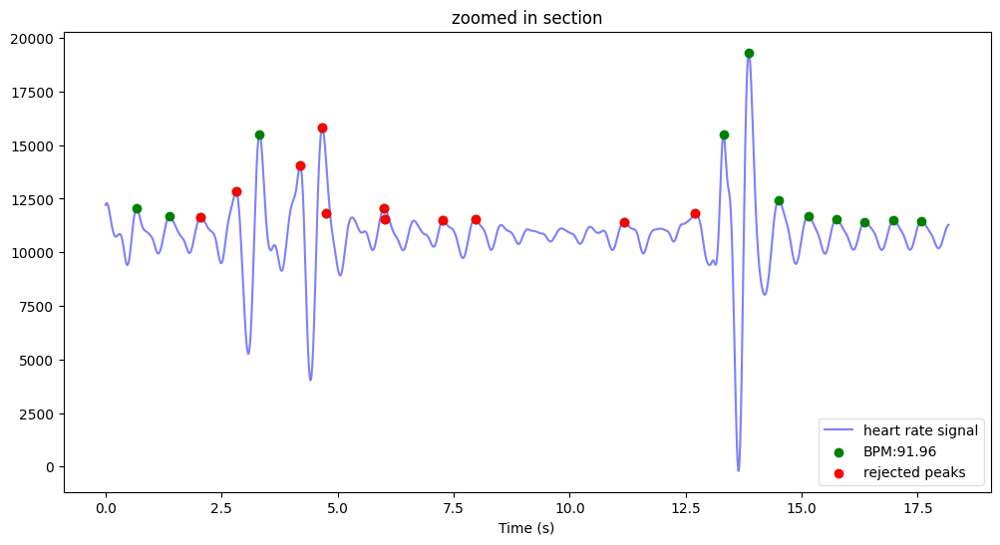

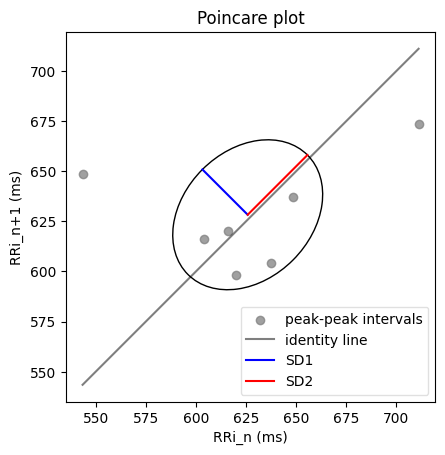

bpm: 91.964273
ibi: 652.427273
sdnn: 84.714621
sdsd: 31.801162
rmssd: 45.252838
pnn20: 0.571429
pnn50: 0.142857
hr_mad: 27.772727
sd1: 31.951483
sd2: 42.150090
s: 4230.964756
sd1/sd2: 0.758041
breathingrate: 0.306748


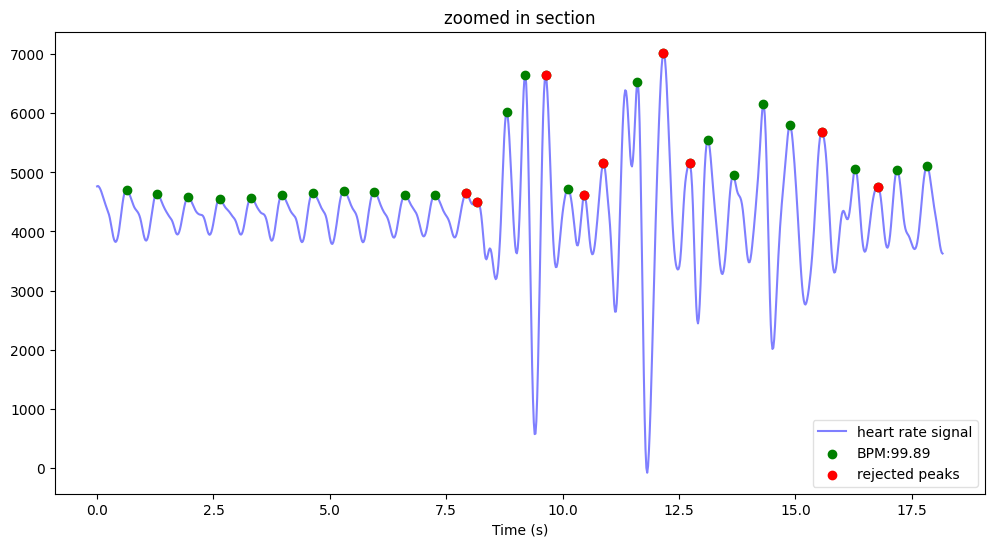

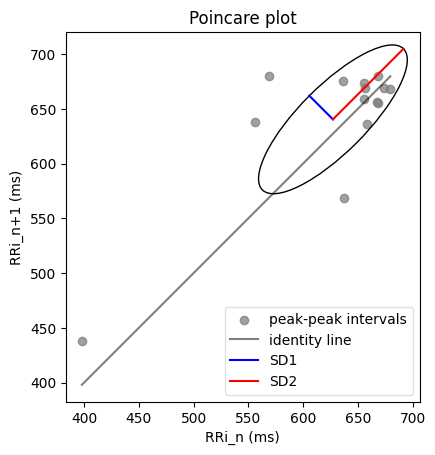

bpm: 99.889012
ibi: 600.666667
sdnn: 97.888870
sdsd: 31.629677
rmssd: 45.021456
pnn20: 0.428571
pnn50: 0.214286
hr_mad: 19.181818
sd1: 30.448291
sd2: 91.119765
s: 8716.163766
sd1/sd2: 0.334157
breathingrate: 0.158705


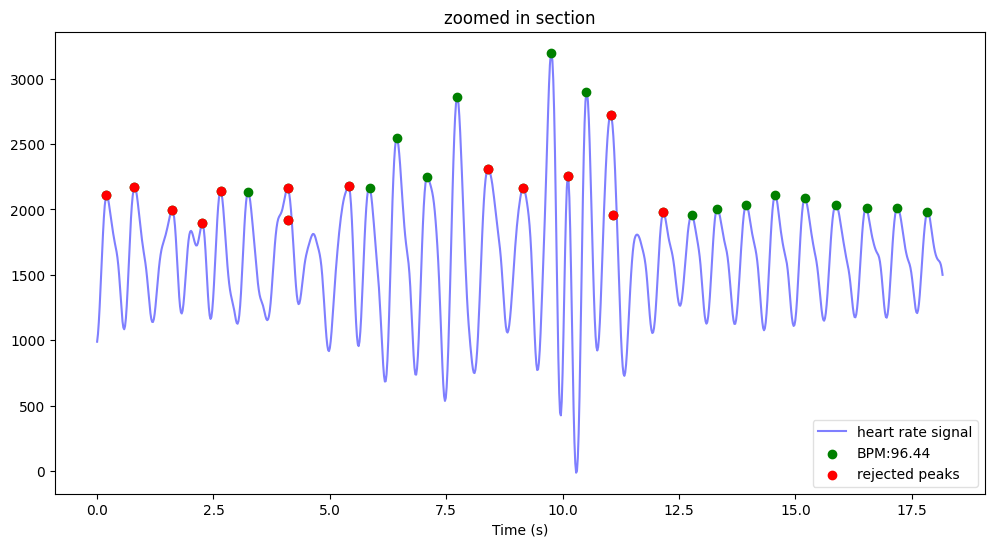

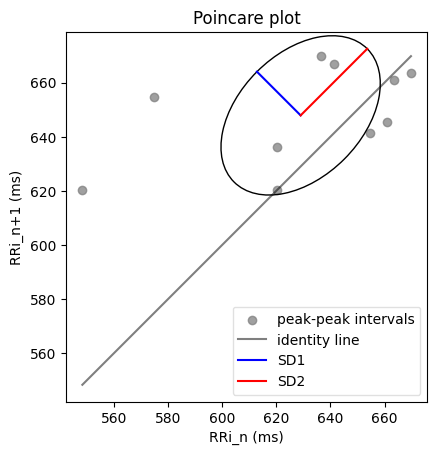

bpm: 96.437652
ibi: 622.163636
sdnn: 101.254218
sdsd: 26.452435
rmssd: 37.353073
pnn20: 0.400000
pnn50: 0.200000
hr_mad: 22.000000
sd1: 22.797097
sd2: 34.758708
s: 2489.390658
sd1/sd2: 0.655867
breathingrate: 0.214454
(M)016_20230507_085913_Verity.csv
인덱스 길이: 77433


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


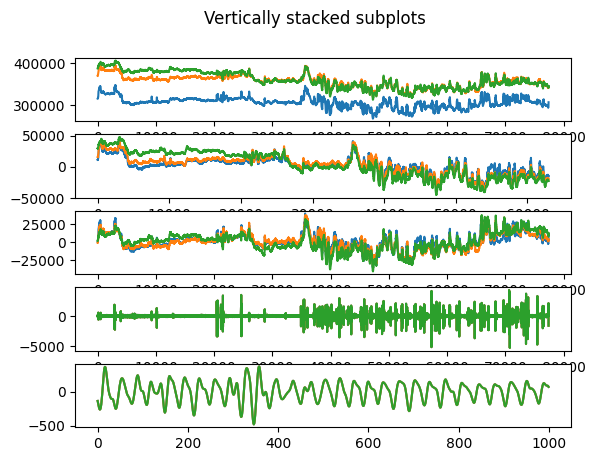

<Figure size 1200x800 with 0 Axes>

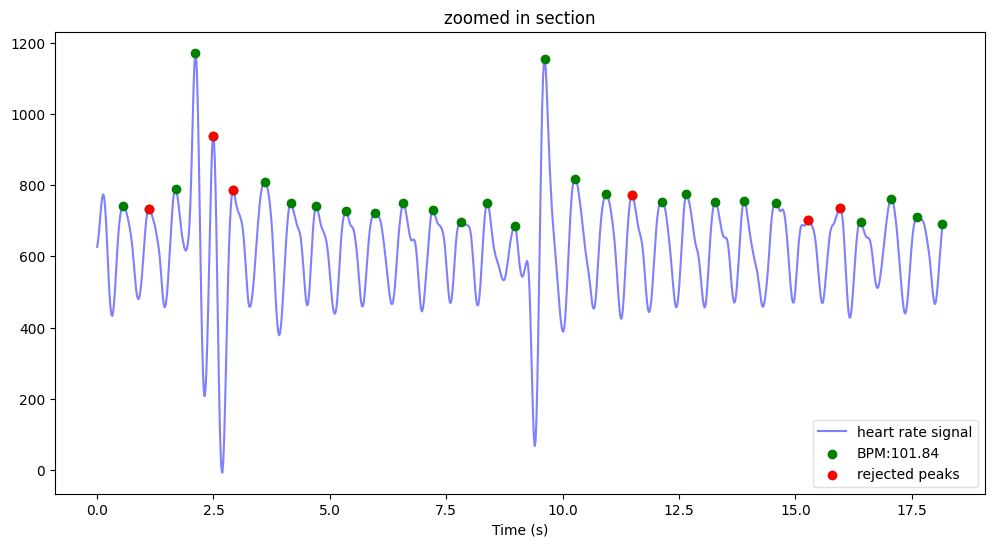

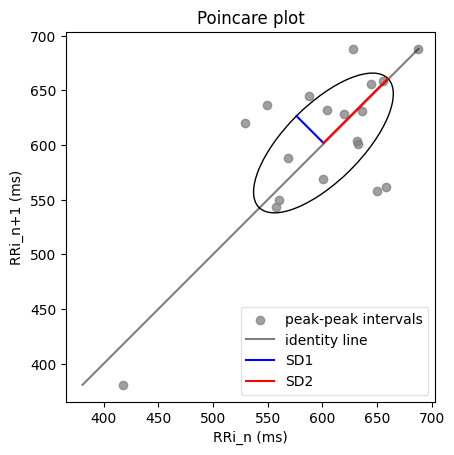

bpm: 101.840065
ibi: 589.159091
sdnn: 73.379801
sdsd: 32.151057
rmssd: 49.335846
pnn20: 0.578947
pnn50: 0.315789
hr_mad: 43.454545
sd1: 34.879974
sd2: 83.379258
s: 9136.588053
sd1/sd2: 0.418329
breathingrate: 0.212344


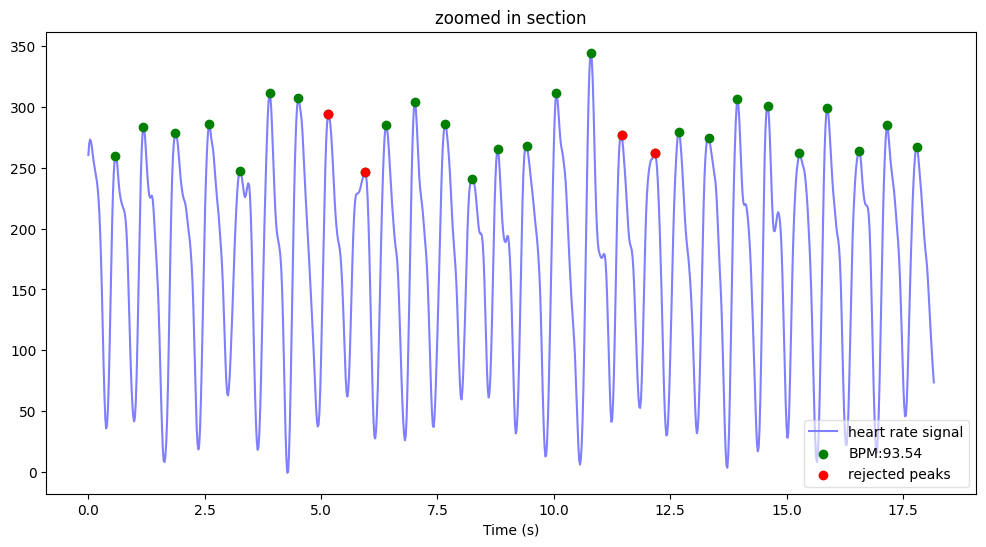

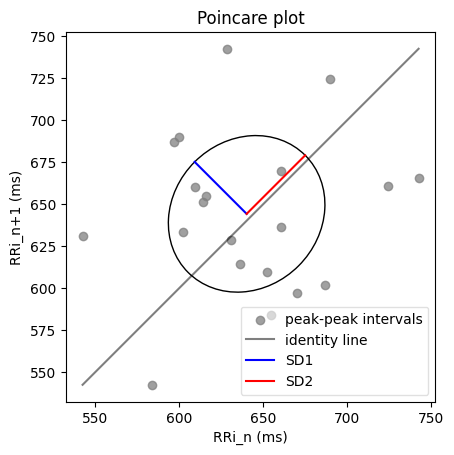

bpm: 93.544908
ibi: 641.403162
sdnn: 44.291182
sdsd: 29.855800
rmssd: 61.994478
pnn20: 0.900000
pnn50: 0.500000
hr_mad: 27.000000
sd1: 43.740956
sd2: 49.282429
s: 6772.207431
sd1/sd2: 0.887557
breathingrate: 0.271352
안됨
(M)017_20230507_110427_Verity.csv
인덱스 길이: 76497


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


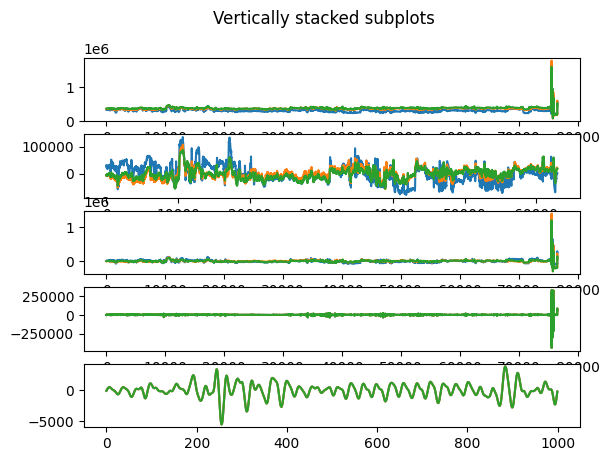

<Figure size 1200x800 with 0 Axes>

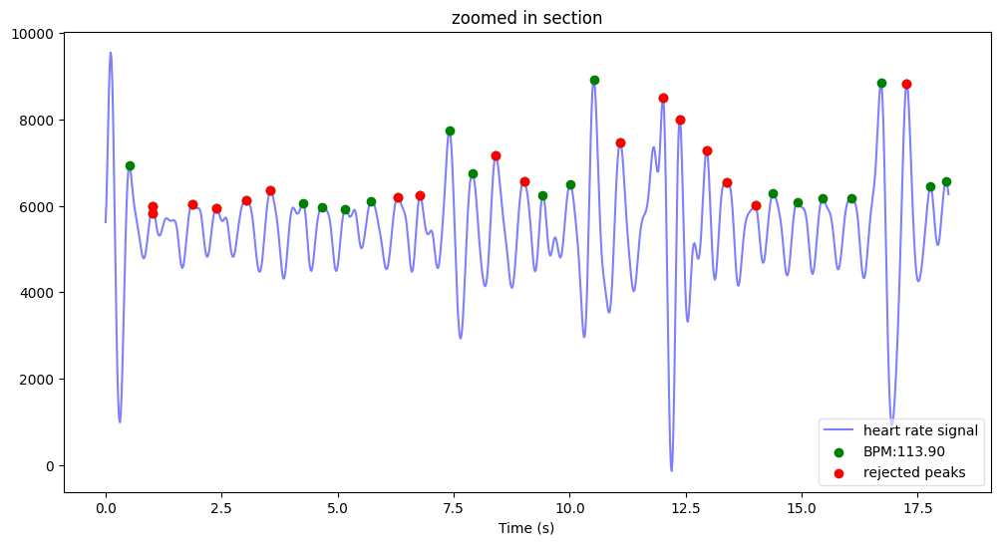

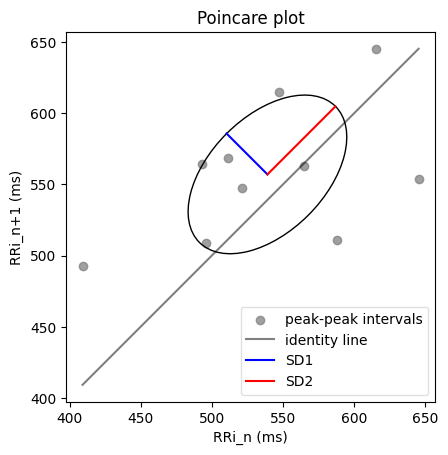

bpm: 113.898656
ibi: 526.784091
sdnn: 72.208826
sdsd: 30.060210
rmssd: 60.126410
pnn20: 0.800000
pnn50: 0.600000
hr_mad: 32.272727
sd1: 40.577985
sd2: 67.619469
s: 8620.096113
sd1/sd2: 0.600093
breathingrate: 0.118723


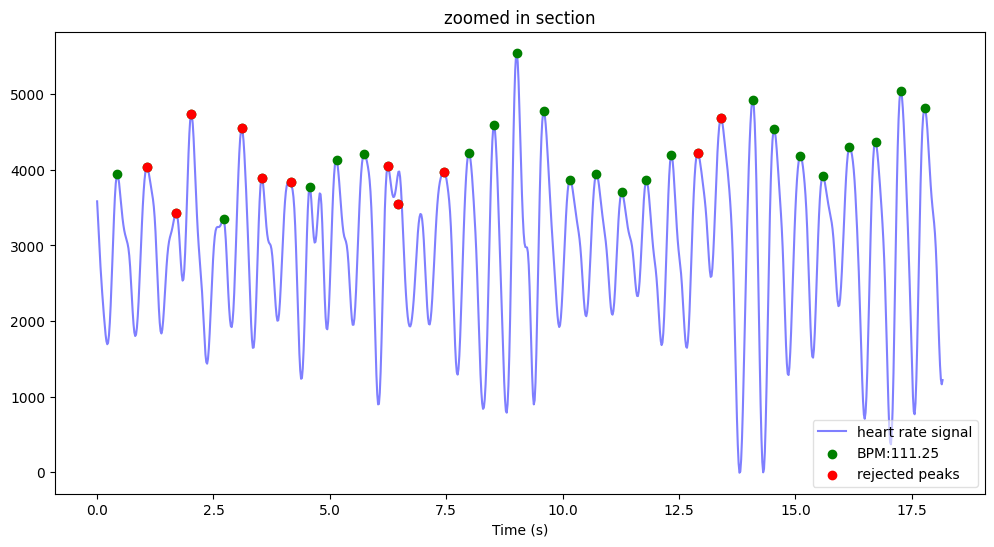

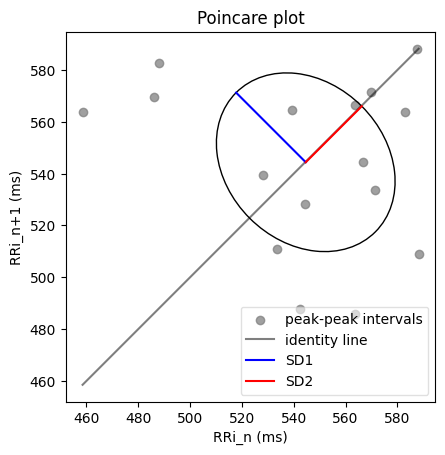

bpm: 111.253813
ibi: 539.307359
sdnn: 51.768804
sdsd: 34.798132
rmssd: 53.715860
pnn20: 0.625000
pnn50: 0.375000
hr_mad: 27.000000
sd1: 37.982474
sd2: 30.561642
s: 3646.781990
sd1/sd2: 1.242815
breathingrate: 0.176772


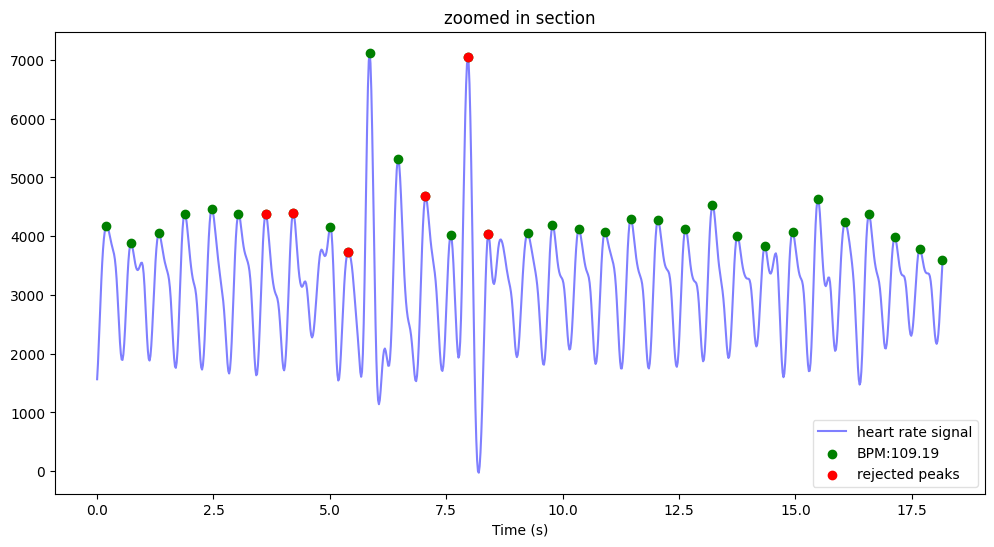

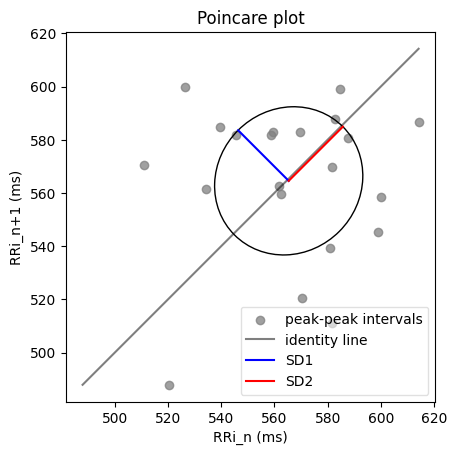

bpm: 109.192257
ibi: 549.489510
sdnn: 57.454717
sdsd: 21.341158
rmssd: 38.028878
pnn20: 0.666667
pnn50: 0.190476
hr_mad: 20.681818
sd1: 26.884253
sd2: 28.780684
s: 2430.798554
sd1/sd2: 0.934108
breathingrate: 0.140154


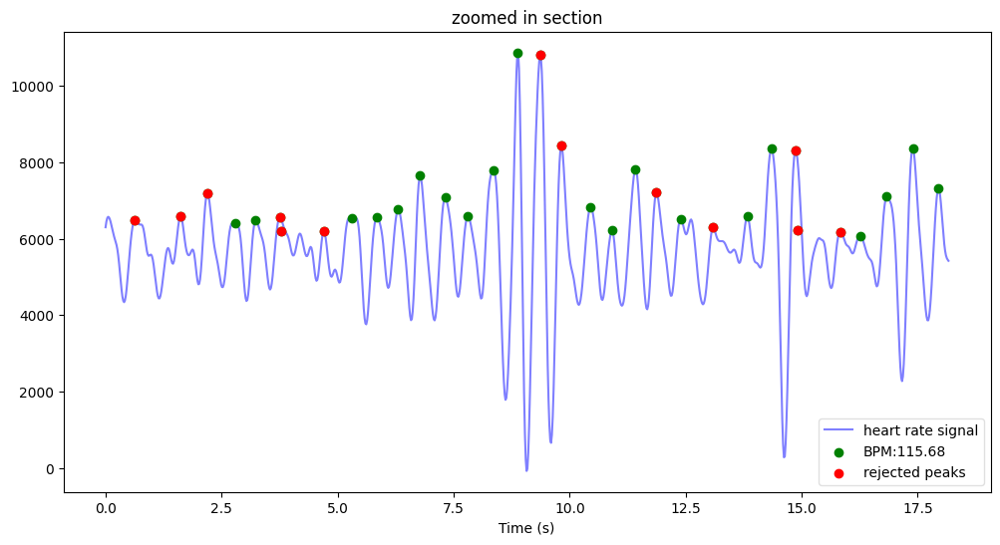

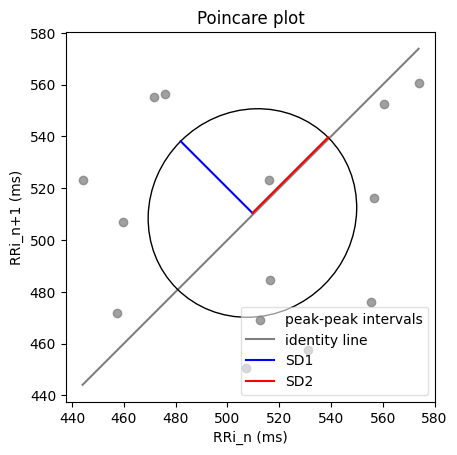

bpm: 115.679455
ibi: 518.674641
sdnn: 57.452973
sdsd: 28.967947
rmssd: 55.424450
pnn20: 0.692308
pnn50: 0.461538
hr_mad: 40.181818
sd1: 39.187433
sd2: 41.298926
s: 5084.350086
sd1/sd2: 0.948873
breathingrate: 0.304661


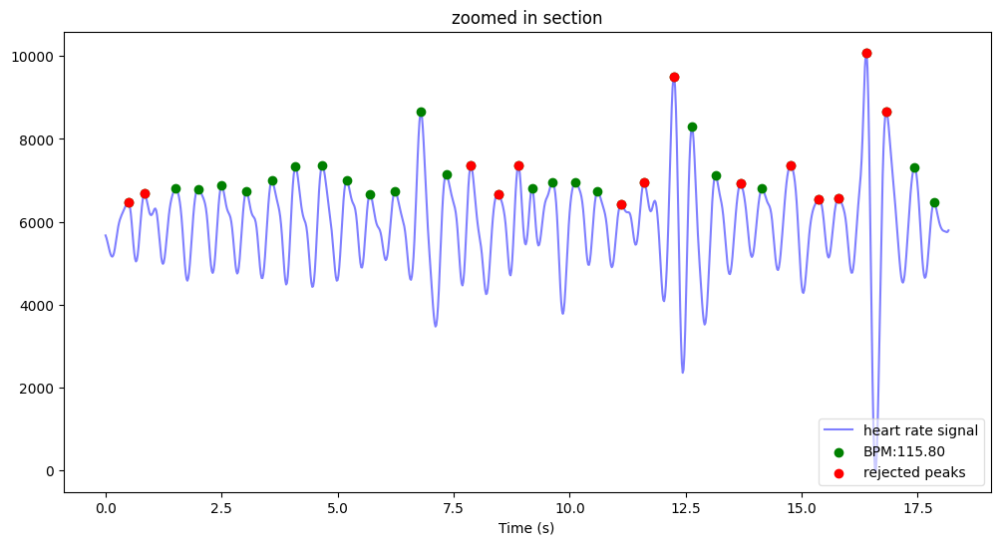

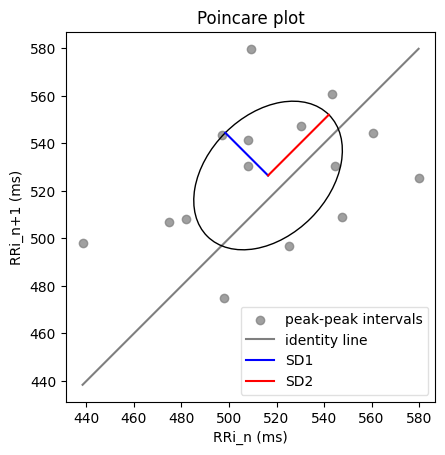

bpm: 115.798616
ibi: 518.140909
sdnn: 44.111771
sdsd: 16.788852
rmssd: 37.349669
pnn20: 0.733333
pnn50: 0.200000
hr_mad: 25.272727
sd1: 25.440036
sd2: 36.184989
s: 2891.984965
sd1/sd2: 0.703055
breathingrate: 0.289715
(M)018_20230507_100932_Verity.csv
인덱스 길이: 74282
안됨


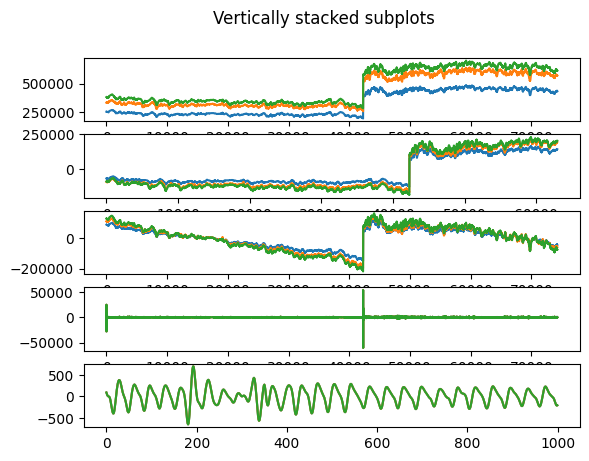

<Figure size 1200x800 with 0 Axes>

(M)019_20230507_101420_Verity.csv
인덱스 길이: 55428


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


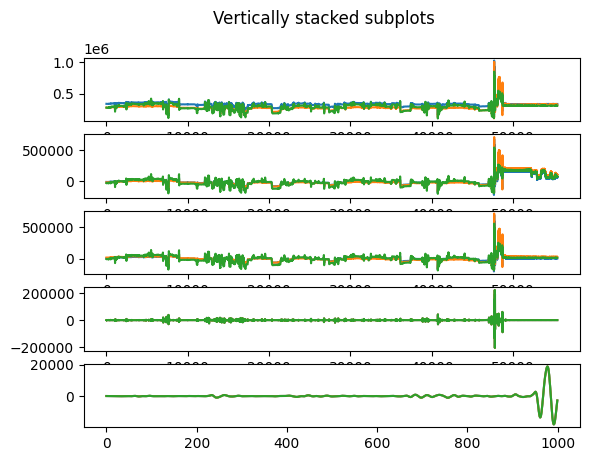

<Figure size 1200x800 with 0 Axes>

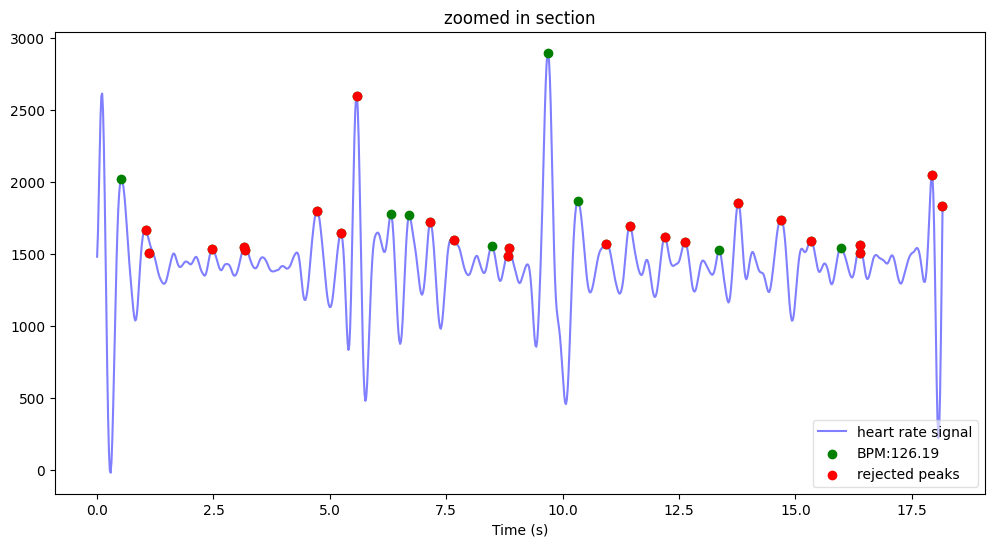

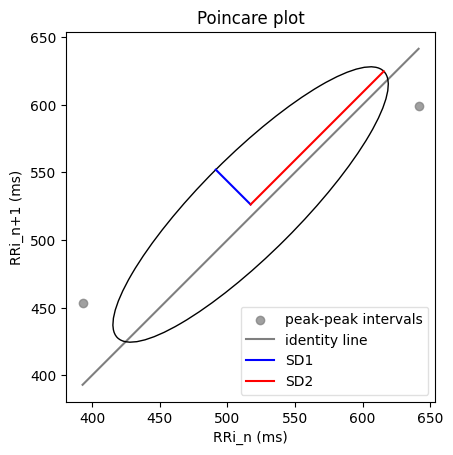

bpm: 126.188997
ibi: 475.477273
sdnn: 93.834992
sdsd: 9.090909
rmssd: 52.251458
pnn20: 1.000000
pnn50: 0.500000
hr_mad: 46.954545
sd1: 36.383858
sd2: 139.235753
s: 15915.100674
sd1/sd2: 0.261311
breathingrate: 0.263296


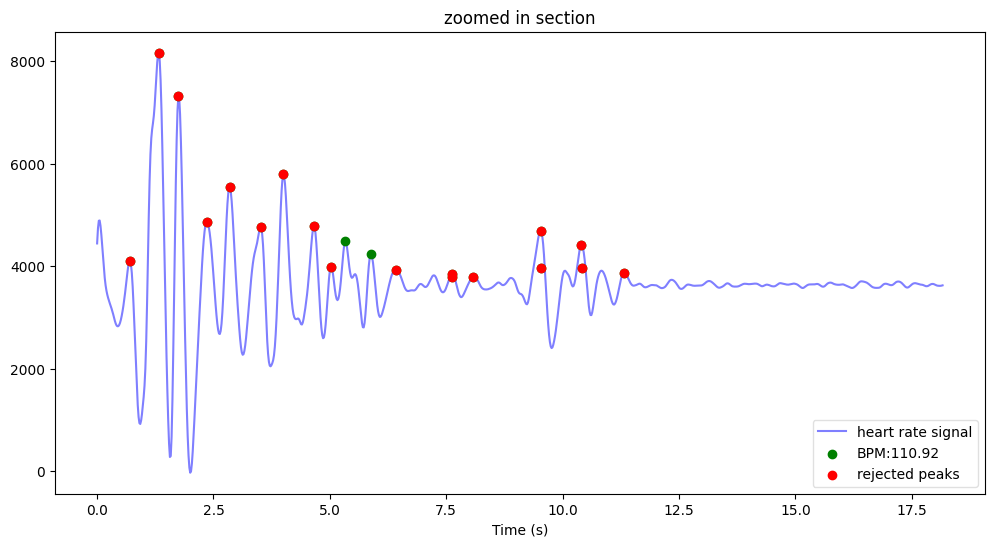

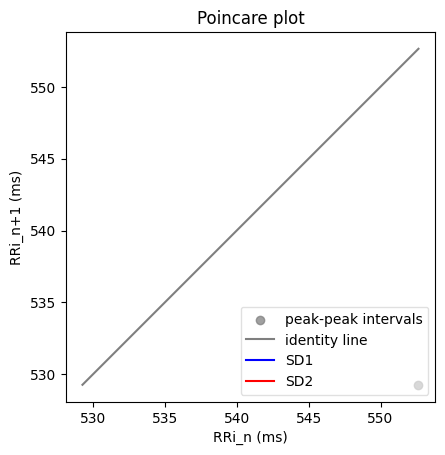

bpm: 110.915049
ibi: 540.954545
sdnn: 11.681818
sdsd: 0.000000
rmssd: 23.363636
pnn20: 1.000000
pnn50: 0.000000
hr_mad: 11.681818
sd1: 0.000000
sd2: 0.000000
s: 0.000000
sd1/sd2: nan
breathingrate: nan
안됨


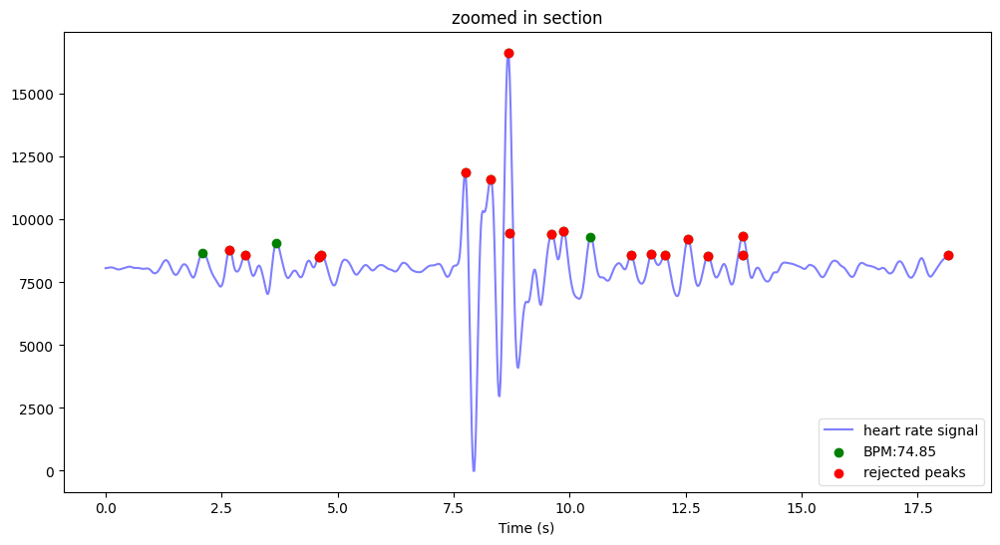

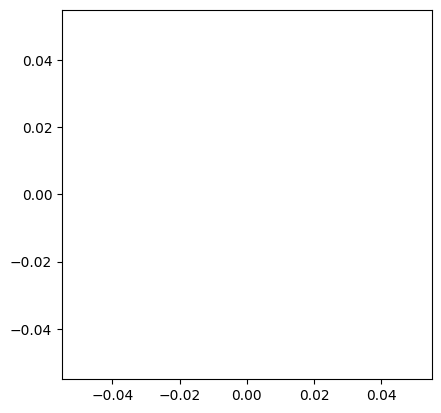

(M)020_20230507_122941_Verity.csv
인덱스 길이: 62943


/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:119: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
/home/pilab/.local/lib/python3.10/site-packages/heartpy/visualizeutils.py:299: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


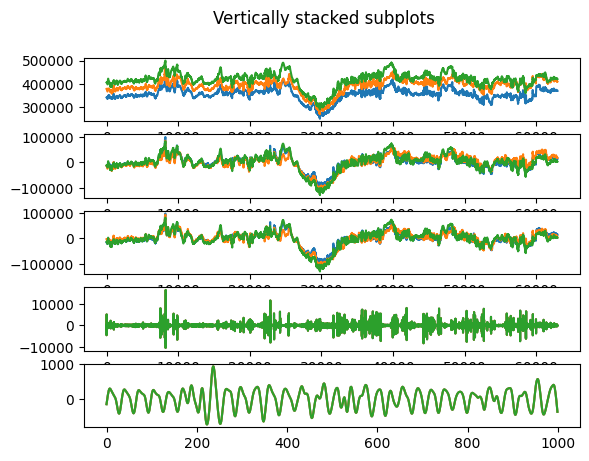

<Figure size 1200x800 with 0 Axes>

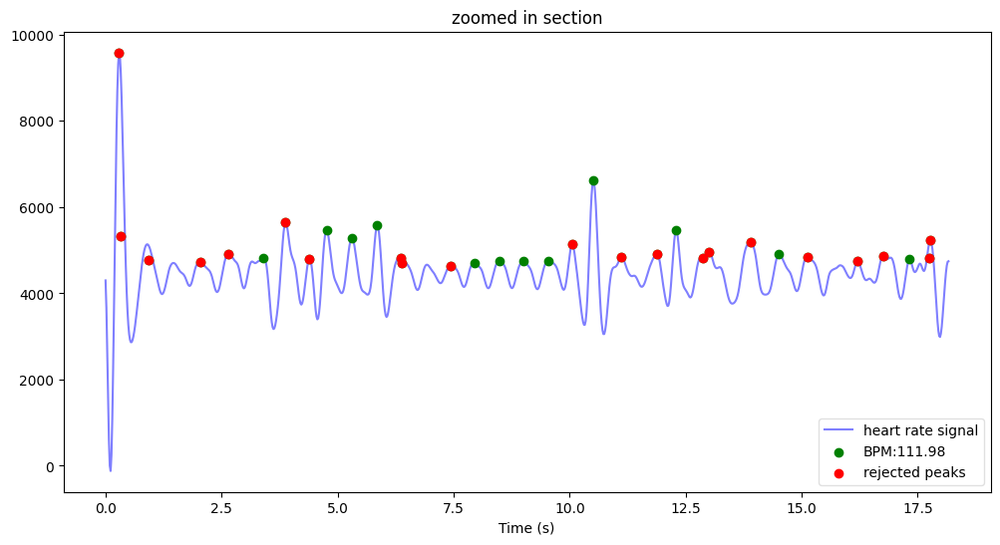

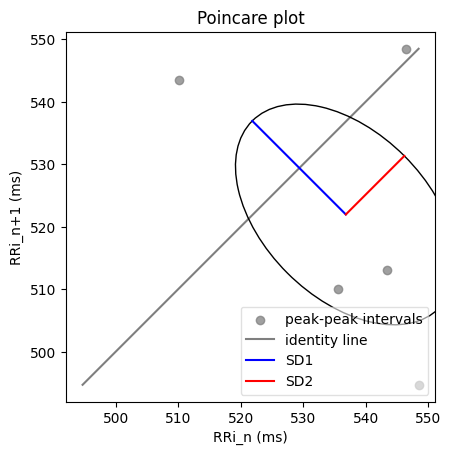

bpm: 111.984616
ibi: 535.787879
sdnn: 51.657384
sdsd: 16.572705
rmssd: 33.401415
pnn20: 0.800000
pnn50: 0.200000
hr_mad: 37.136364
sd1: 21.154161
sd2: 13.233978
s: 879.500497
sd1/sd2: 1.598473
breathingrate: 0.155642


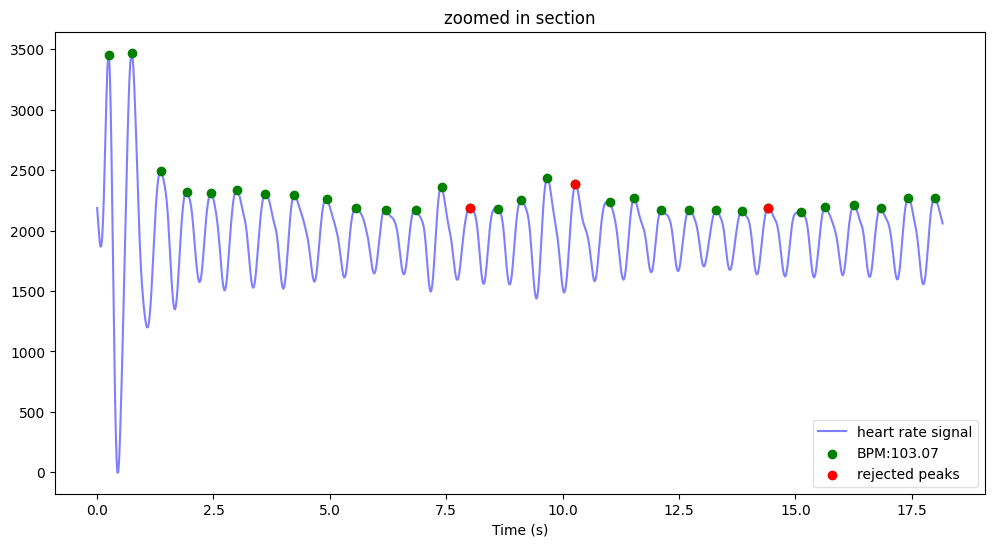

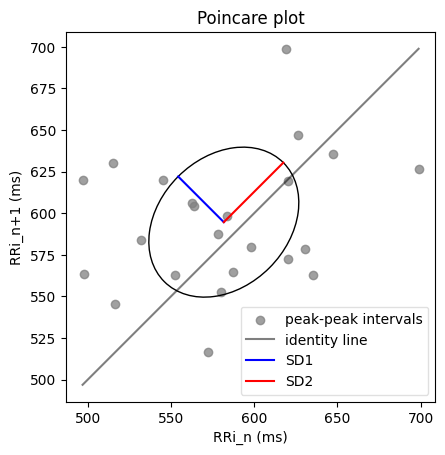

bpm: 103.069529
ibi: 582.131313
sdnn: 47.147681
sdsd: 32.427354
rmssd: 56.306691
pnn20: 0.739130
pnn50: 0.434783
hr_mad: 34.363636
sd1: 38.762231
sd2: 50.546786
s: 6155.341959
sd1/sd2: 0.766858
breathingrate: 0.191034


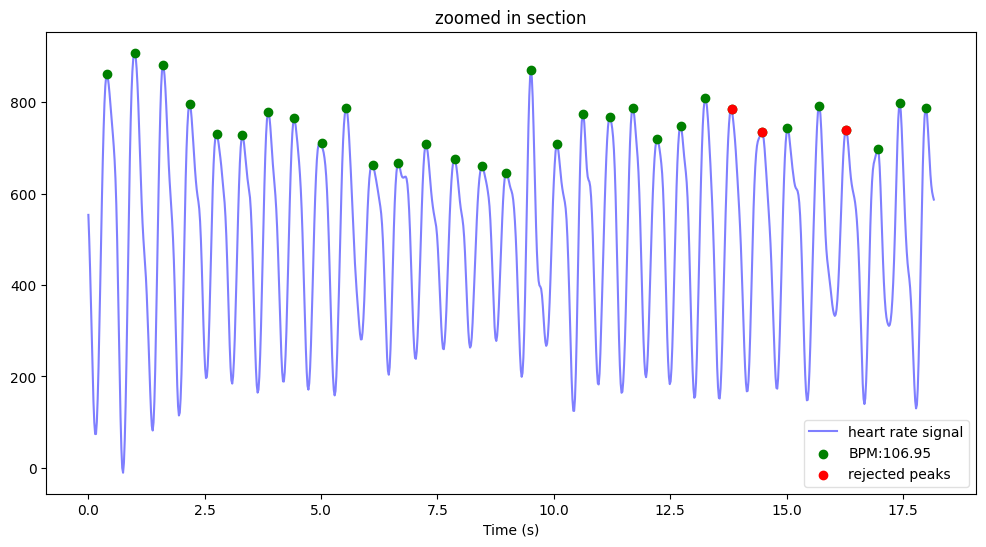

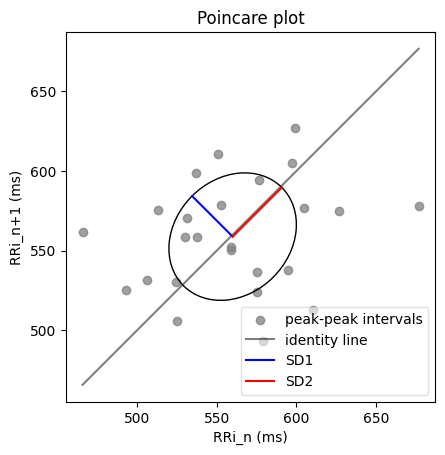

bpm: 106.945682
ibi: 561.032468
sdnn: 43.171183
sdsd: 28.543833
rmssd: 50.977062
pnn20: 0.760000
pnn50: 0.400000
hr_mad: 29.363636
sd1: 36.036538
sd2: 43.641963
s: 4940.799273
sd1/sd2: 0.825731
breathingrate: 0.318593


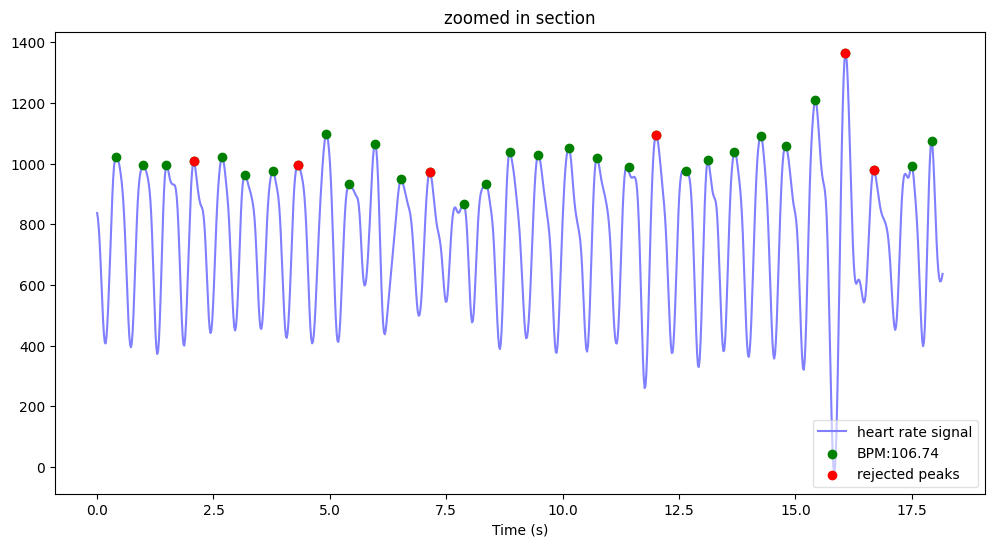

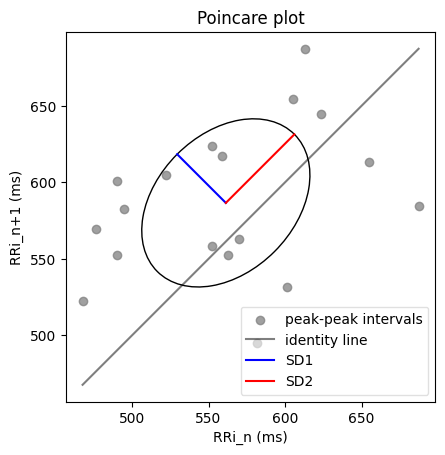

bpm: 106.740702
ibi: 562.109848
sdnn: 63.633533
sdsd: 31.762823
rmssd: 68.398095
pnn20: 0.833333
pnn50: 0.666667
hr_mad: 45.454545
sd1: 44.950636
sd2: 63.331774
s: 8943.497087
sd1/sd2: 0.709764
breathingrate: 0.222601


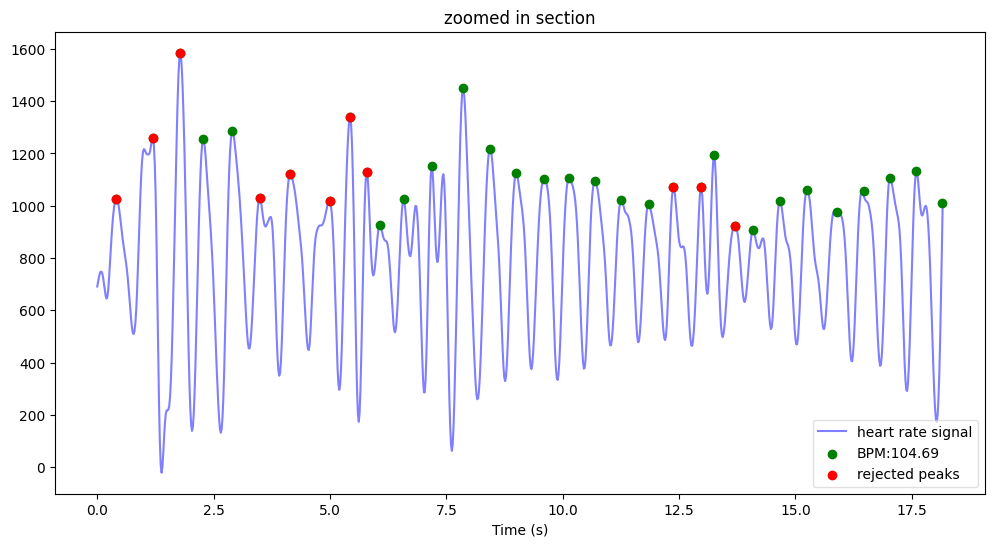

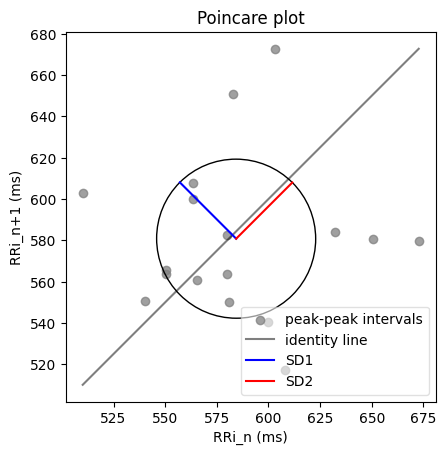

bpm: 104.691477
ibi: 573.112554
sdnn: 48.846674
sdsd: 30.892917
rmssd: 54.632133
pnn20: 0.647059
pnn50: 0.411765
hr_mad: 23.181818
sd1: 38.549071
sd2: 38.440044
s: 4655.299854
sd1/sd2: 1.002836
breathingrate: 0.332668


In [25]:
print('피험자 수:', len(mast_verity_dict), '명')
fs = VERITY_FS
#cutoff Wn
# cutoff = [fs*0.03,fs/2*0.97]
cutoff = [1.5,3.5]
ts = 1/ fs
Nyq = fs / 2
# 파라미터 계수 N
order = 2

sos = signal.butter(order, cutoff, btype='bandpass', output = 'sos', fs = fs)


for i in mast_verity_dict:
    print(i)
    print('인덱스 길이:',len(mast_verity_dict[i]))
    signals = mast_verity_dict[i][['ppg0', 'ppg1', 'ppg2', 'ambient']]

    # data resampling
    sample_rate = VERITY_FS
    resample_scale = 10
    resampled_signals = resample(signals, len(signals) * resample_scale)
    resample_length = len(resampled_signals)
    resample_rate = sample_rate * resample_scale
    
#     for j in resampled_signals:
#         #
#         resampled_signals[j]
    
    
    length = len(mast_verity_dict[i])
    f = np.linspace(-(fs / 2), fs / 2, length)

    
    # ambient = mast_verity_dict[i]['ambient'] - mast_verity_dict[i]['ambient'].mean()
    
    signal_0 = mast_verity_dict[i]['ppg0'] - mast_verity_dict[i]['ambient']
    signal_1 = mast_verity_dict[i]['ppg1'] - mast_verity_dict[i]['ambient']
    signal_2 = mast_verity_dict[i]['ppg2'] - mast_verity_dict[i]['ambient']
    
    signal_0_avdc = mast_verity_dict[i]['ppg0'] - mast_verity_dict[i]['ppg0'].mean() - ambient
    signal_1_avdc = mast_verity_dict[i]['ppg1'] - mast_verity_dict[i]['ppg1'].mean() - ambient
    signal_2_avdc = mast_verity_dict[i]['ppg2'] - mast_verity_dict[i]['ppg2'].mean() - ambient  
    
    signal_0_ffty=signal.detrend(signal_0)
    signal_1_ffty=signal.detrend(signal_1)
    signal_2_ffty=signal.detrend(signal_2)
    
    signal_0_filtered = signal.sosfilt(sos, signal_0_ffty)
    signal_1_filtered = signal.sosfilt(sos, signal_0_ffty)
    signal_2_filtered = signal.sosfilt(sos, signal_0_ffty)
    
    
    fig, axs = plt.subplots(5)
    fig.suptitle('Vertically stacked subplots')
    plt.figure(figsize=(15, 10), dpi=80)

    axs[0].plot(signal_0)
    axs[0].plot(signal_1)
    axs[0].plot(signal_2)
    
    axs[1].plot(signal_0_avdc)
    axs[1].plot(signal_1_avdc)
    axs[1].plot(signal_2_avdc)
    
    axs[2].plot(signal_0_ffty)
    axs[2].plot(signal_1_ffty)
    axs[2].plot(signal_2_ffty)
    
    axs[3].plot(signal_0_filtered)
    axs[3].plot(signal_1_filtered)
    axs[3].plot(signal_2_filtered)
    
    axs[4].plot(signal_0_filtered[6000:7000])
    axs[4].plot(signal_1_filtered[6000:7000])
    axs[4].plot(signal_2_filtered[6000:7000])
    
    try:
        for s in [[0, 1000], [1000, 2000], [2000, 3000], [3000, 4000], [4000, 5000]]:
            wd, m = hp.process(signal_0_filtered[s[0]:s[1]], sample_rate = 55, 
                               high_precision=True, clean_rr=True)
            hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
            hp.plot_poincare(wd, m)
            plt.show()
            for measure in m.keys():
                print('%s: %f' %(measure, m[measure]))
    except:
        print('안됨')
        pass
                
    
    plt.show()

In [26]:
sample_rate = VERITY_FS
for i in mast_verity_dict:
    print(i)
    print('인덱스 길이:',len(mast_verity_dict[i]))
    
    signals = mast_verity_dict[i][['ppg0', 'ppg1', 'ppg2', 'ambient']]
    # signal_0 = mast_verity_dict[i]['ppg0']
    # signal_1 = mast_verity_dict[i]['ppg1']
    # signal_2 = mast_verity_dict[i]['ppg2']
    
    # data resampling
    resample_scale = 10
    resampled_signals = resample(signals, len(signals) * resample_scale)
    resample_length = len(resampled_signals)
    resample_rate = sample_rate * resample_scale
    
    for j in resampled_signals:
        #
        resampled_signals[j]
    
    signal_0_q1 = np.percentile(signal_0, 25)
    signal_0_q3 = np.percentile(signal_0, 75)
    signal_0_iqr = (signal_0_q3 - signal_0_q1)*1.5
    low0 = signal_0_q1 - signal_0_iqr
    high0 = signal_0_q3 + signal_0_iqr
    outlier_index = signal_0[(signal_0<low0) | (signal_0>high0)].index

    fig, axs = plt.subplots(2)
    fig.suptitle('Vertically stacked subplots')
    plt.figure(figsize=(15, 10), dpi=80)

    axs[0].plot(signal_0)
    print(len(outlier_index))
    signal_0.drop(outlier_index, axis = 0, inplace = True)
    print(len(signal_0))
    axs[1].plot(signal_0)
#     enhanced_signal_0 = hp.enhance_peaks(signal_0, iterations=3)
#     enhanced_signal_1 = hp.enhance_peaks(signal_1, iterations=3)
#     enhanced_signal_2 = hp.enhance_peaks(signal_2, iterations=3)
    
#     filtered_signal_0 = hp.filter_signal(signal_0, [0.05, 0.1 ], sample_rate=sample_rate, 
#                                          order=3, filtertype='bandpass')
    
# #     wd, m = hp.process(resampled, sample_rate = new_sample_rate, 
# #                        high_precision=True, clean_rr=True)

#     wd, m = hp.process(filtered_signal_0, sample_rate = sample_rate,
#                        high_precision = True, clean_rr = True)
#     hp.plotter(wd, m, figsize=(12,6))
#     hp.plot_poincare(wd, m)
#     plt.show()
#     for measure in m.keys():
#         print('%s: %f' %(measure, m[measure]))
    
#     # for s in [[0, 10000], [10000, 20000], [20000, 30000], [30000, 40000], [40000, 50000]]:
#     #     wd, m = hp.process(resampled[s[0]:s[1]], sample_rate = new_sample_rate, 
#     #                        high_precision=True, clean_rr=True)
#     #     hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
#     #     hp.plot_poincare(wd, m)
#     #     plt.show()
#     #     for measure in m.keys():
#     #         print('%s: %f' %(measure, m[measure]))
#     # plt.plot(filtered_signal_0)
# #     plt.plot(filtered_signal_0[0:int(sample_rate*60)])    
    
    plt.show()
    # filtered = hp.filtering.butter_bandpass(lowcut = 0.4, highcut = 3.7, sample_rate=55.0, order=3)

(M)001_20230507_093641_Verity.csv
인덱스 길이: 13854


IndexError: arrays used as indices must be of integer (or boolean) type

In [ ]:
for i in mast_verity_dict:
    print(i)
    print('인덱스 길이:',len(mast_verity_dict[i]))
    
    signal_0 = mast_verity_dict[i]['ppg0']
    signal_1 = mast_verity_dict[i]['ppg1']
    signal_2 = mast_verity_dict[i]['ppg2']
    
    # enhanced_signal_0 = hp.enhance_peaks(signal_0, iterations=2)
    # enhanced_signal_1 = hp.enhance_peaks(signal_1, iterations=2)
    # enhanced_signal_2 = hp.enhance_peaks(signal_2, iterations=2)
    
    filtered_signal_0 = hp.filter_signal(signal_0, [1.5, 3.5], sample_rate=VERITY_FS, 
                                         order=2, filtertype='bandpass')
    
    resampled = resample(filtered_signal_0, len(filtered_signal_0) * 10)

    #don't forget to compute the new sampling rate
    new_sample_rate = sample_rate * 10
    
    for s in [[0, 10000], [10000, 20000], [20000, 30000], [30000, 40000], [40000, 50000]]:
        wd, m = hp.process(resampled[s[0]:s[1]], sample_rate = new_sample_rate, 
                           high_precision=True, clean_rr=True)
        hp.plotter(wd, m, title = 'zoomed in section', figsize=(12,6))
        hp.plot_poincare(wd, m)
        plt.show()
        for measure in m.keys():
            print('%s: %f' %(measure, m[measure]))